In [1]:
from paths import models_folder, metadata_folder

In [2]:
from pyobsbox import ObsBoxGenerator

In [3]:
import logging
import keras
import json
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from tqdm.auto import tqdm

In [4]:
logging.getLogger("pyobsbox").setLevel(logging.INFO)

# List models

In [5]:
list(models_folder.glob('model_*'))

[PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_B1H_Inst_20756'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_B1H_Inst_1024'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_B1H_Inst_1'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_B1H_Inst_20608'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_time_dist_32_16_B1H_Inst_500')]

In [13]:
model_path = models_folder / "model_time_dist_32_16_B1H_Inst_500"
# For this model I use multiprocessing to train and it broke my "seen indices" 
# I'll be using the train/validation split

# Load model and associated generators

In [14]:
model = keras.models.load_model(model_path)
model.summary()
model_metadata = json.load((model_path / "metadata.json").open('r'))
data_metadata_path = model_metadata["generator"]["metadata_path"]

# load the data metadata
data_metadata_df = pd.read_hdf(data_metadata_path)

# load the indices of the data seen by the model
# train_seen_indices = np.load(model_path / "train_seen_indices.npy")
# validation_seen_indices = np.load(model_path / "validation_seen_indices.npy")

# train/validation split
train_split_indices = np.load(model_path / "train_split_indices.npy")
validation_split_indices = np.load(model_path / "validation_split_indices.npy")

# load the data seen by the model
train_metadata = data_metadata_df.iloc[train_split_indices]
validation_metadata = data_metadata_df.iloc[validation_split_indices]

# the training loss history
hist = model_metadata["history"]

# remove shuffling
model_metadata["generator"]["shuffle"] = True  # True because I don't have the seen values indices
# create the generators
train_generator = ObsBoxGenerator(train_metadata,
                                  **model_metadata["generator"])
validation_generator = ObsBoxGenerator(validation_metadata,
                                       **model_metadata["generator"])

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 2048, 1)]         0         
_________________________________________________________________
time_distributed (TimeDistri (None, 2048, 32)          64        
_________________________________________________________________
time_distributed_1 (TimeDist (None, 2048, 16)          528       
_________________________________________________________________
time_distributed_2 (TimeDist (None, 2048, 32)          544       
_________________________________________________________________
time_distributed_3 (TimeDist (None, 2048, 1)           33        
Total params: 1,169
Trainable params: 1,169
Non-trainable params: 0
_________________________________________________________________


Dec/11 11:51:42 pyobsbox.generator INFO: metadata_path: /afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/metadata/metadata_B1H_Inst_34994.h5
Dec/11 11:51:42 pyobsbox.generator INFO: batch_size: 16384
Dec/11 11:51:42 pyobsbox.generator INFO: sequence_length: 2048
Dec/11 11:51:42 pyobsbox.generator INFO: n_bunches: 512
Dec/11 11:51:42 pyobsbox.generator INFO: __len__: 20611
Dec/11 11:51:42 pyobsbox.generator INFO: metadata_path: /afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/metadata/metadata_B1H_Inst_34994.h5
Dec/11 11:51:42 pyobsbox.generator INFO: batch_size: 16384
Dec/11 11:51:42 pyobsbox.generator INFO: sequence_length: 2048
Dec/11 11:51:42 pyobsbox.generator INFO: n_bunches: 512
Dec/11 11:51:42 pyobsbox.generator INFO: __len__: 2291


In [15]:
print(train_metadata.shape)
train_metadata.head()

(10552772, 11)


,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length
1,Inst,7478,1,h,7,2018-11-27 14:49:16,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7478/...,20,0.0,0.0,65536
2,Inst,7478,1,h,7,2018-11-27 14:49:16,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7478/...,20,4.0,1.0,65536
3,Inst,7478,1,h,7,2018-11-27 14:49:16,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7478/...,20,8.0,2.0,65536
4,Inst,7478,1,h,7,2018-11-27 14:49:16,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7478/...,20,12.0,3.0,65536
5,Inst,7478,1,h,7,2018-11-27 14:49:16,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7478/...,20,894.0,4.0,65536


In [16]:
print(validation_metadata.shape)
validation_metadata.head()

(1172530, 11)


,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length
9798719,Inst,6654,1,h,7,2018-05-07 23:42:13,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6654/...,2556,861.0,609.0,65536
4498831,Inst,7031,1,h,7,2018-08-06 20:13:15,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7031/...,2556,935.0,671.0,65536
6435289,Inst,6706,1,h,7,2018-05-20 09:55:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6706/...,987,2943.0,825.0,65536
8040237,Inst,7488,1,h,7,2018-12-01 06:14:17,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7488/...,271,112.0,20.0,65536
10958736,Inst,6961,1,h,7,2018-07-23 04:45:22,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6961/...,2556,2826.0,2104.0,65536


# Loss functions

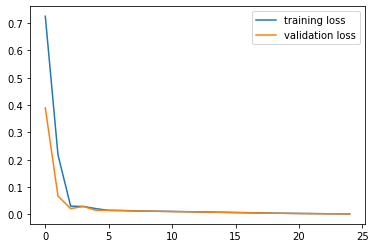

In [17]:
plt.plot(hist['loss'], label='training loss')
plt.plot(hist['val_loss'], label='validation loss')
plt.legend()

# Datasets

Load the first few batches

In [18]:
train_dataset = np.vstack([train_generator[i][0] for i in tqdm(range(50))])
train_dataset.shape

(819200, 2048, 1)

In [19]:
validation_dataset = np.vstack([validation_generator[i][0] for i in tqdm(range(5))])
validation_dataset.shape

(81920, 2048, 1)

# Predictions

In [20]:
train_pred = model.predict(train_dataset, verbose=1, batch_size=train_generator.batch_size)
train_pred.shape

50/50 [==============================] - 94s 2s/step


(819200, 2048, 1)

In [21]:
validation_pred = model.predict(validation_dataset, verbose=1, batch_size=validation_generator.batch_size)
validation_pred.shape

5/5 [==============================] - 6s 1s/step


(81920, 2048, 1)

In [22]:
MAE_train = abs(train_pred - train_dataset).mean(axis=1).squeeze()
MAE_train.shape

(819200,)

In [23]:
MAE_validation = abs(validation_pred - validation_dataset).mean(axis=1).squeeze()
MAE_validation.shape

(81920,)

Text(0.5, 1.0, 'train dataset')

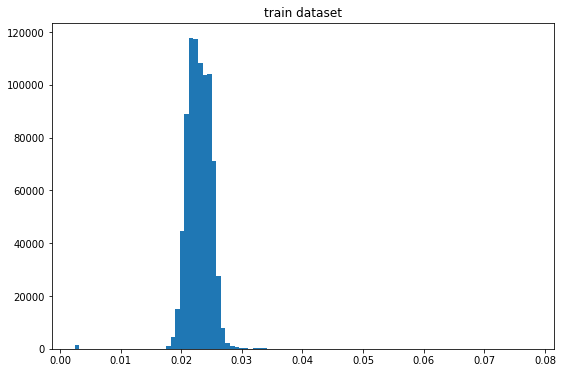

In [46]:
plt.figure(figsize=(9, 6))
n, bins, _ = plt.hist(MAE_train, bins=100)
plt.title("train dataset")
# plt.yscale('log')

rough peak

In [29]:
hist_peak_train = bins[n.argmax()]
hist_peak_train

0.021271291443554222

Text(0.5, 1.0, 'validation dataset')

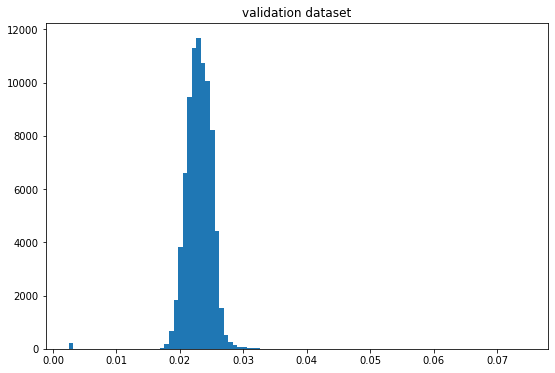

In [30]:
plt.figure(figsize=(9, 6))
n, bins, _ = plt.hist(MAE_validation, bins=100)
plt.title("validation dataset")

In [31]:
hist_peak_validation = bins[n.argmax()]
hist_peak_validation

0.02259999751852111

In [32]:
max_MAE_indices = np.argsort(MAE_train)[::-1]

In [33]:
max_MAE_indices

array([236787, 726789, 134798, ...,  17916,  17917, 131134])

In [34]:
def plot_true_pred(true_signal, pred_signal):
    fig, axes = plt.subplots(2, figsize=(16, 6))
    axes[0].plot(true_signal)
    axes[0].plot(pred_signal)

    axes[1].plot(np.abs(np.diff(true_signal)))
    axes[1].plot(np.abs(np.diff(pred_signal)))
    return fig, axes

index:  236787
MAE:  0.07775358911021614
n_bunches        987
bunch_index     3270
bunch_number     975
Name: 8203, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6706/instability_data/06706_Inst_B1H_Q7_20180520_12h23m14s.h5


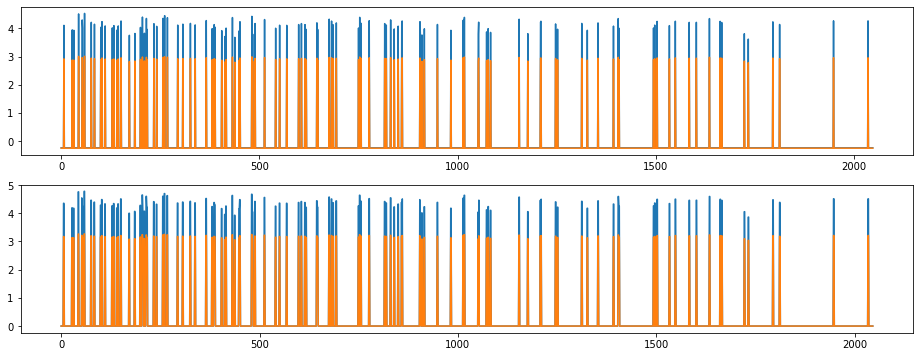

In [35]:
anomalous = 0
anomalous_index = max_MAE_indices[anomalous]

print('index: ', anomalous_index)
print("MAE: ", MAE_train[anomalous_index])
# I'm not sure this row is correct
metadata_row = train_generator.metadata.iloc[anomalous_index // 32]
print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
print(metadata_row['file'])

true_signal = train_dataset[anomalous_index].squeeze()
pred_signal = train_pred[anomalous_index].squeeze()

plot_true_pred(true_signal, pred_signal);

# Top rightmost signals

index:  236787
MAE:  0.07775358911021614
n_bunches        987
bunch_index     3270
bunch_number     975
Name: 8203, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6706/instability_data/06706_Inst_B1H_Q7_20180520_12h23m14s.h5


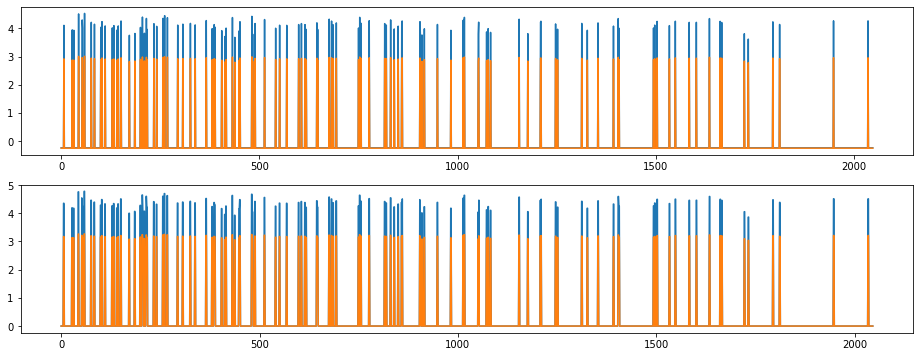

index:  726789
MAE:  0.07185561041124588
n_bunches        733
bunch_index     3146
bunch_number     664
Name: 25206, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7477/instability_data/07477_Inst_B1H_Q7_20181127_07h35m15s.h5


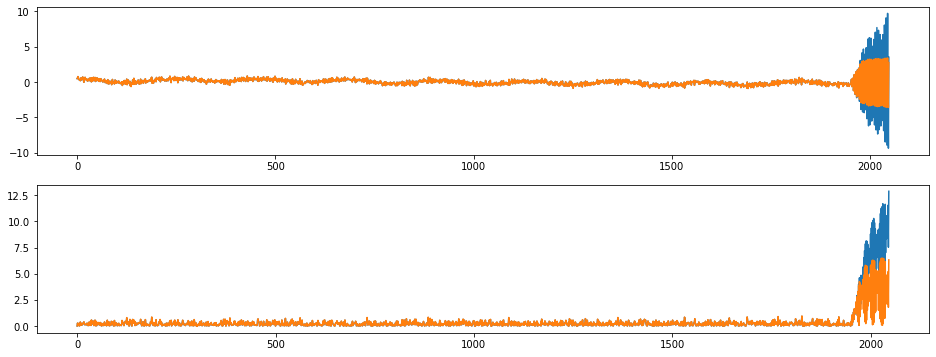

index:  134798
MAE:  0.0694756449169145
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


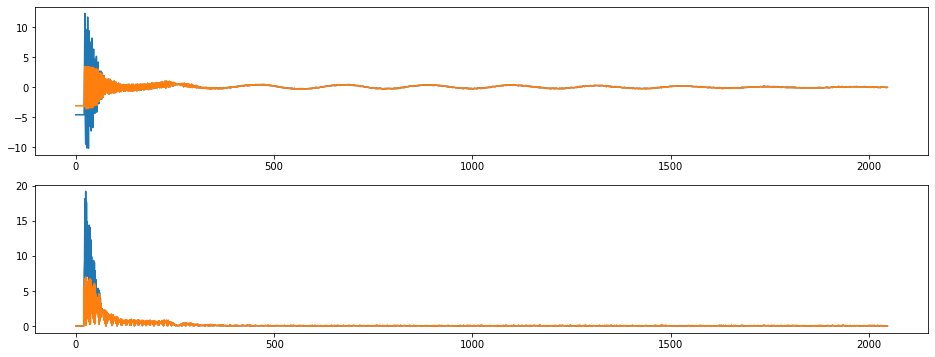

index:  134796
MAE:  0.069465489350032
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


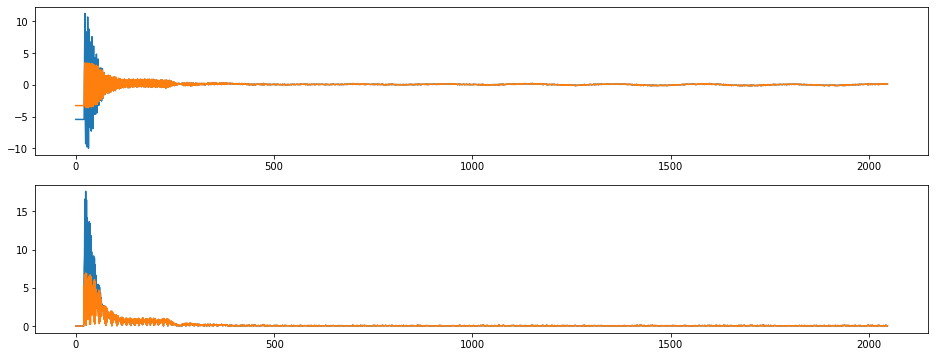

index:  134804
MAE:  0.069462965422858
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


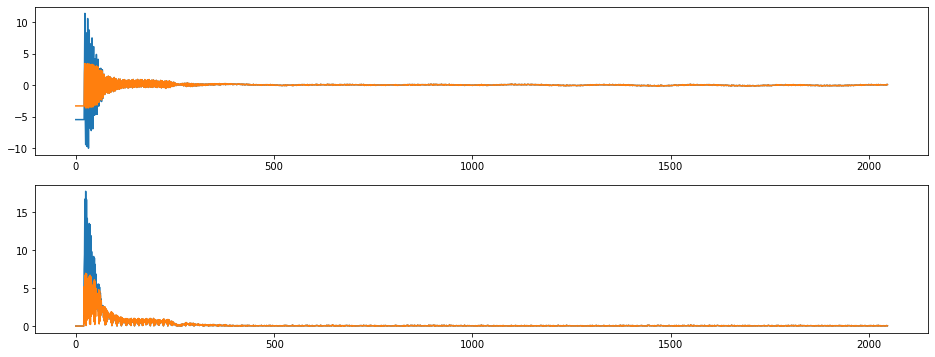

index:  134768
MAE:  0.06930230120080567
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


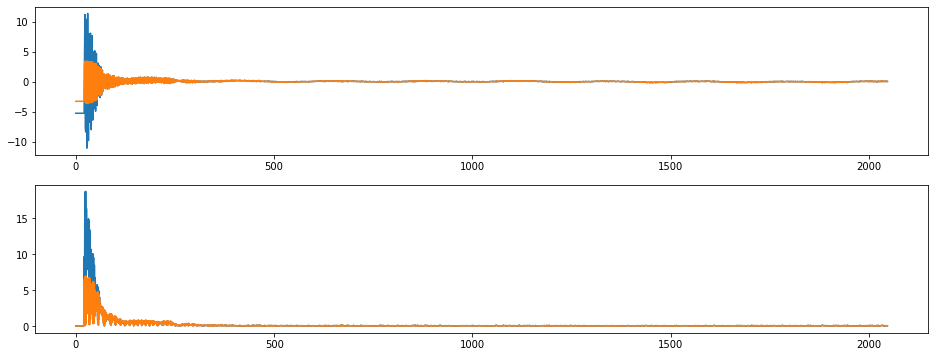

index:  134774
MAE:  0.06923491920347027
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


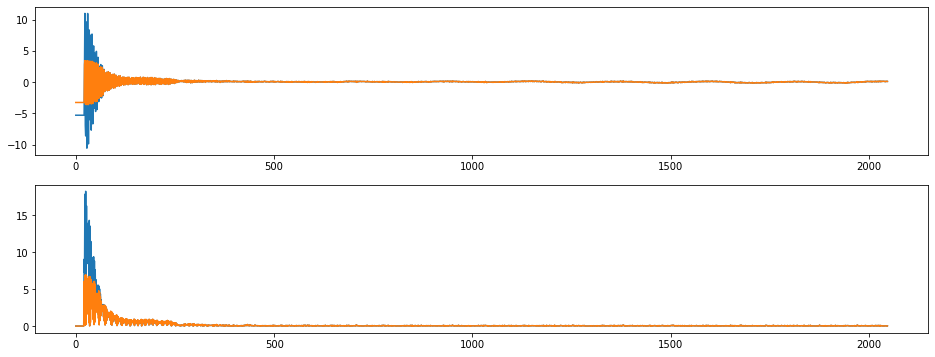

index:  134799
MAE:  0.069086799452776
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


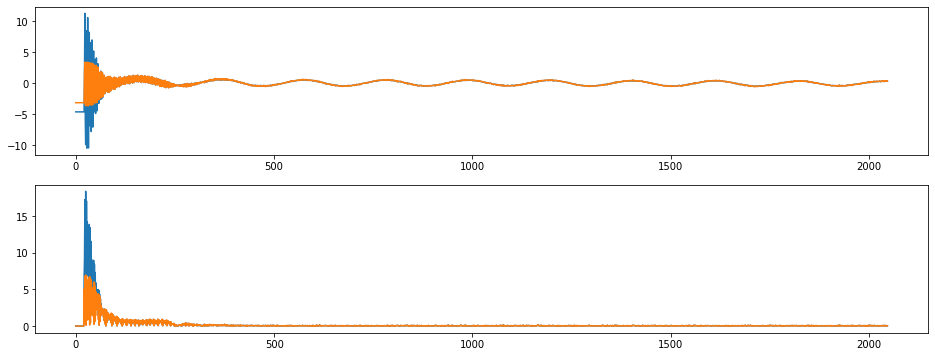

index:  134776
MAE:  0.06908231340967373
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


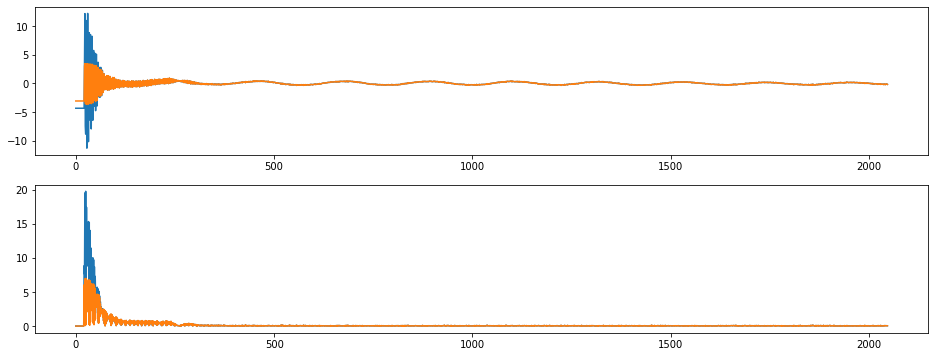

index:  134788
MAE:  0.06903235881562286
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


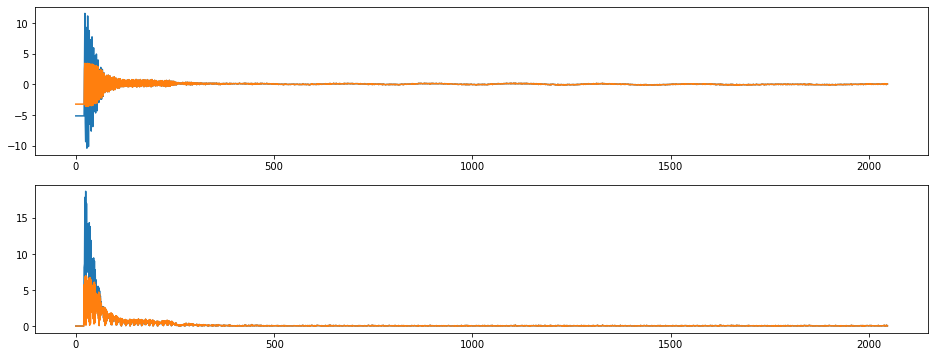

index:  134807
MAE:  0.06889088485465286
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


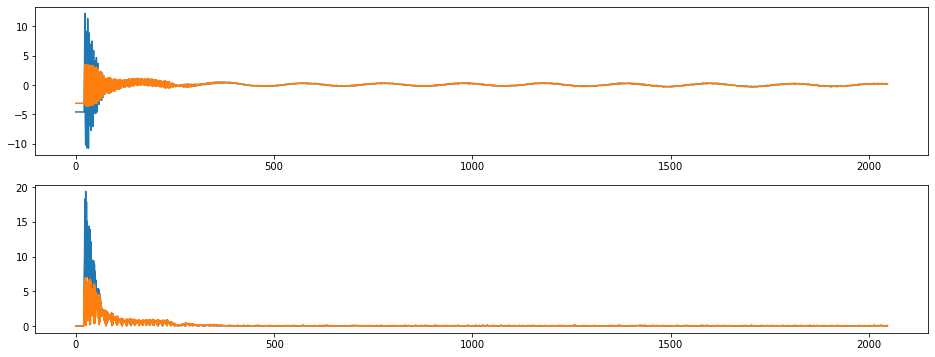

index:  134802
MAE:  0.0688292259098722
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


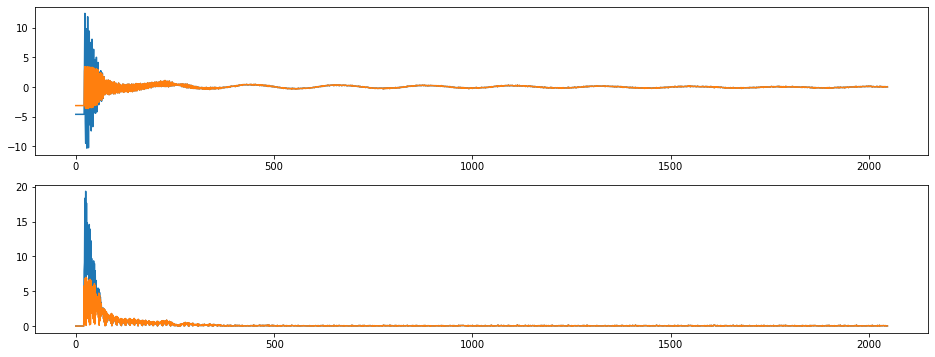

index:  134800
MAE:  0.06882787837523385
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


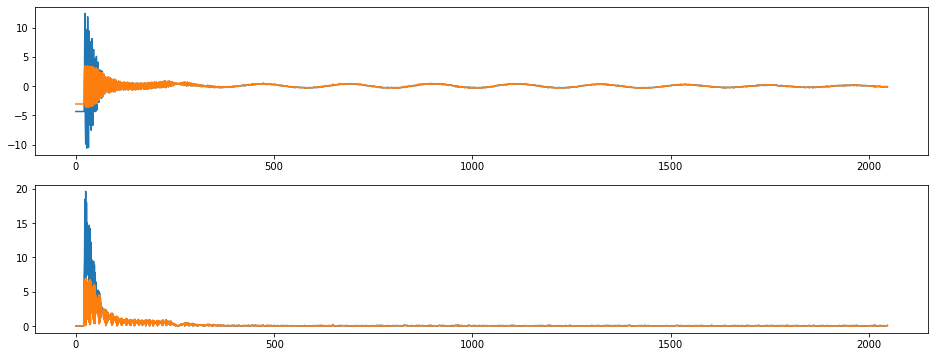

index:  134782
MAE:  0.06881458827859327
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


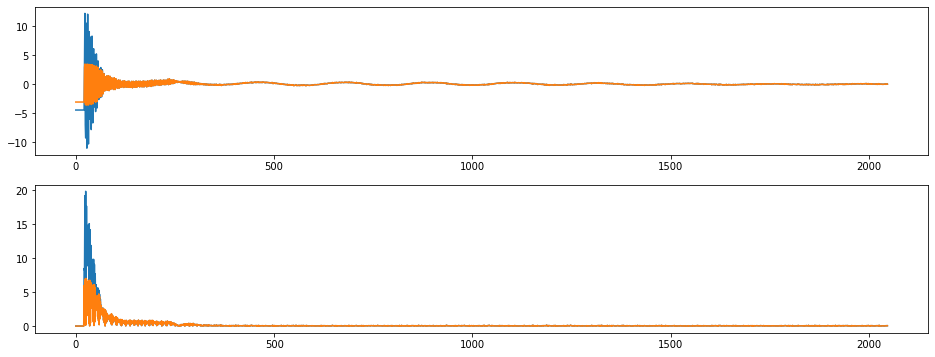

index:  134806
MAE:  0.06868704496288613
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


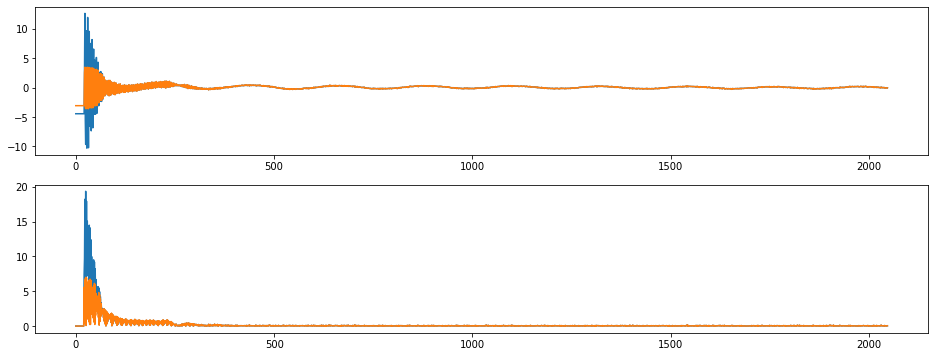

index:  134790
MAE:  0.06859235514887249
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


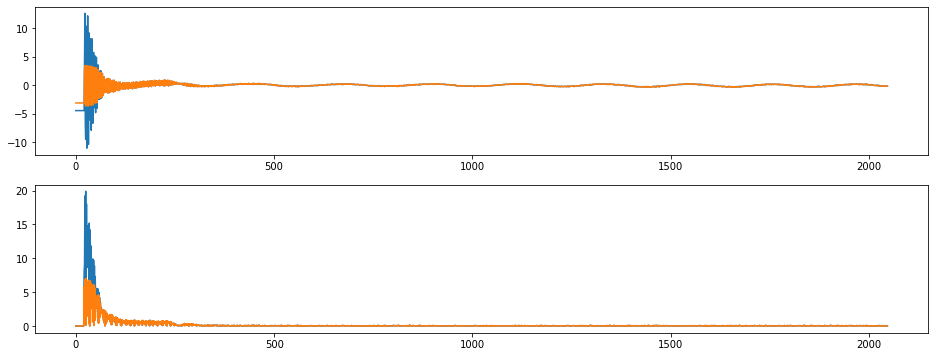

index:  134747
MAE:  0.06855601751981222
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


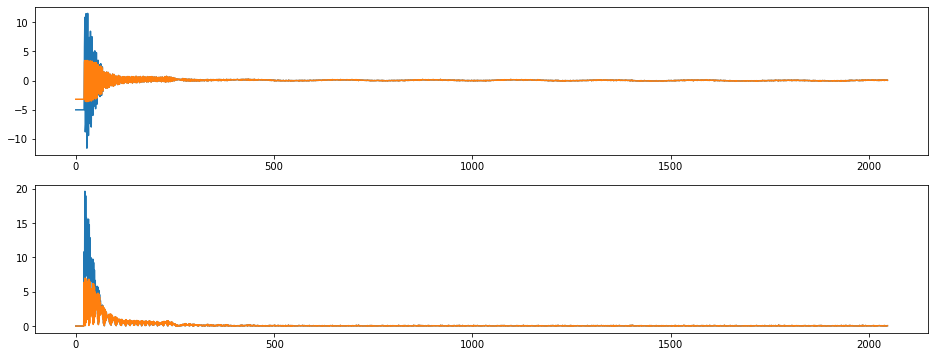

index:  134801
MAE:  0.06848260999332542
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


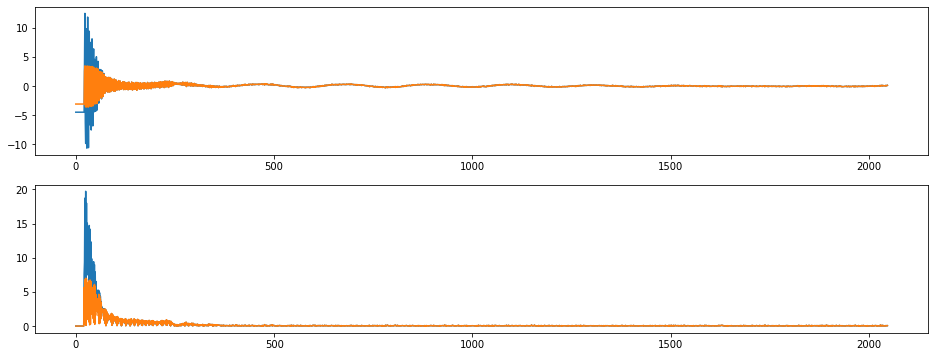

index:  134808
MAE:  0.06846532105429423
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


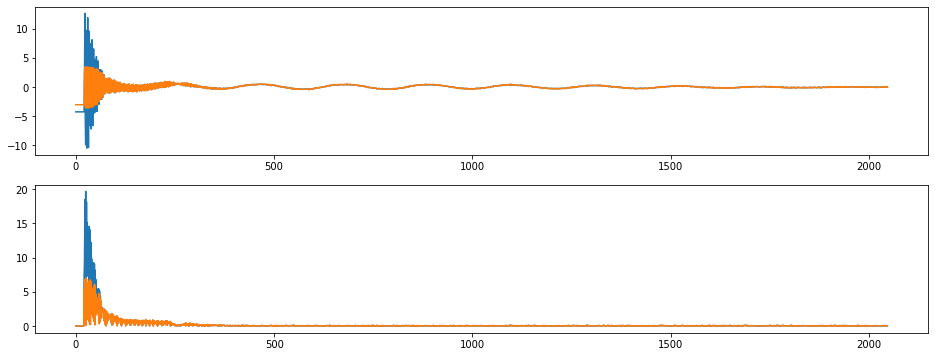

index:  134809
MAE:  0.06840903171329482
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


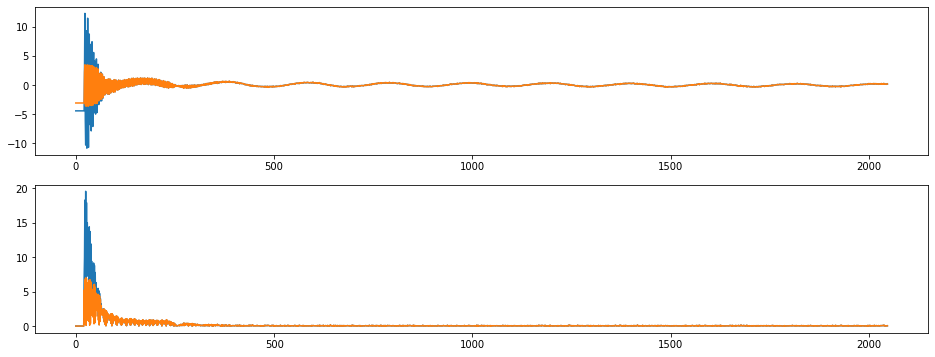

index:  134775
MAE:  0.06834129329566861
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


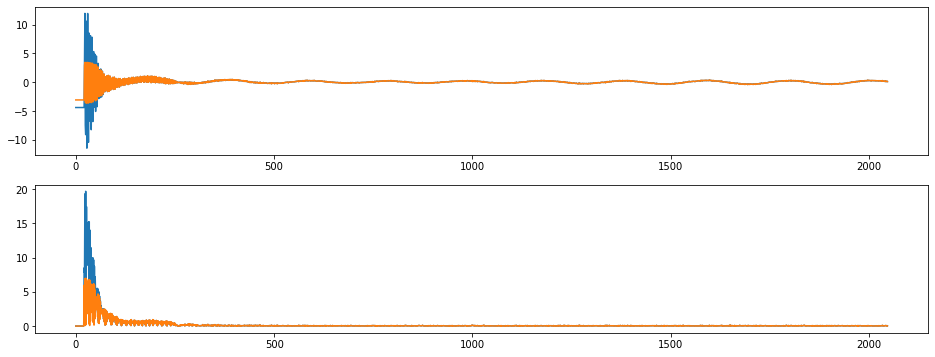

index:  134789
MAE:  0.06829246556287528
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


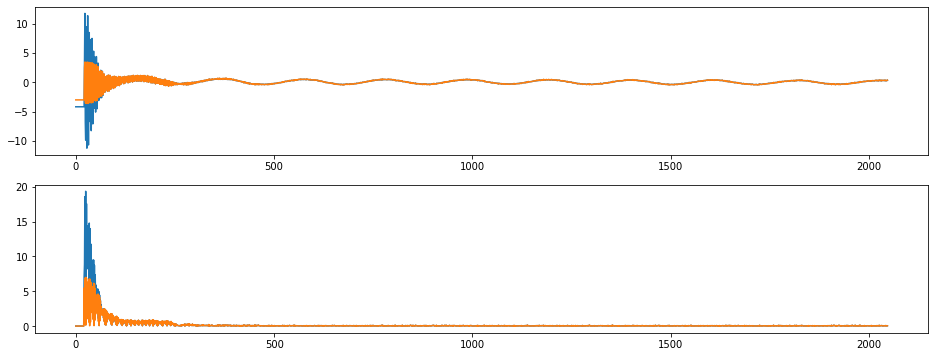

index:  134791
MAE:  0.06816490250115631
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


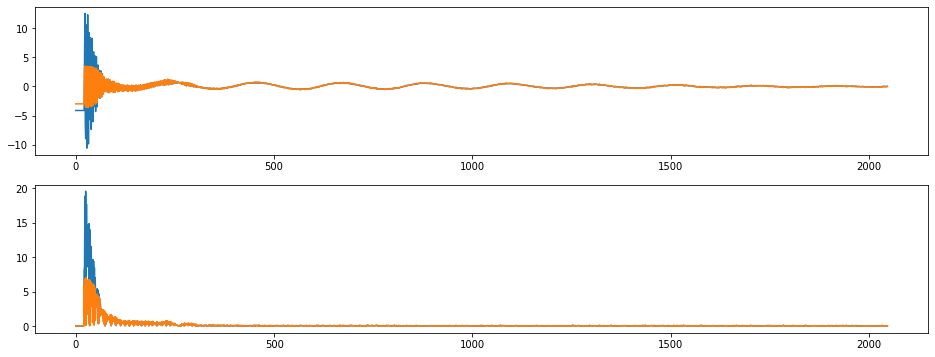

index:  134753
MAE:  0.06811992345908523
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


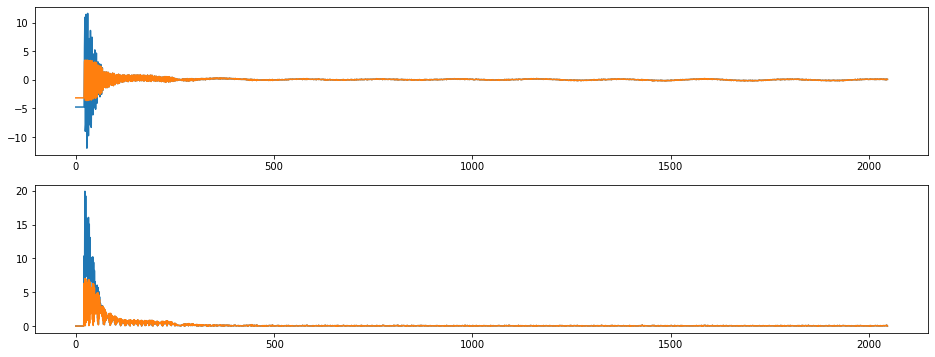

index:  134797
MAE:  0.06804433346610149
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


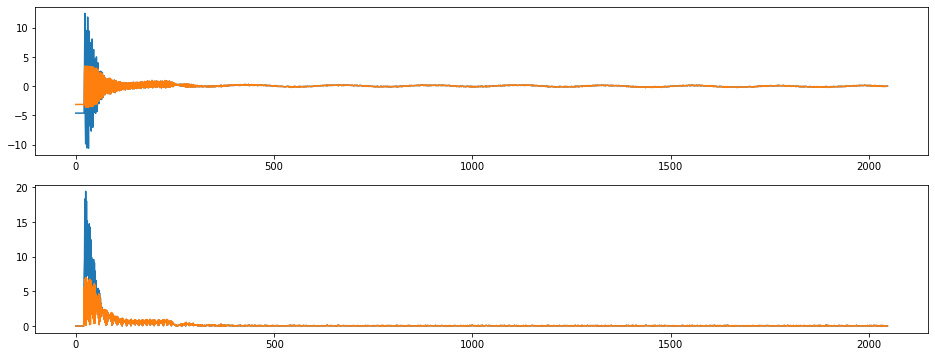

index:  134763
MAE:  0.0679501625963341
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


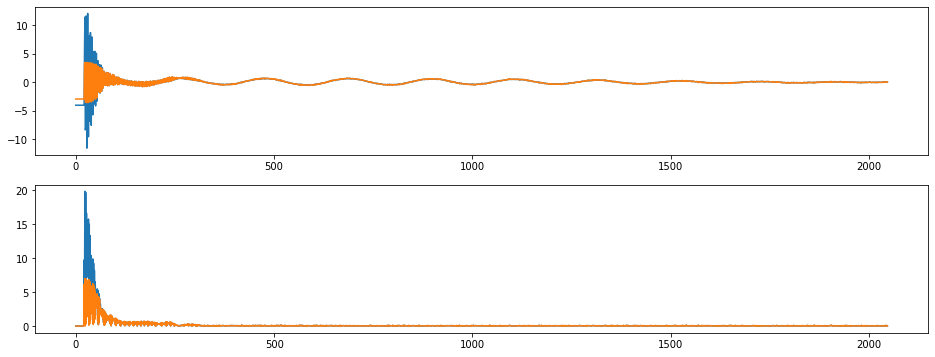

index:  134739
MAE:  0.06788042549783013
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


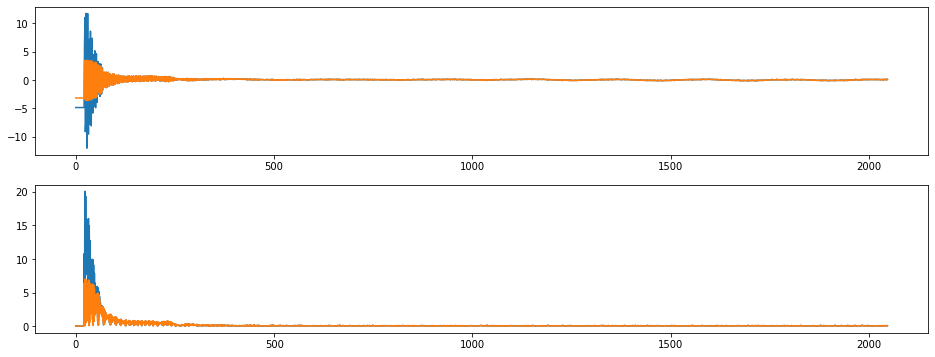

index:  134731
MAE:  0.06787115287102549
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


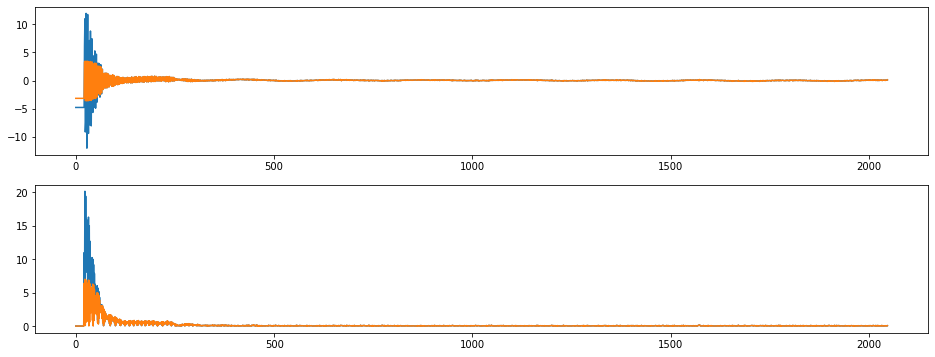

index:  235251
MAE:  0.06784116624722085
n_bunches        987
bunch_index     3208
bunch_number     920
Name: 8148, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6706/instability_data/06706_Inst_B1H_Q7_20180520_12h23m14s.h5


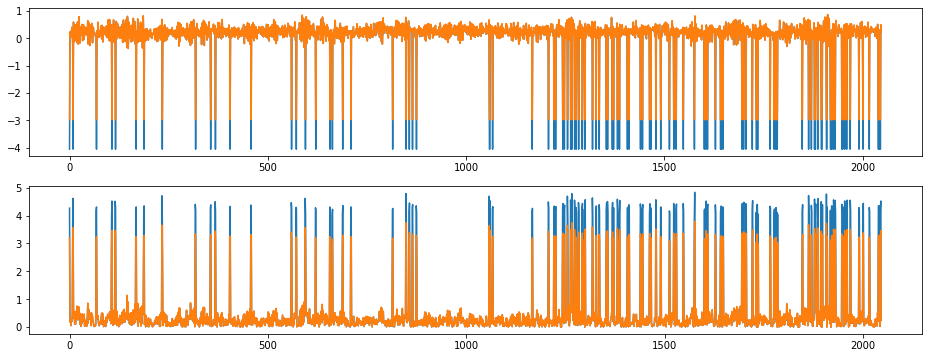

index:  134762
MAE:  0.06782397845351844
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


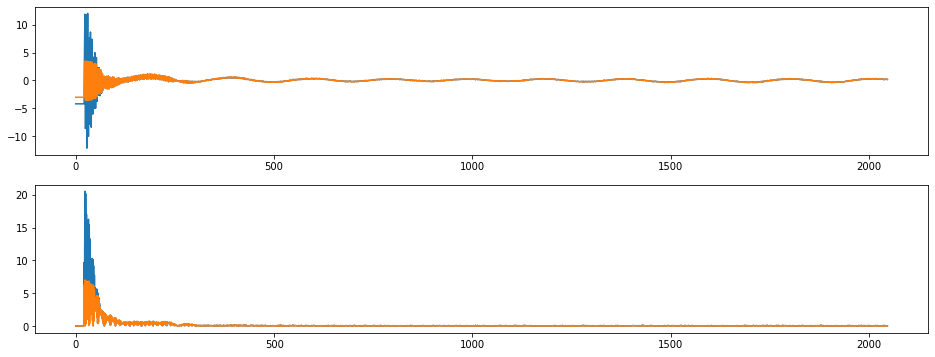

index:  134748
MAE:  0.06766919134186035
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


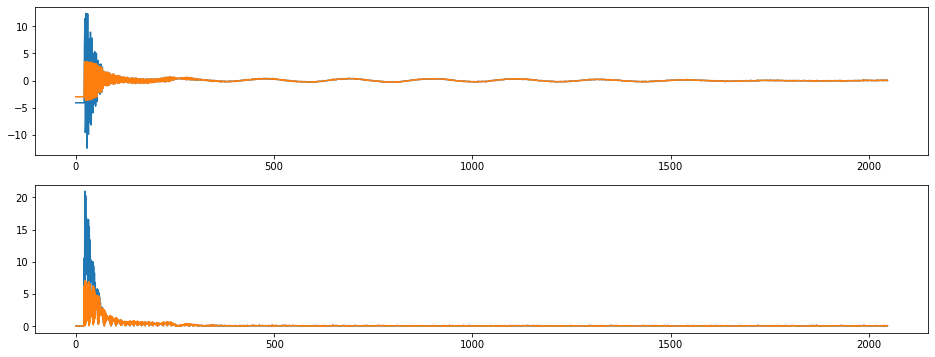

index:  134805
MAE:  0.06765368676541603
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


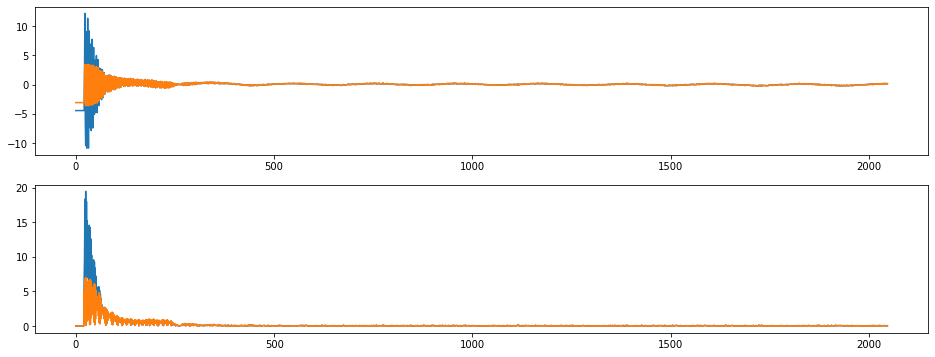

index:  134756
MAE:  0.0674603525447721
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


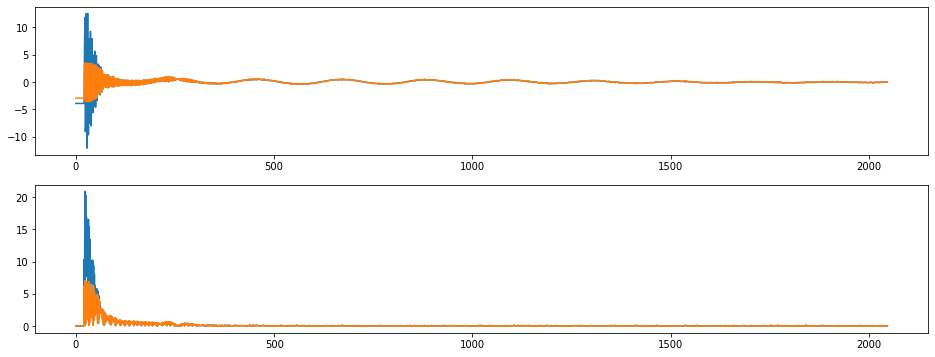

index:  134781
MAE:  0.06745483549170493
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


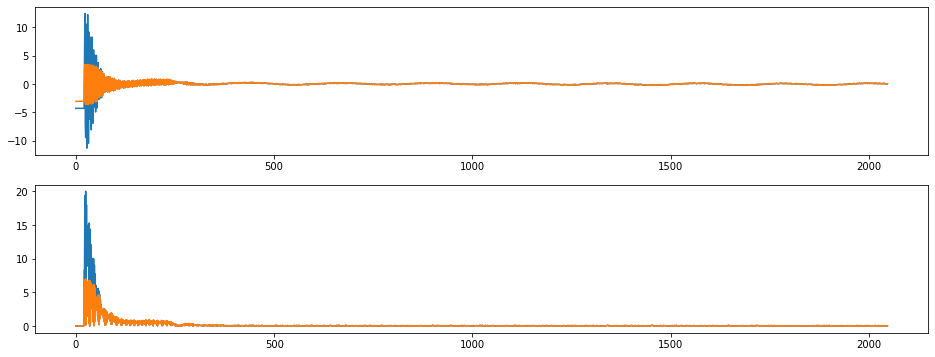

index:  134777
MAE:  0.06741979280109665
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


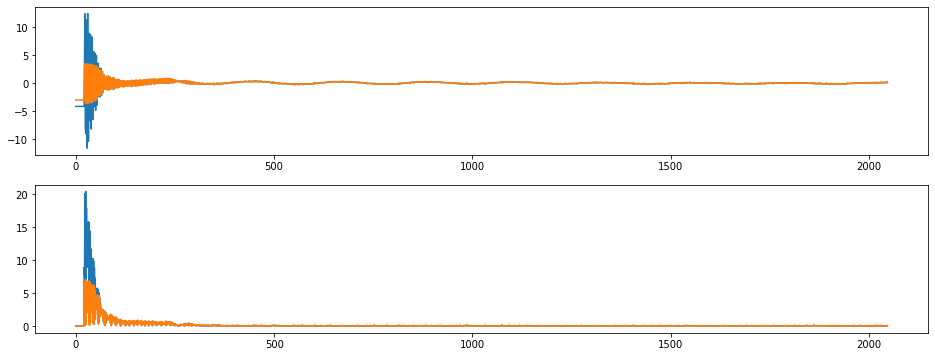

index:  134810
MAE:  0.0673206989505108
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


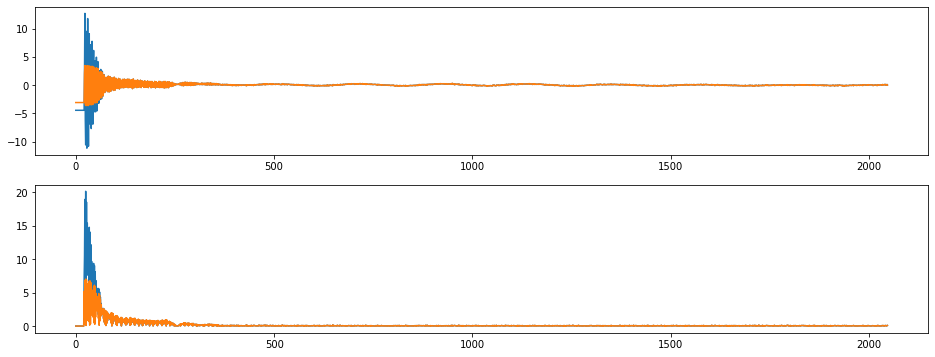

index:  134741
MAE:  0.06710613844853296
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


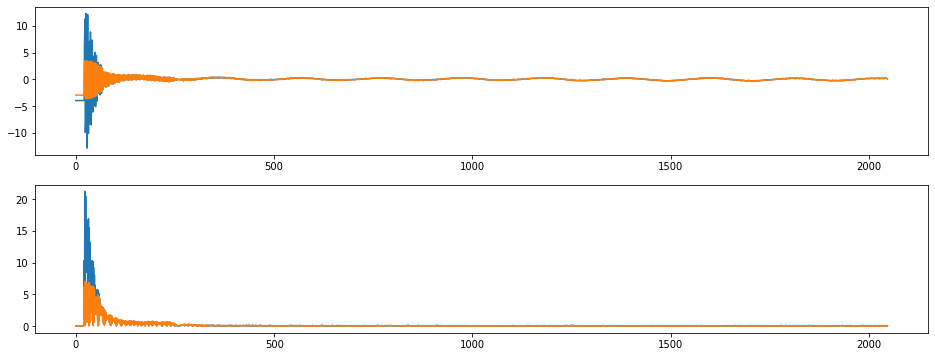

index:  134749
MAE:  0.06706893121414789
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


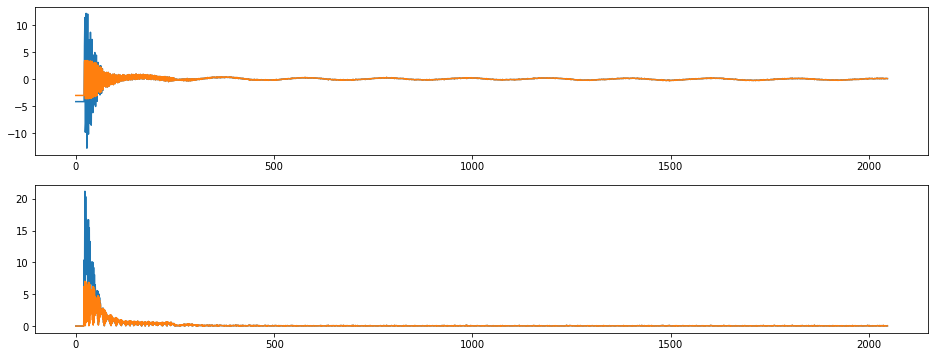

index:  134761
MAE:  0.06697544480806536
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


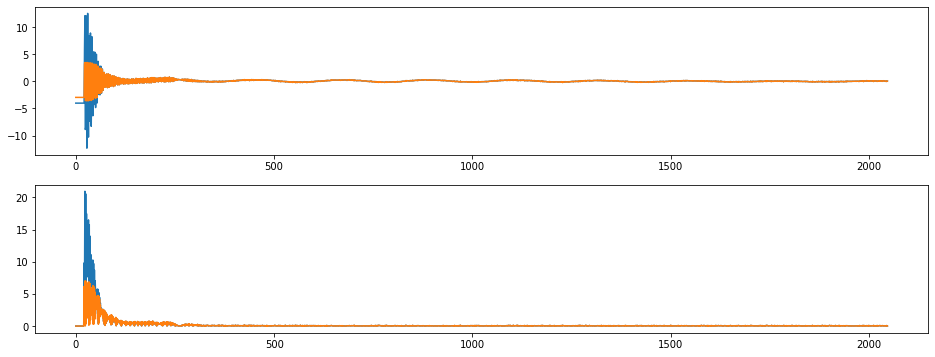

index:  134751
MAE:  0.0668783054188566
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


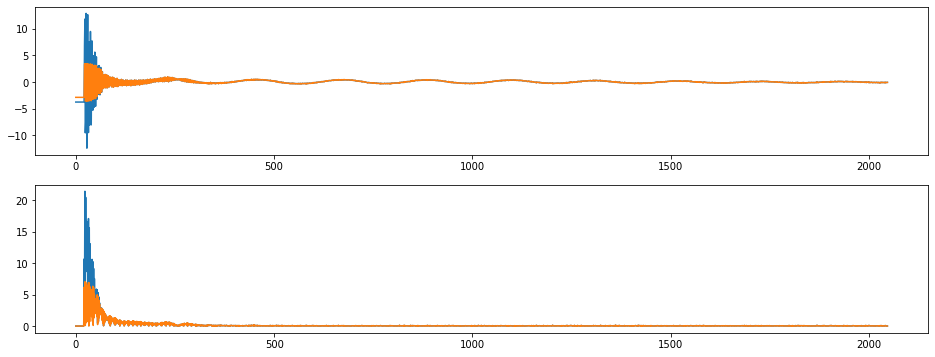

index:  134773
MAE:  0.06681799400561947
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


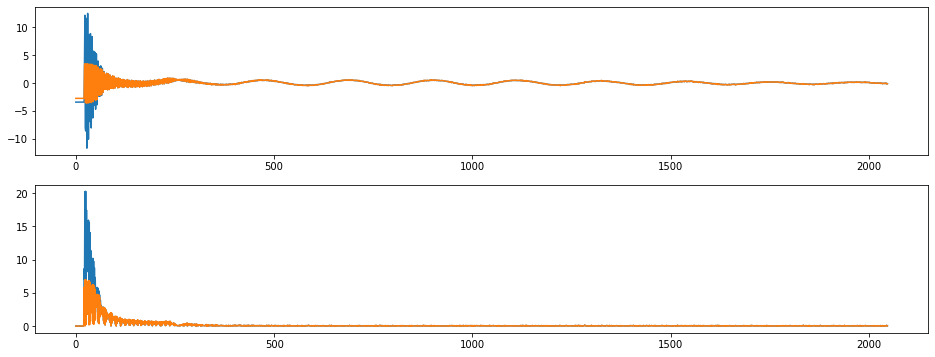

index:  134759
MAE:  0.06673459213271446
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


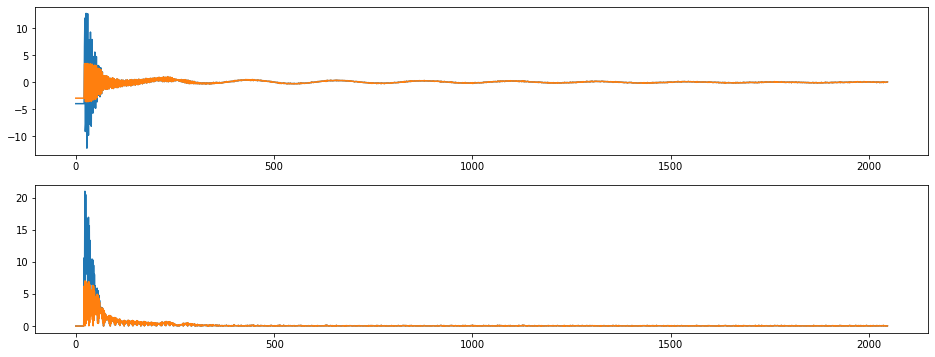

index:  134803
MAE:  0.06668913767222799
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


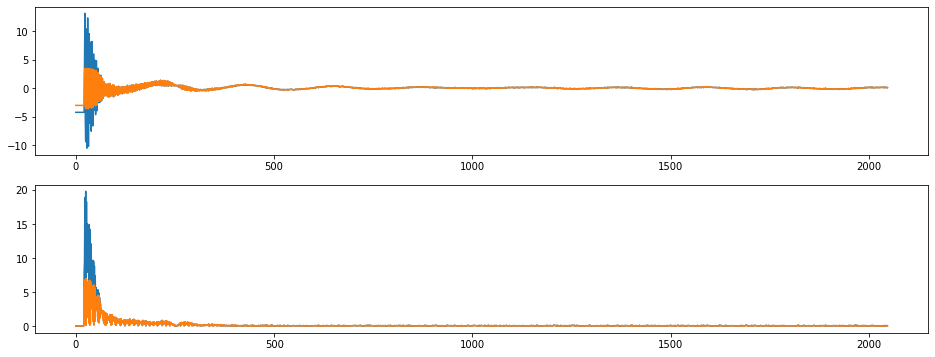

index:  134758
MAE:  0.06663676233161969
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


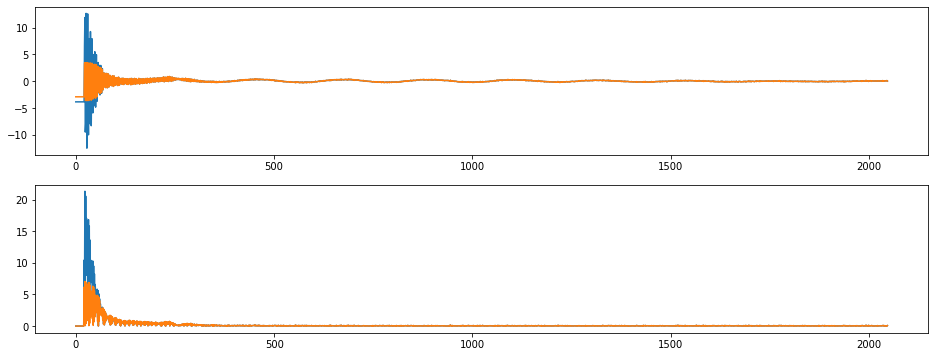

index:  134783
MAE:  0.0666271552381371
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


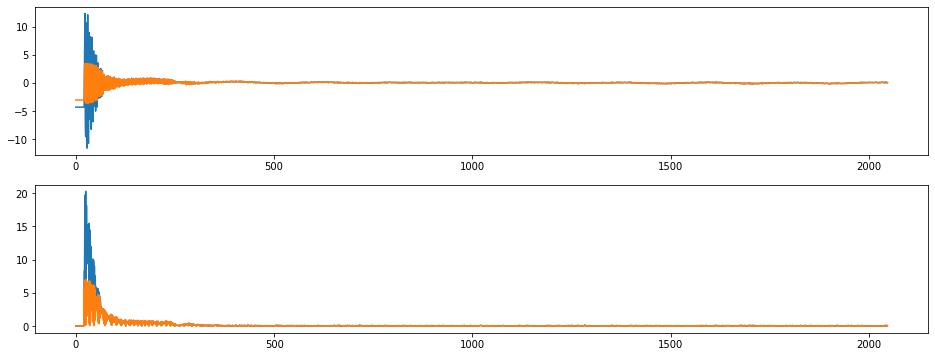

index:  134792
MAE:  0.066607923812446
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


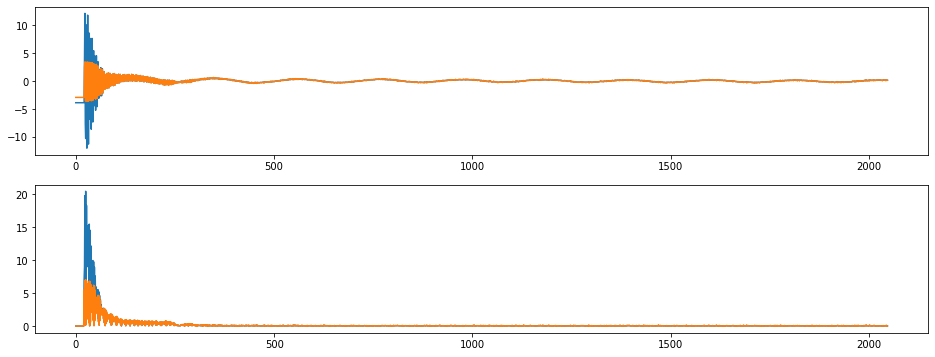

index:  134779
MAE:  0.06654636862593263
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


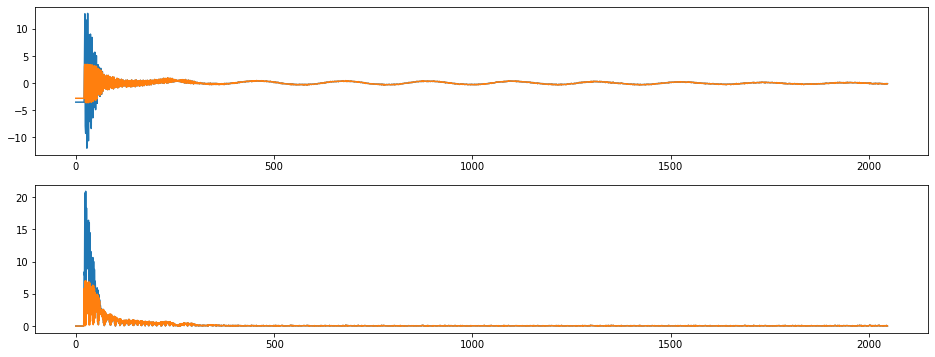

index:  134757
MAE:  0.06632814556950815
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


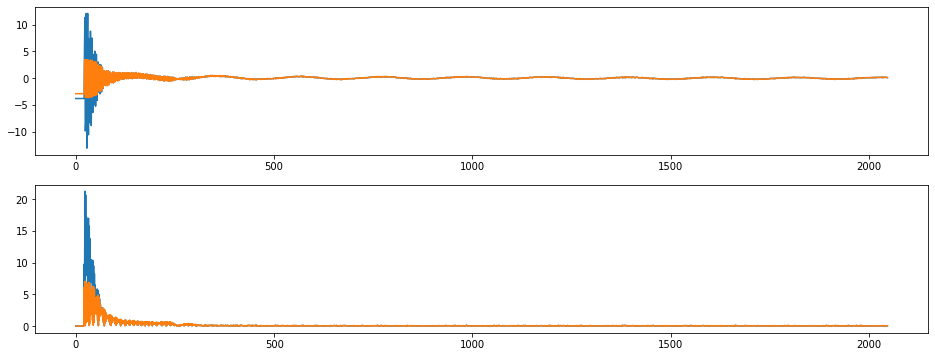

index:  134765
MAE:  0.06629099762560707
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


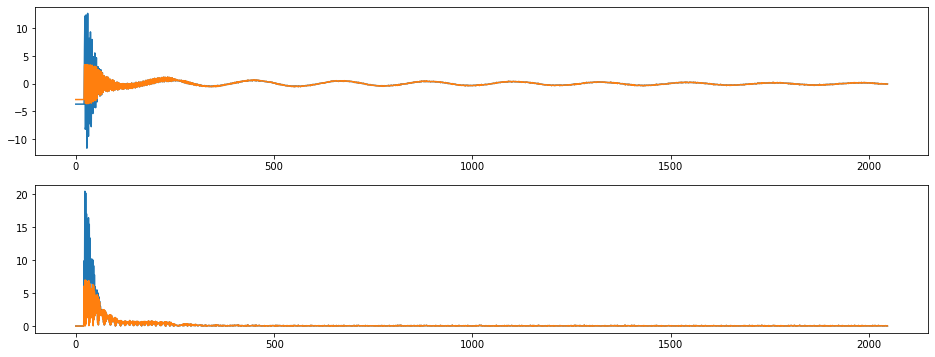

index:  134716
MAE:  0.06624228189454616
n_bunches        796
bunch_index     1366
bunch_number     750
Name: 4684, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


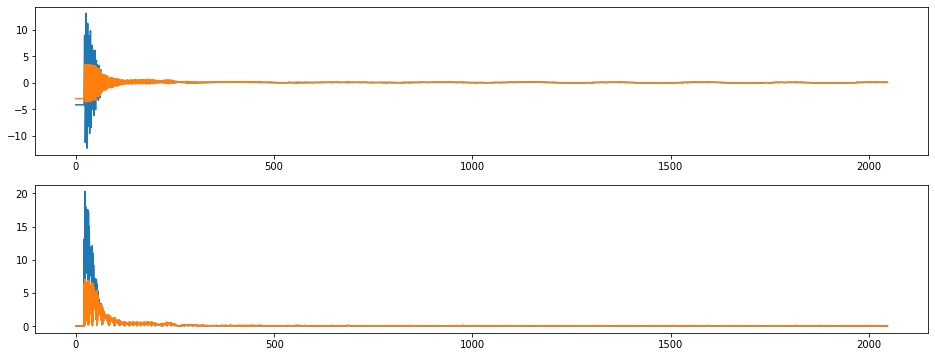

index:  134785
MAE:  0.06623340506429899
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


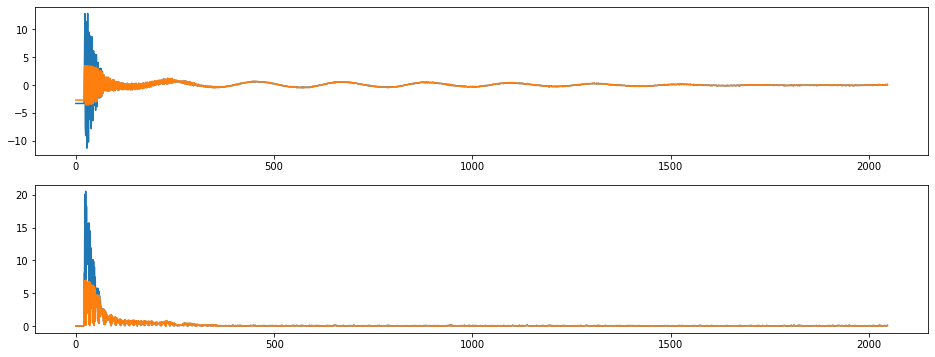

index:  134740
MAE:  0.06619605528030136
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


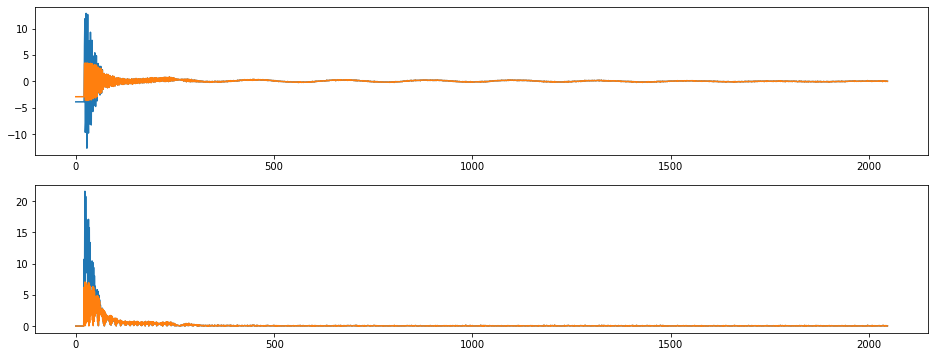

index:  134755
MAE:  0.06601023289322352
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


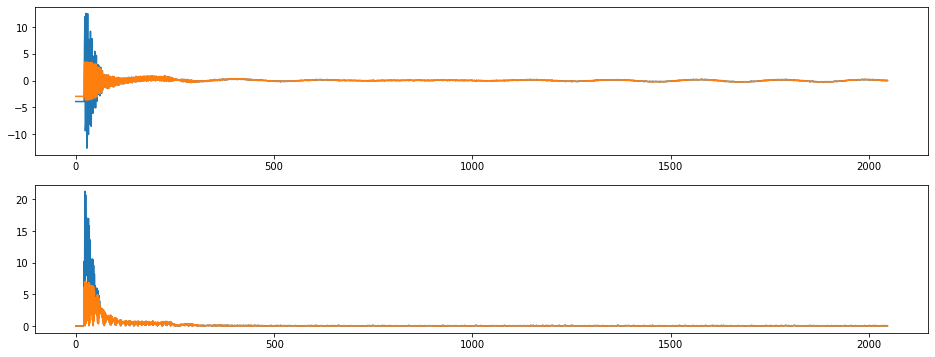

index:  134745
MAE:  0.06599239450704418
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


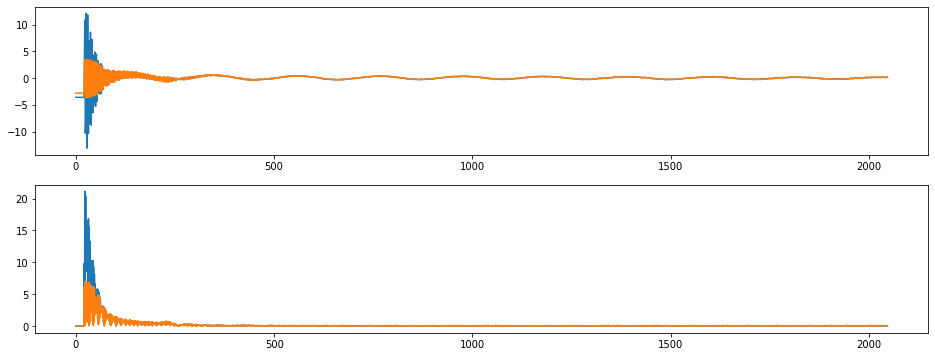

index:  134754
MAE:  0.06598268977564833
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


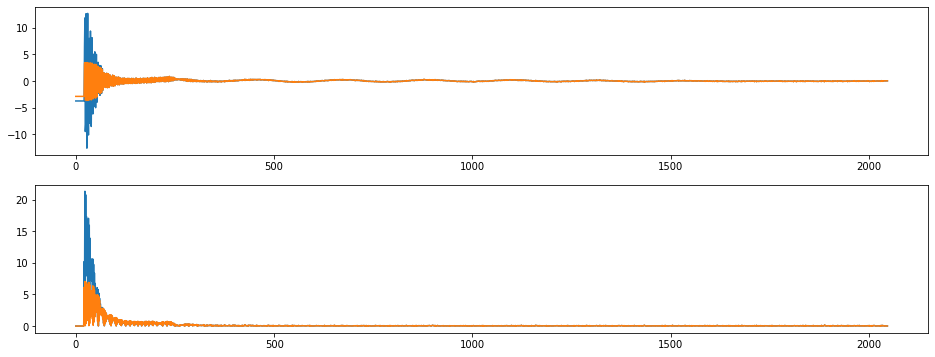

index:  134794
MAE:  0.06597097254378766
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


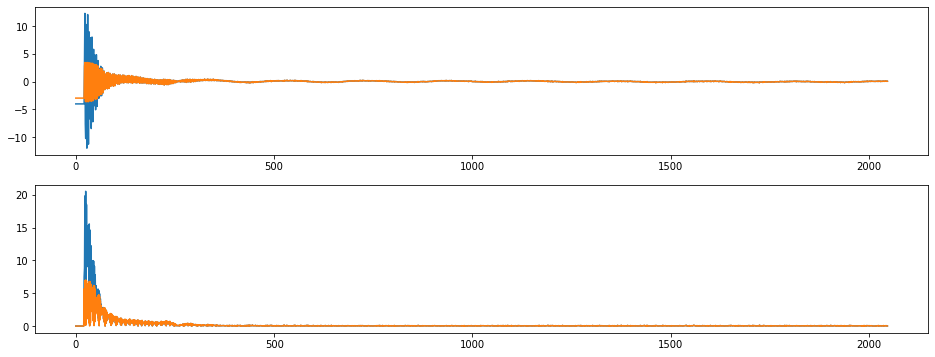

index:  134778
MAE:  0.0658452795353605
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


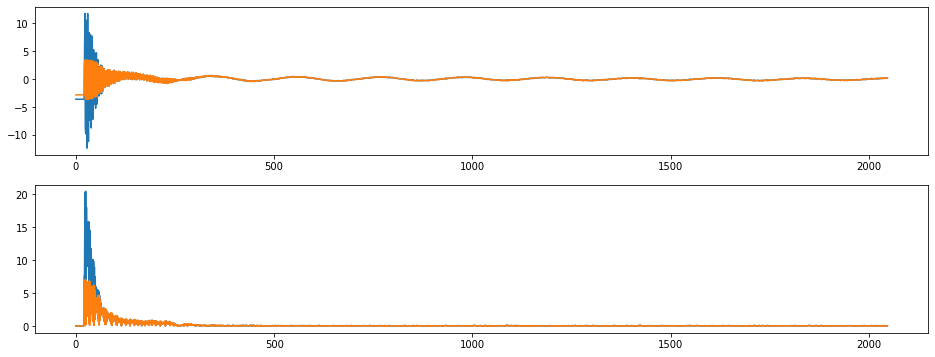

index:  134769
MAE:  0.06584177294993941
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


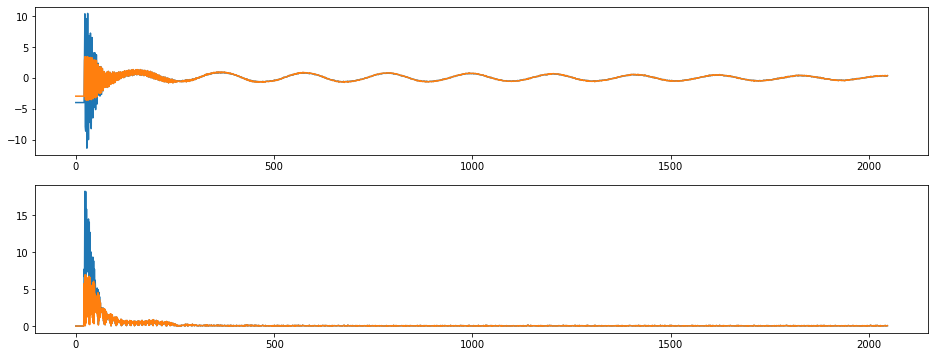

index:  134760
MAE:  0.06583692389606982
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


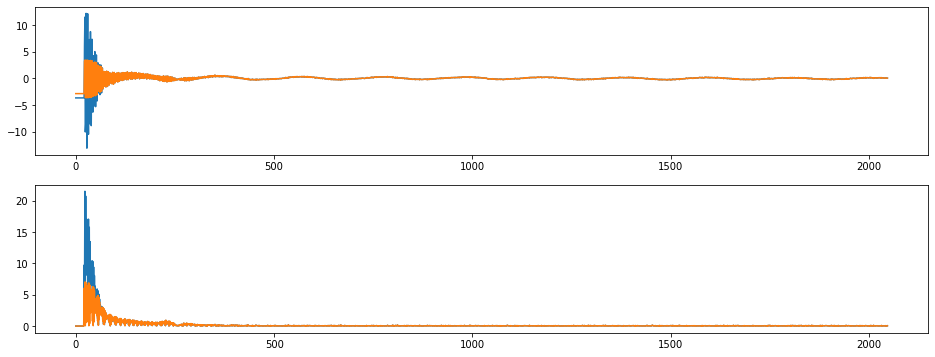

index:  134793
MAE:  0.06569783243406024
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


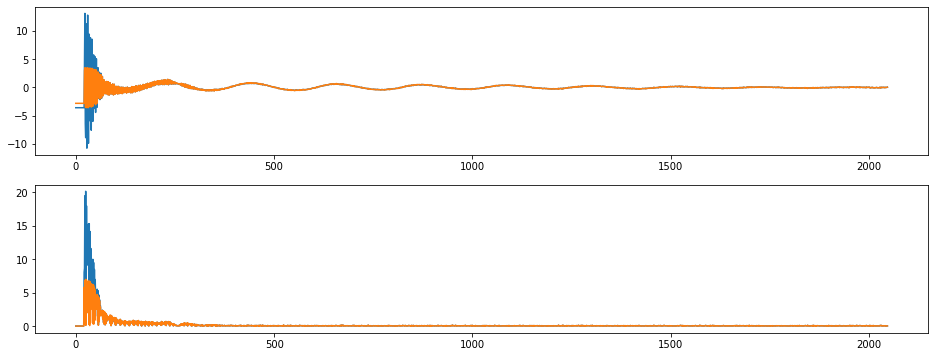

index:  134743
MAE:  0.065691703992272
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


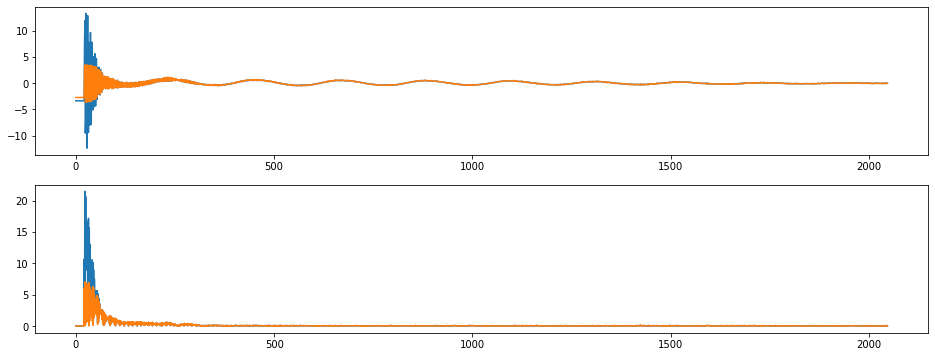

index:  134787
MAE:  0.06568292698962443
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


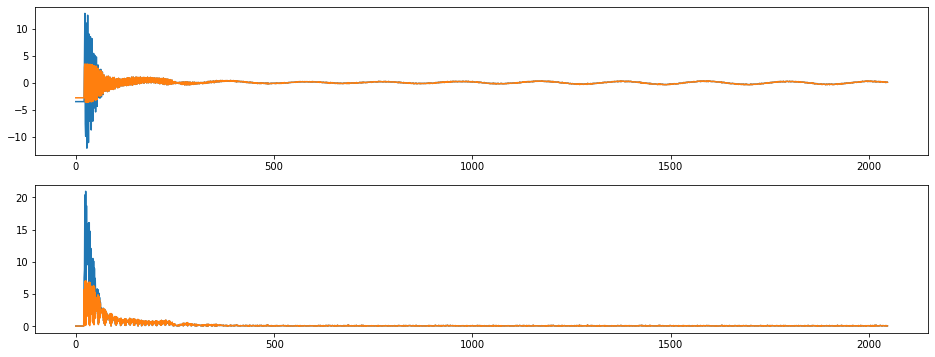

index:  134742
MAE:  0.06567368463245088
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


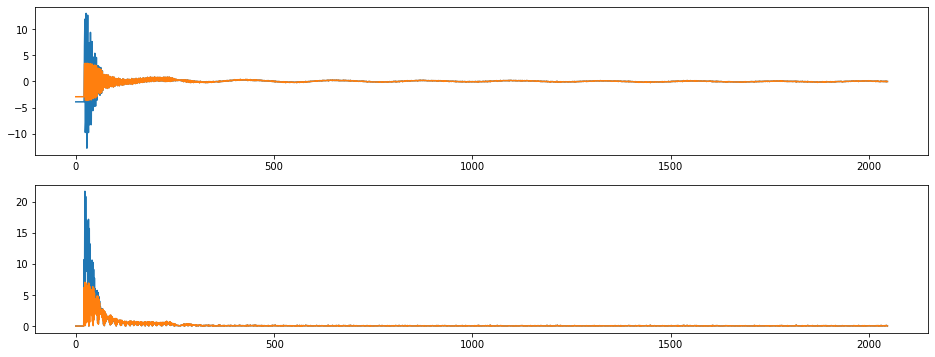

index:  134734
MAE:  0.06553860097844103
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


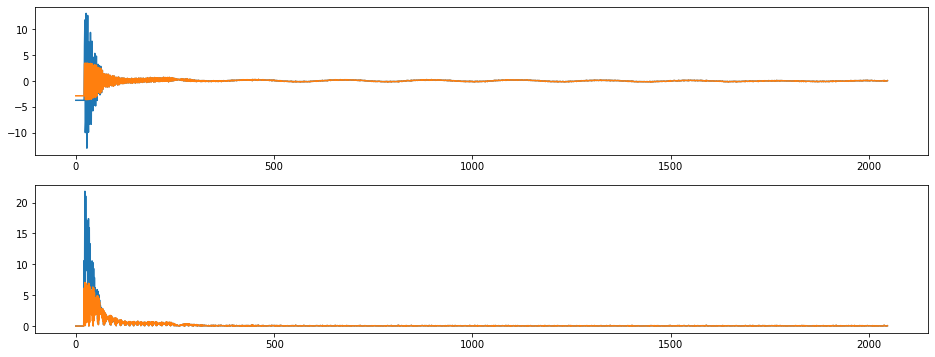

index:  134717
MAE:  0.06547021166629499
n_bunches        796
bunch_index     1366
bunch_number     750
Name: 4684, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


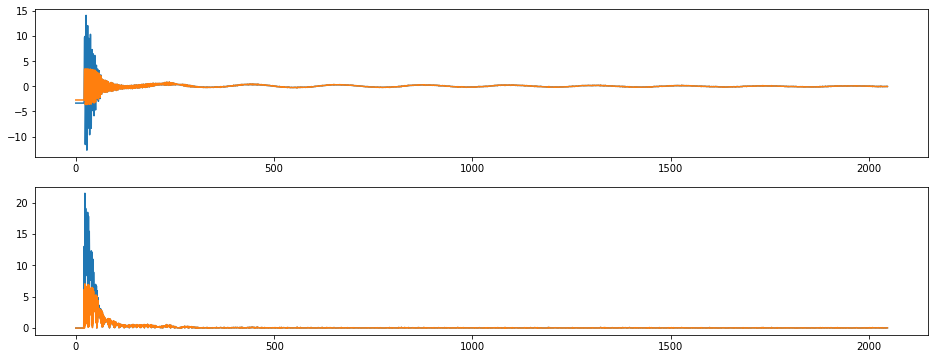

index:  134732
MAE:  0.06533534460259492
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


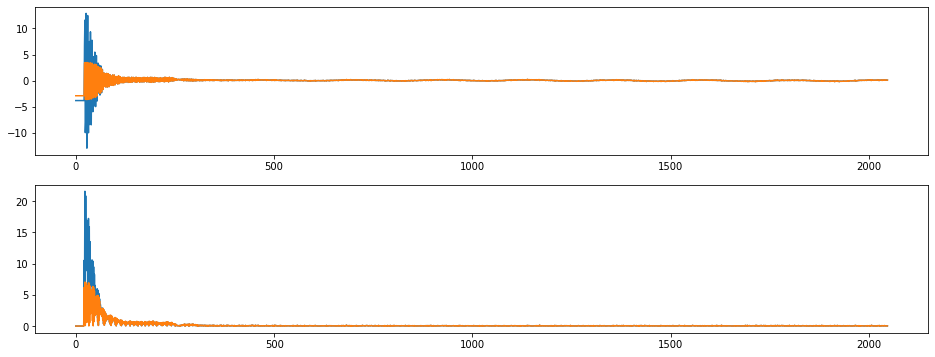

index:  134764
MAE:  0.06532631526689221
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


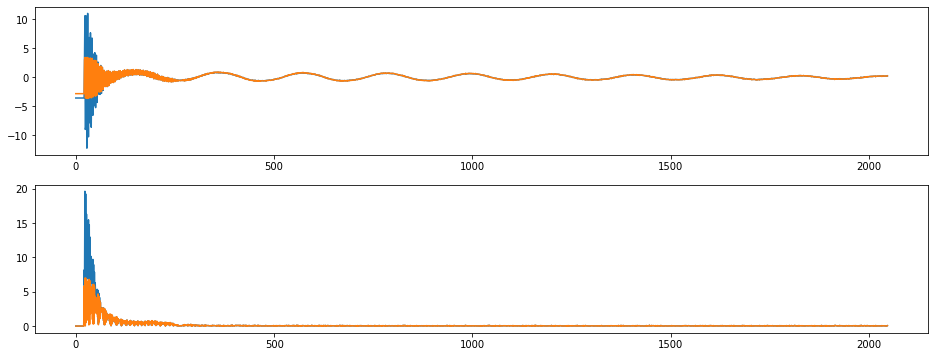

index:  134784
MAE:  0.06532512216775047
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


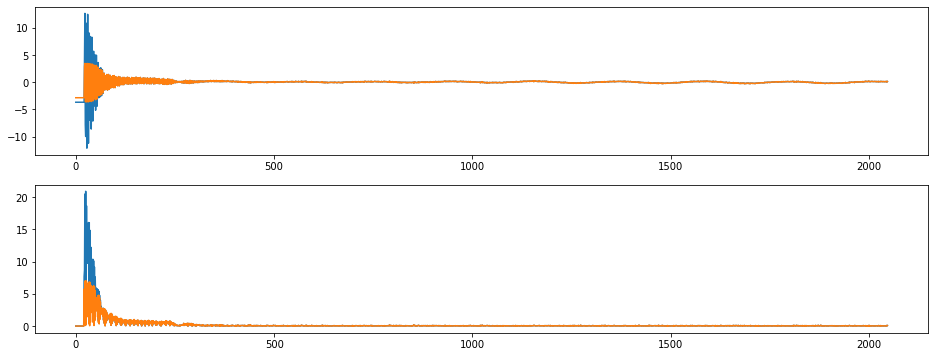

index:  134724
MAE:  0.06528985064476478
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


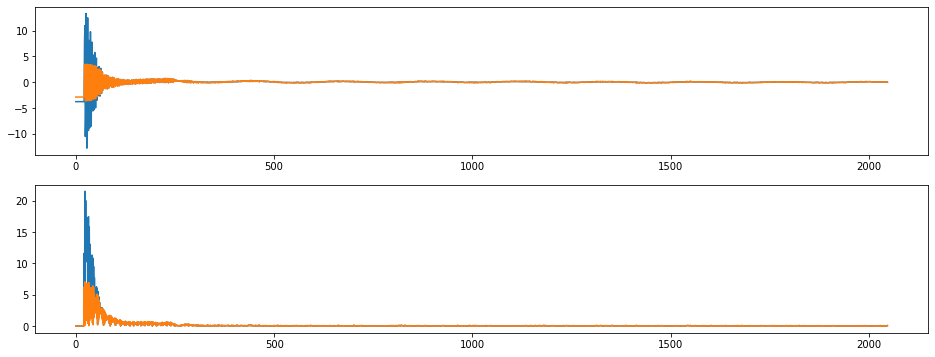

index:  134725
MAE:  0.06525324531876026
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


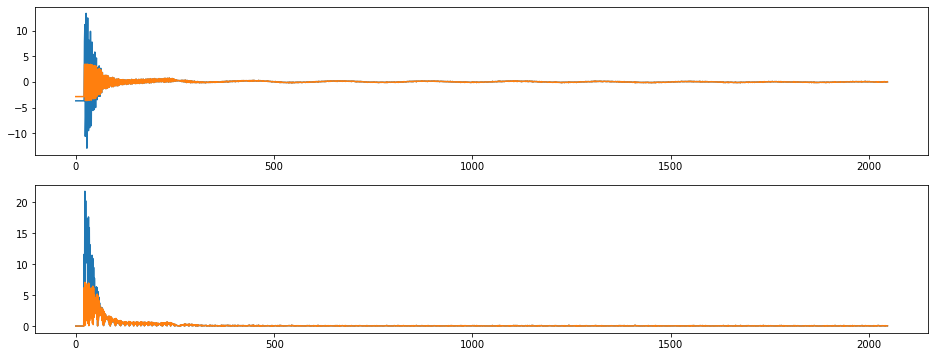

index:  134786
MAE:  0.06521869241046813
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


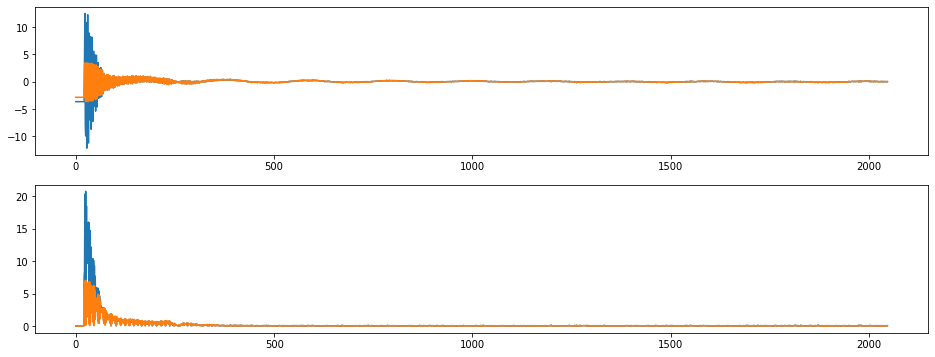

index:  134733
MAE:  0.06521212517333808
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


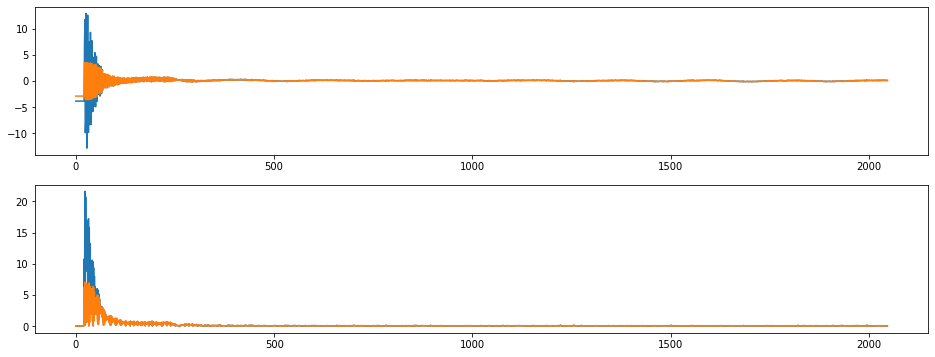

index:  134729
MAE:  0.0649957028219203
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


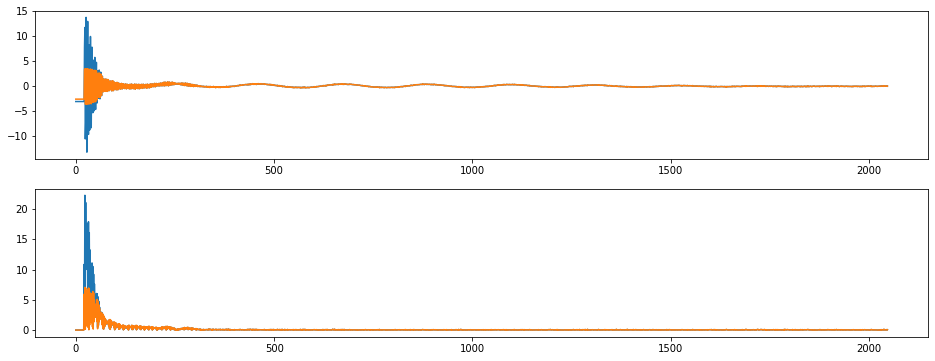

index:  134795
MAE:  0.06497733218044294
n_bunches        796
bunch_index     1369
bunch_number     753
Name: 4687, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


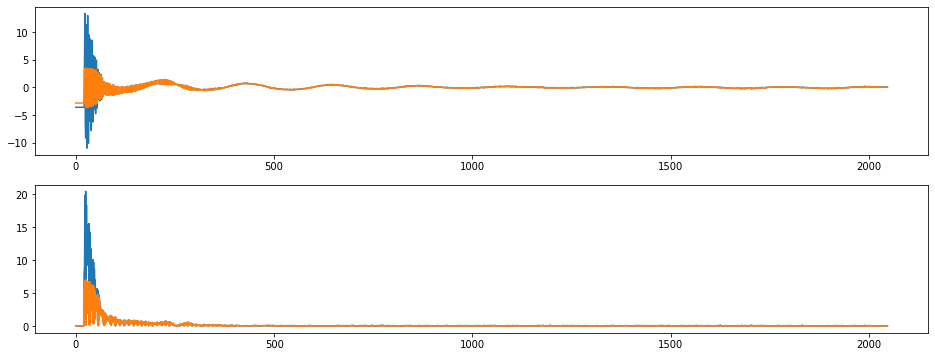

index:  134750
MAE:  0.06492179397410465
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


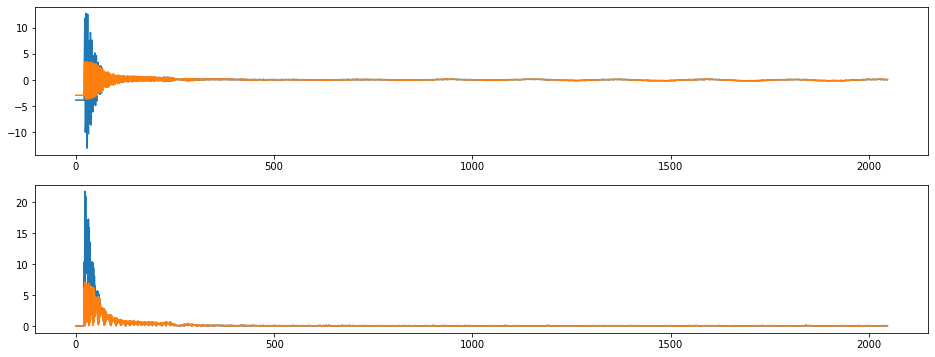

index:  134780
MAE:  0.06488688508797008
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


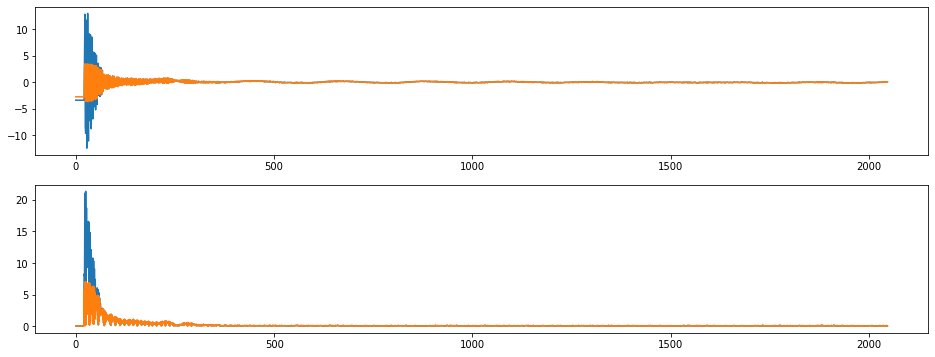

index:  134722
MAE:  0.06486848774281372
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


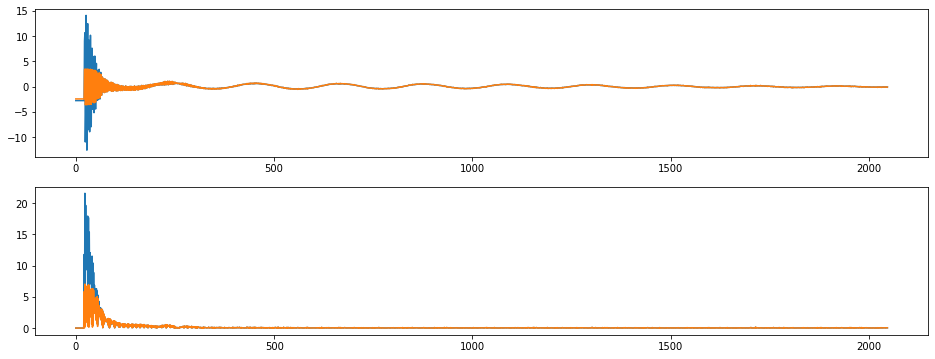

index:  134771
MAE:  0.06477550458256454
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


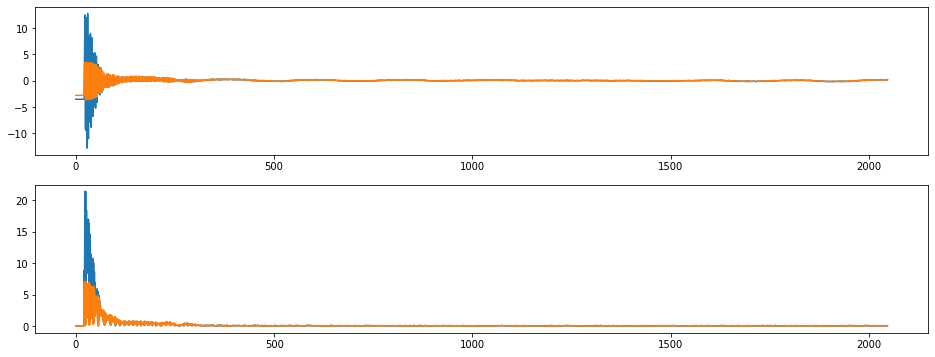

index:  134714
MAE:  0.06468285075676933
n_bunches        796
bunch_index     1366
bunch_number     750
Name: 4684, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


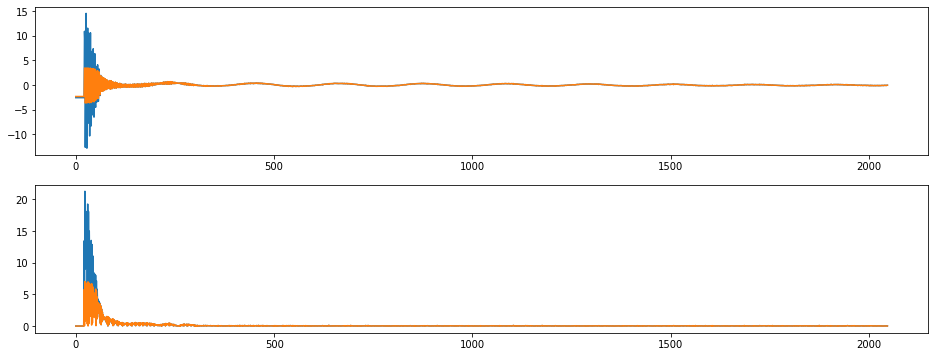

index:  134710
MAE:  0.06463015603999706
n_bunches        796
bunch_index     1366
bunch_number     750
Name: 4684, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


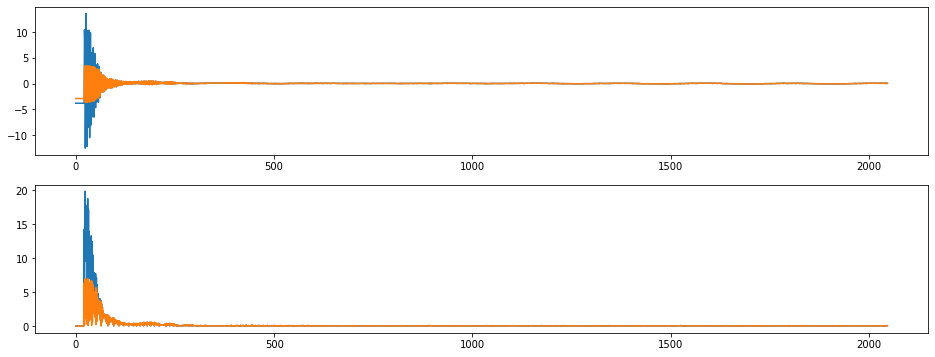

index:  480252
MAE:  0.06462382719068378
n_bunches       158
bunch_index     302
bunch_number     81
Name: 16669, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6972/instability_data/06972_Inst_B1H_Q7_20180724_23h50m14s.h5


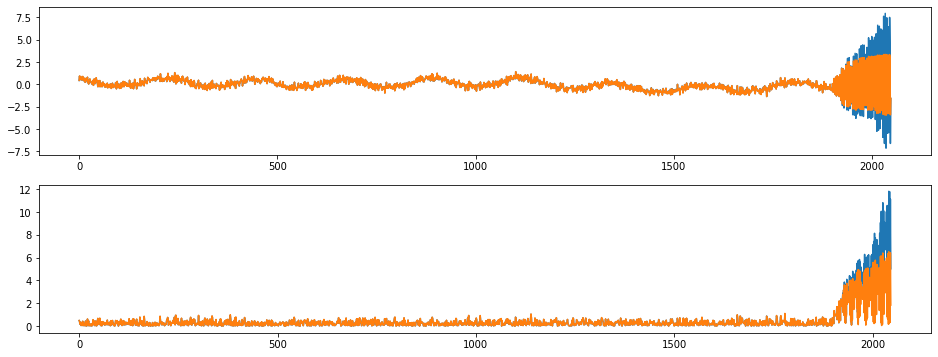

index:  134730
MAE:  0.0645965512430575
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


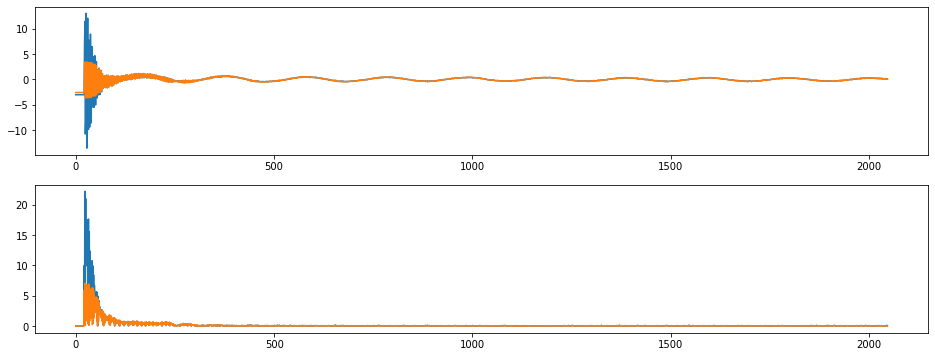

index:  134718
MAE:  0.0645638220219767
n_bunches        796
bunch_index     1366
bunch_number     750
Name: 4684, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


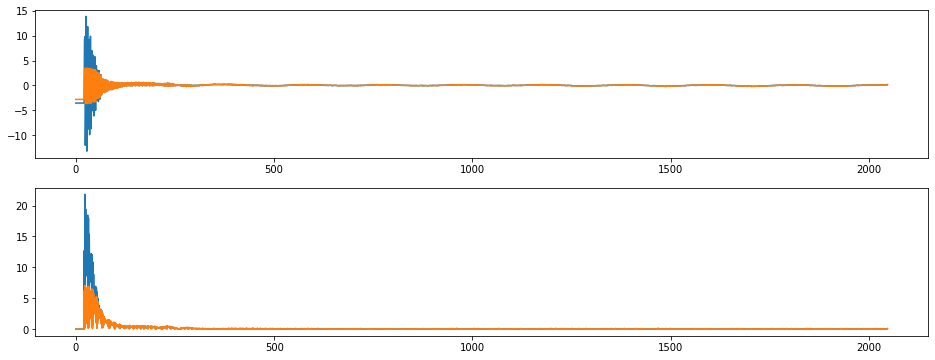

index:  594805
MAE:  0.06455871022697199
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


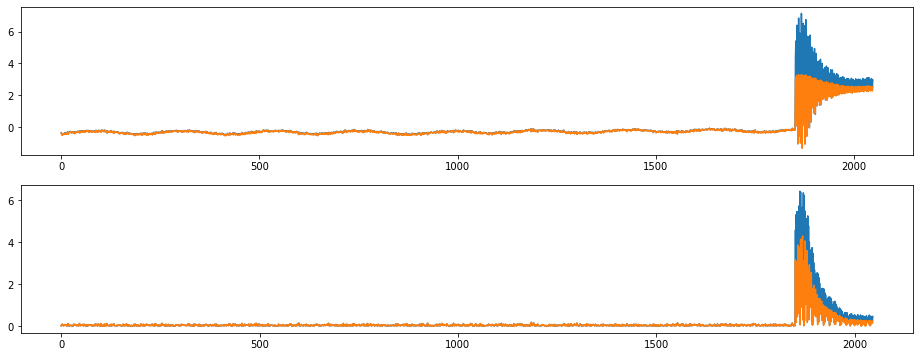

index:  134720
MAE:  0.06455821556187713
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


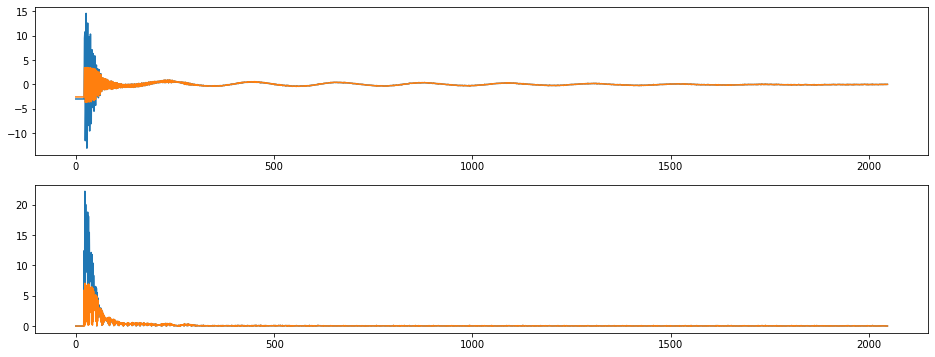

index:  134726
MAE:  0.06452007376754176
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


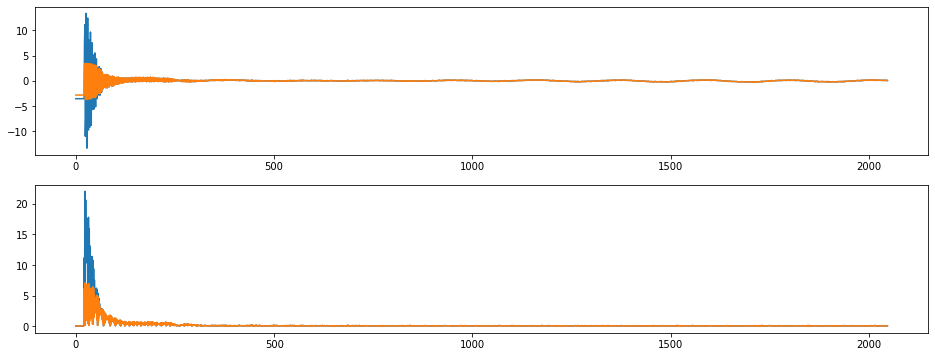

index:  134737
MAE:  0.06443887851477814
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


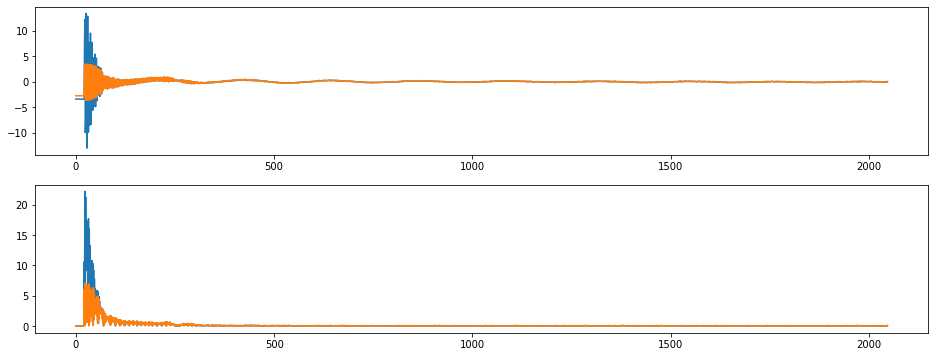

index:  134721
MAE:  0.06433015512407037
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


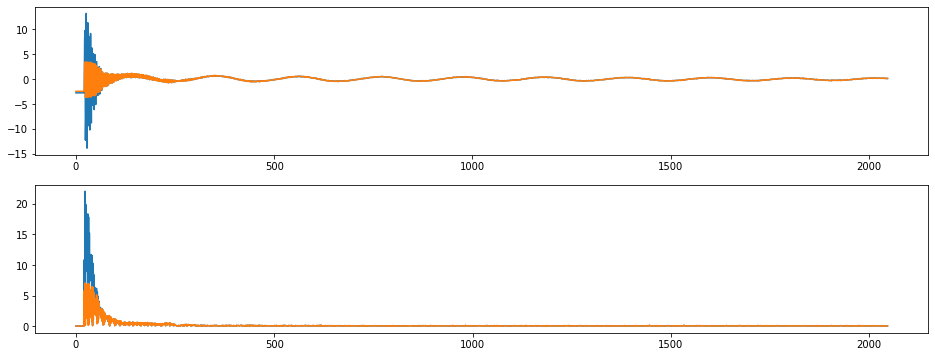

index:  134727
MAE:  0.06428298844267663
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


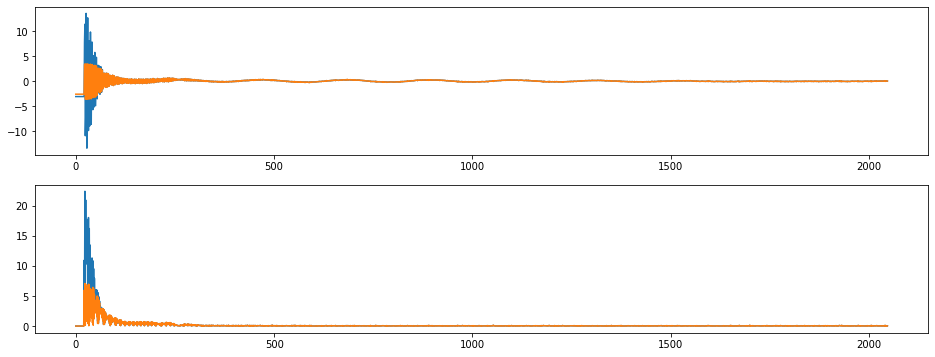

index:  134738
MAE:  0.06417257481795485
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


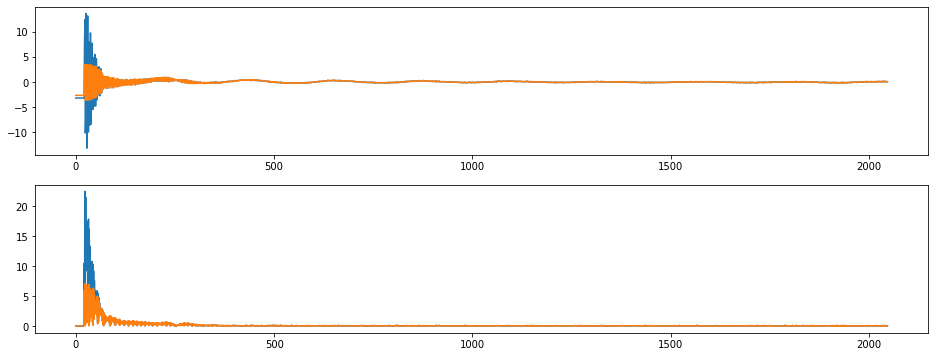

index:  594806
MAE:  0.06416340651219823
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


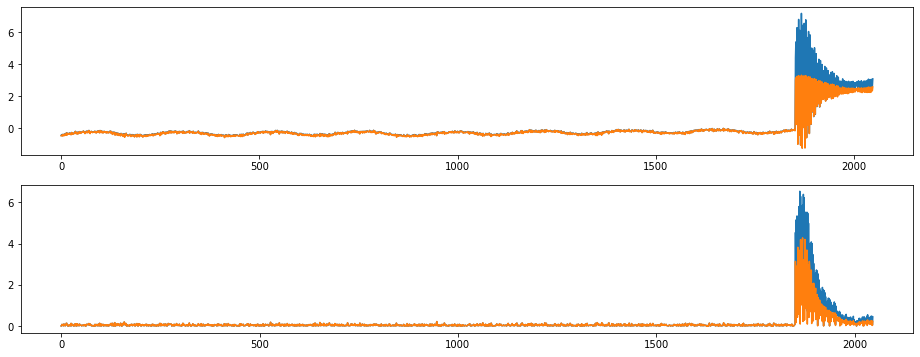

index:  594807
MAE:  0.06411061866868231
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


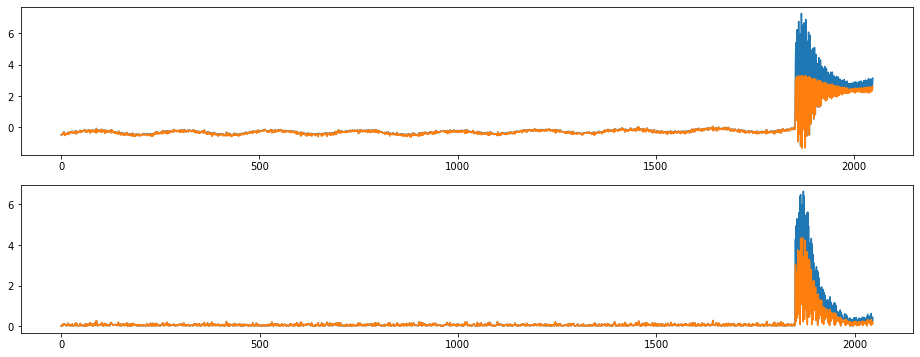

index:  134752
MAE:  0.0640677641261762
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


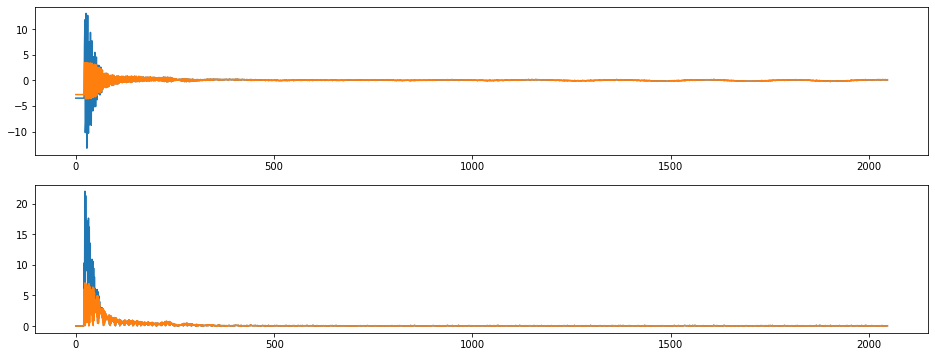

index:  594808
MAE:  0.06400582117562083
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


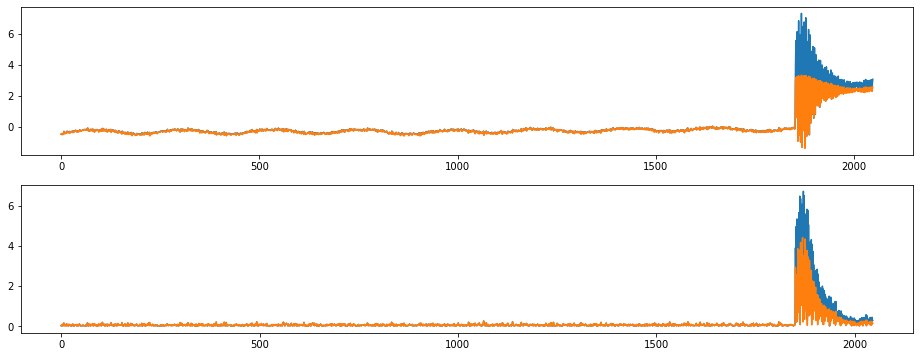

index:  134744
MAE:  0.06400247789118688
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


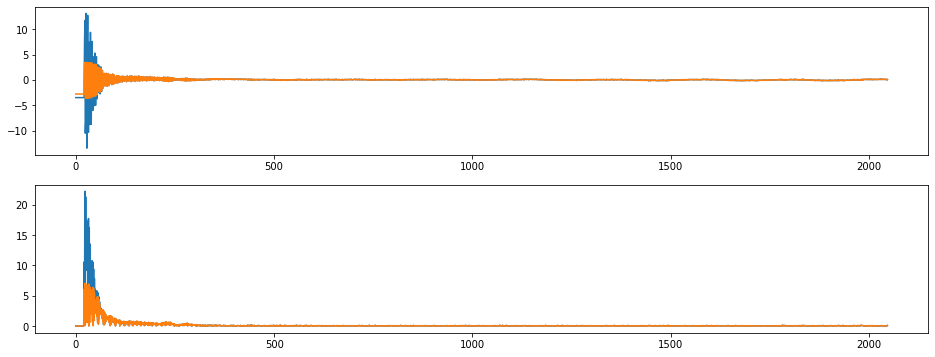

index:  594810
MAE:  0.06399280979719421
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


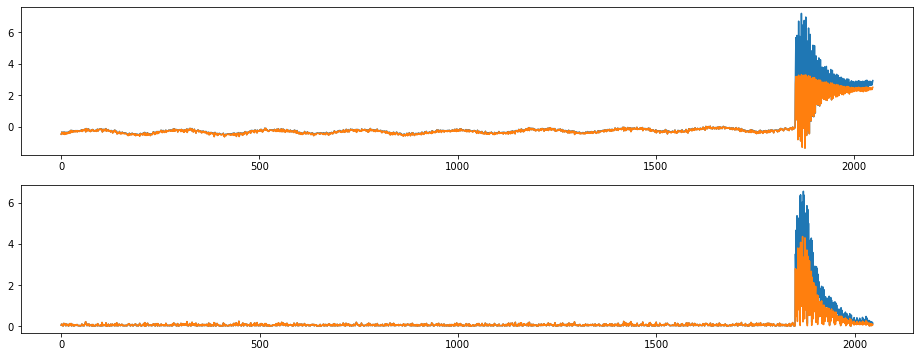

index:  594809
MAE:  0.06395201004285071
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


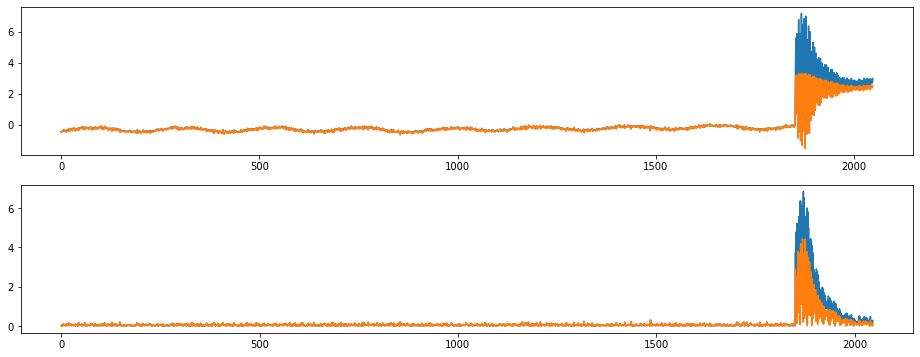

index:  594800
MAE:  0.06393675267544399
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


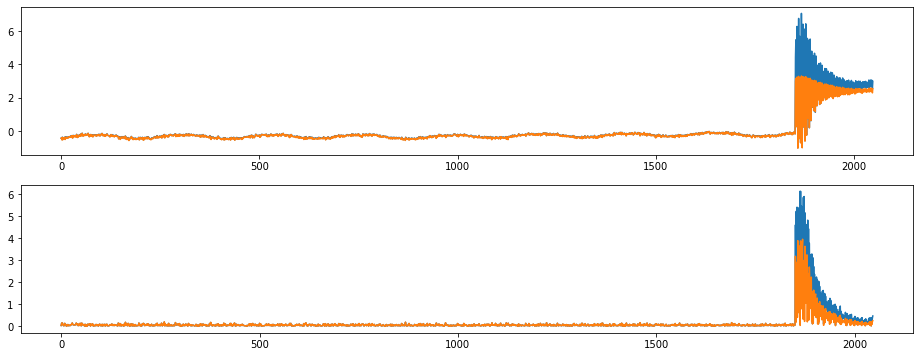

index:  134736
MAE:  0.06387980889572883
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


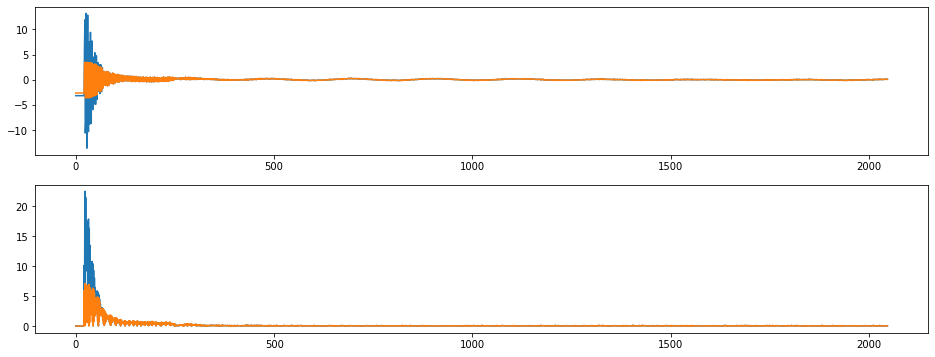

index:  594793
MAE:  0.06381869770400828
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


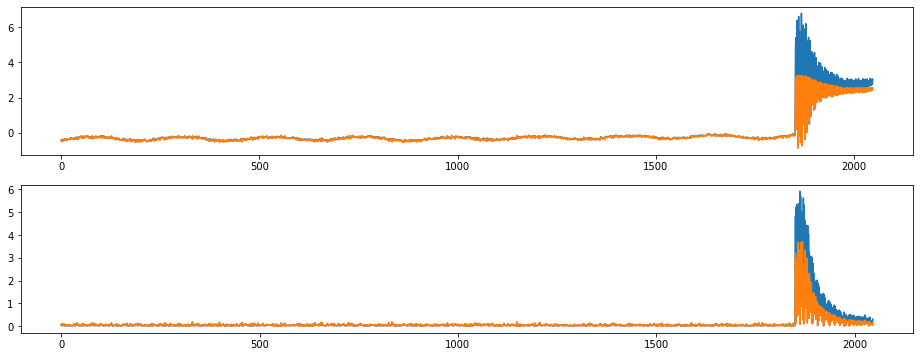

index:  594811
MAE:  0.06376716399863515
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


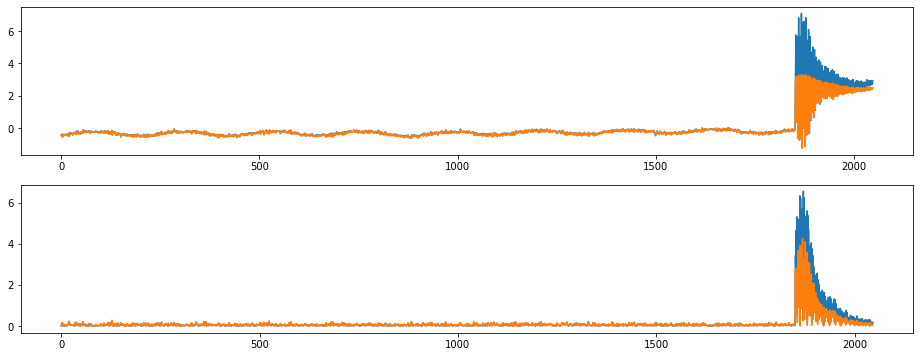

index:  594801
MAE:  0.06375251540611854
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


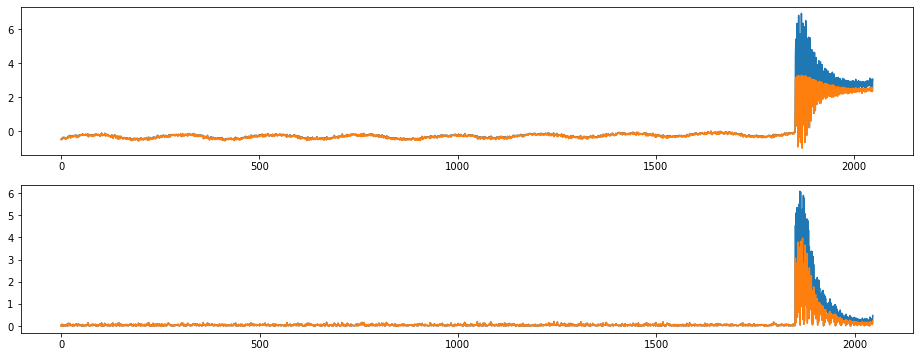

index:  134719
MAE:  0.06372200119936702
n_bunches        796
bunch_index     1366
bunch_number     750
Name: 4684, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


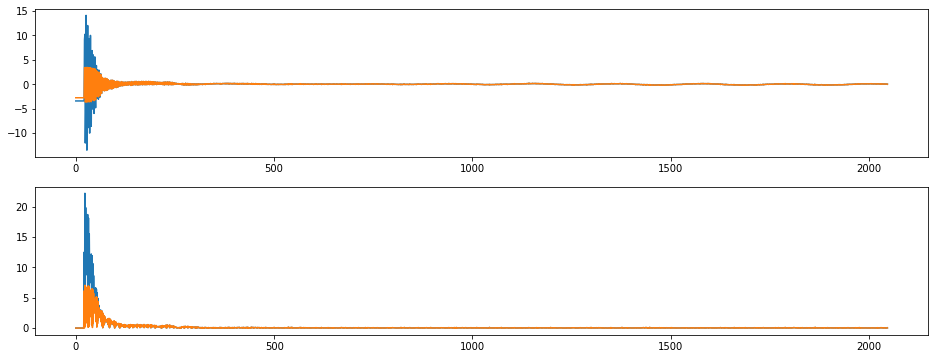

index:  594802
MAE:  0.06366824783518372
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


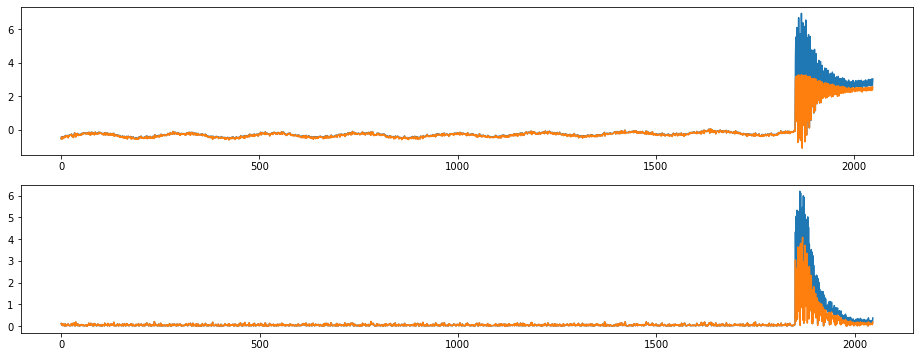

index:  134766
MAE:  0.06366038671921198
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


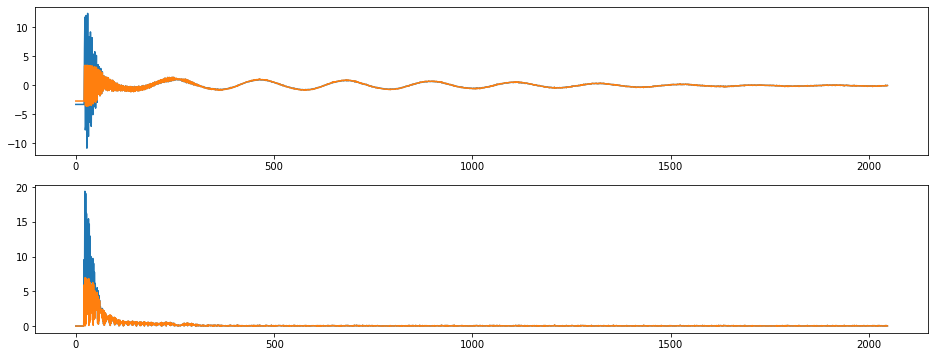

index:  594804
MAE:  0.0636495793852192
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


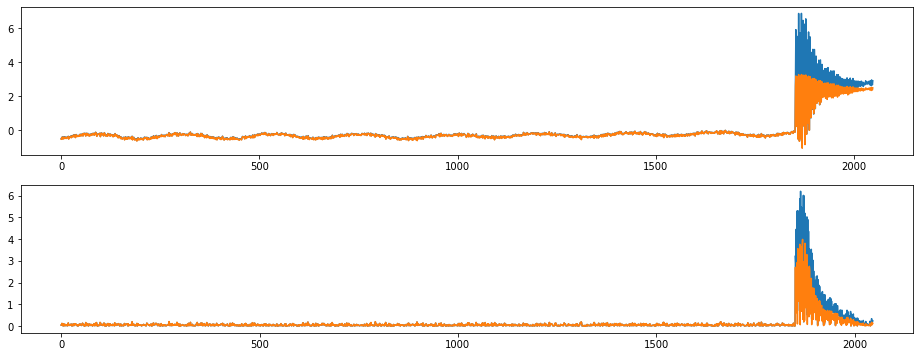

index:  594795
MAE:  0.06361410998937733
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


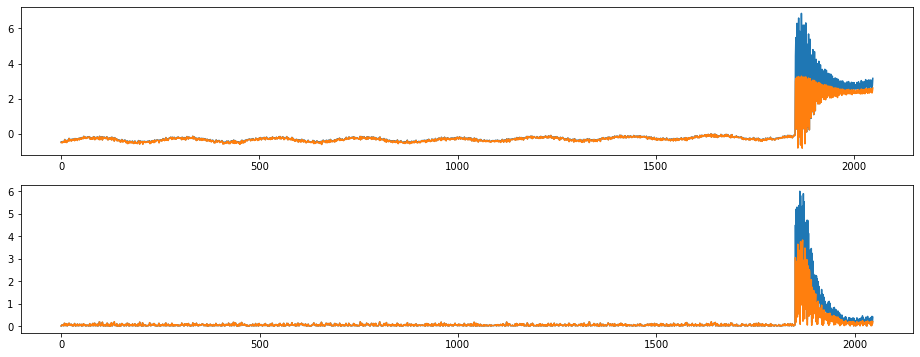

index:  594794
MAE:  0.06356583071710642
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


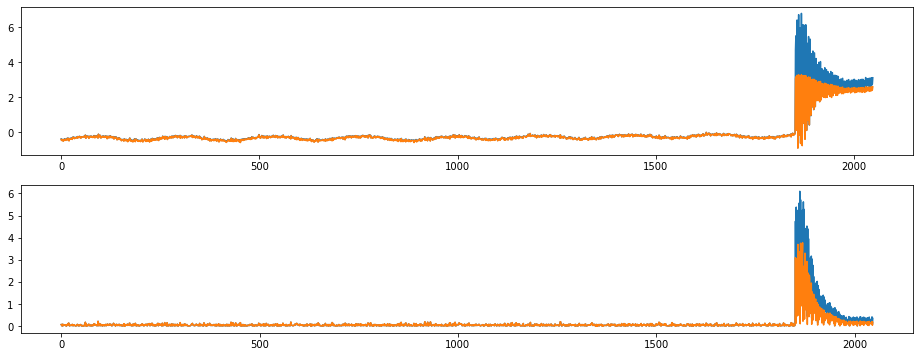

index:  594803
MAE:  0.06351807552712369
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


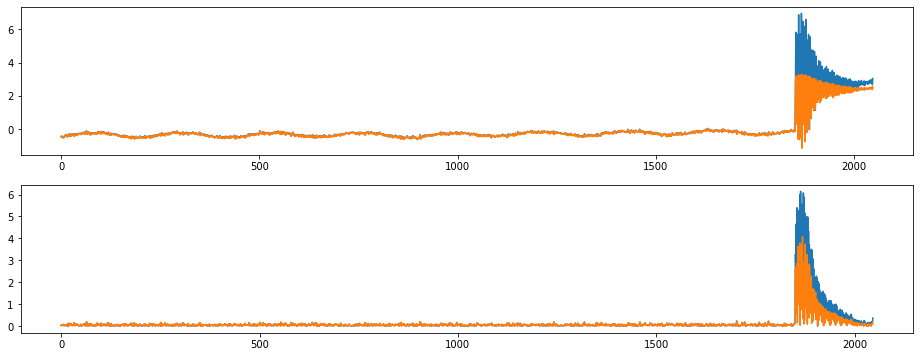

index:  134735
MAE:  0.06349401384293686
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


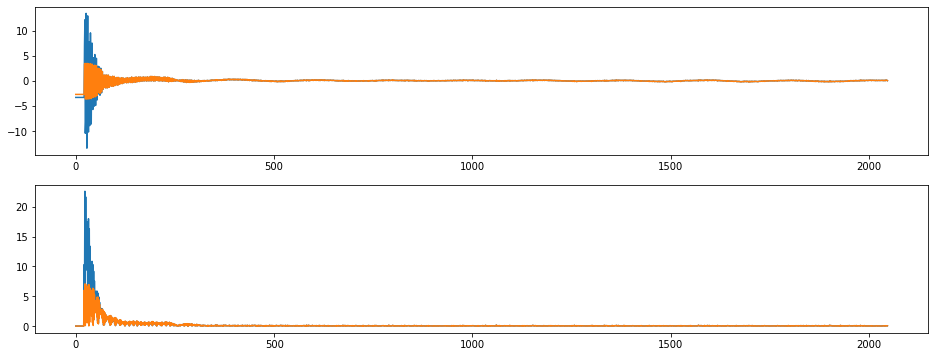

index:  594812
MAE:  0.06344178877877811
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


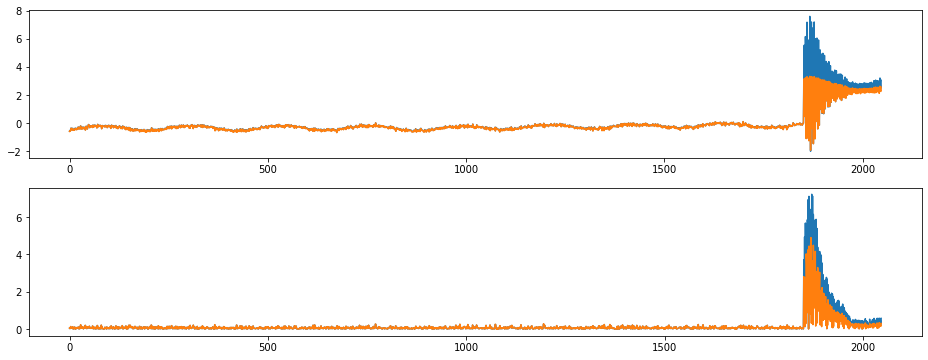

index:  134711
MAE:  0.06341121506544307
n_bunches        796
bunch_index     1366
bunch_number     750
Name: 4684, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


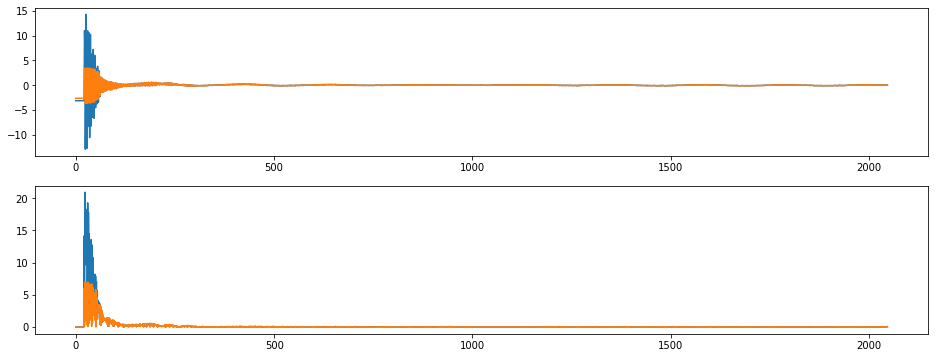

index:  594796
MAE:  0.06335977206795651
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


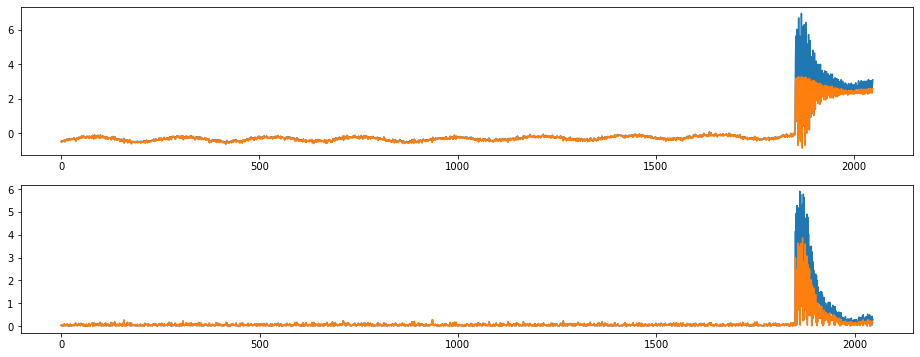

index:  134713
MAE:  0.06332572843974783
n_bunches        796
bunch_index     1366
bunch_number     750
Name: 4684, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


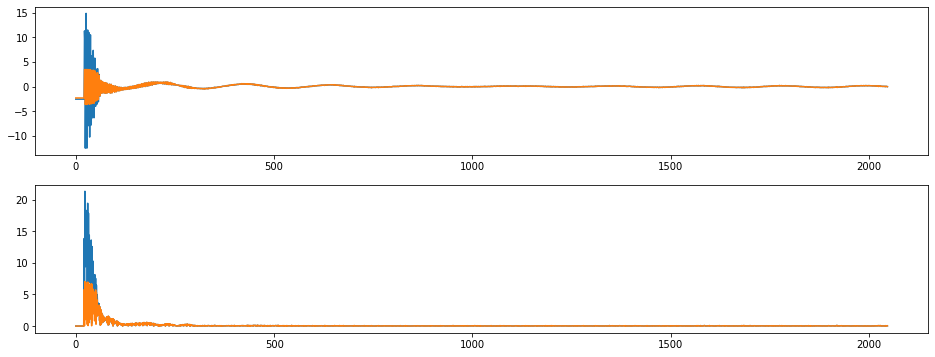

index:  134723
MAE:  0.06324749964999175
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


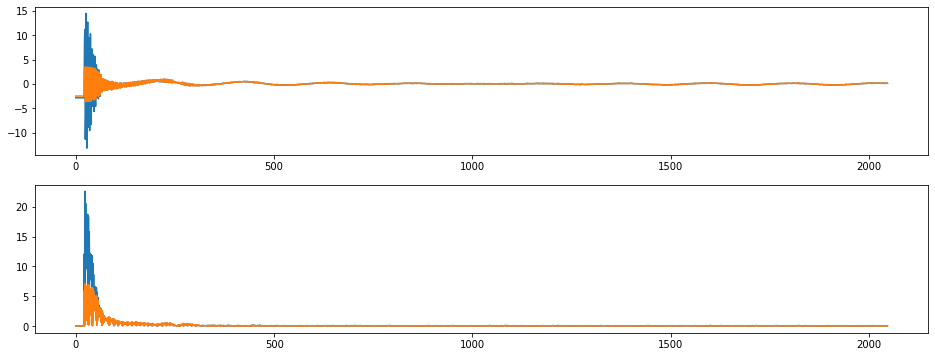

index:  134712
MAE:  0.06322555123320091
n_bunches        796
bunch_index     1366
bunch_number     750
Name: 4684, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


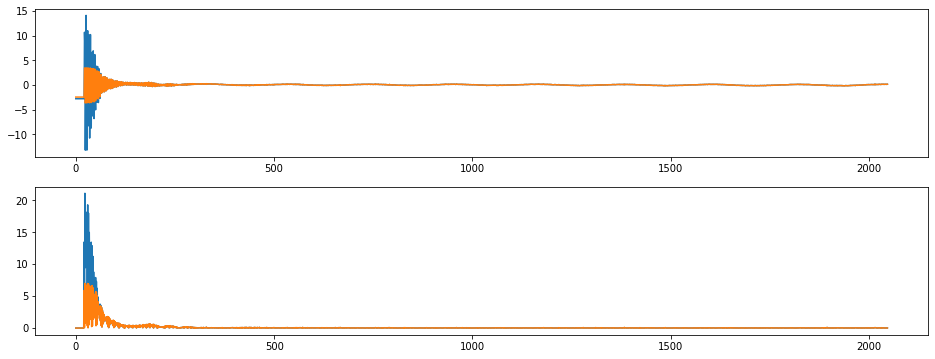

index:  134746
MAE:  0.06319936497434278
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


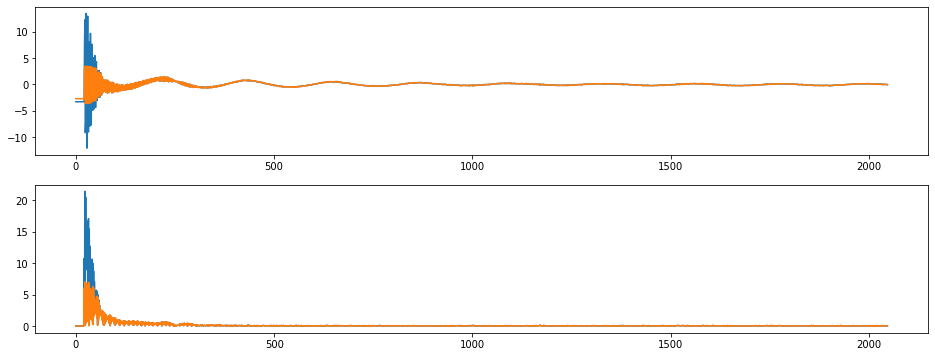

index:  594797
MAE:  0.06317009720242887
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


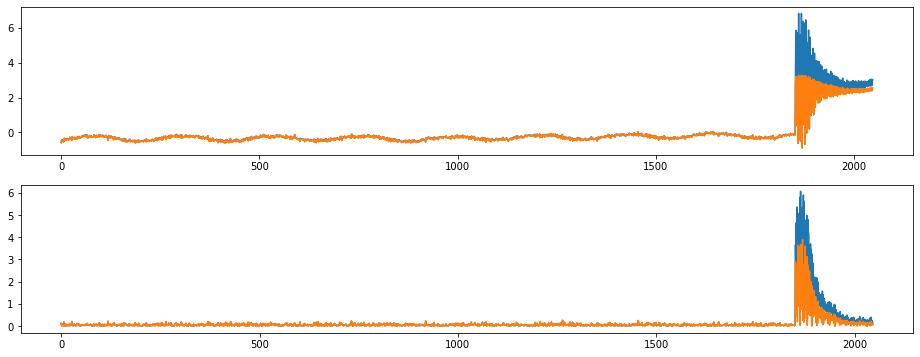

index:  594799
MAE:  0.06310422389376909
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


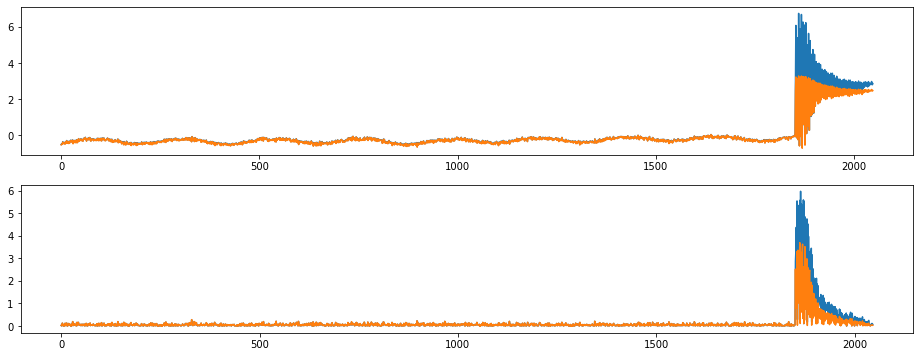

index:  134772
MAE:  0.06308899930936454
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


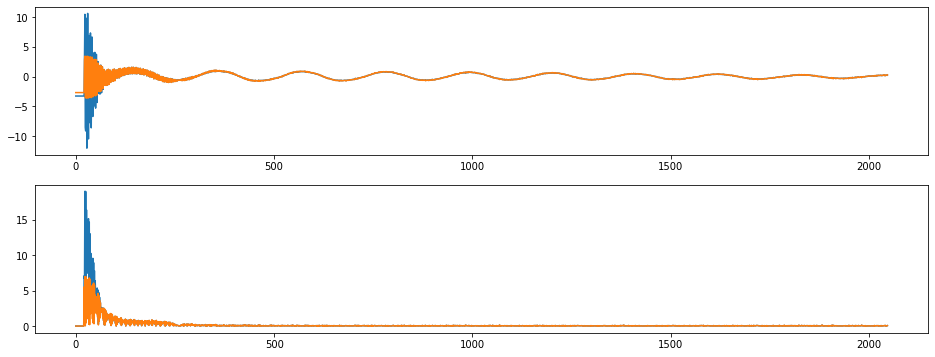

index:  594778
MAE:  0.06304905902882044
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


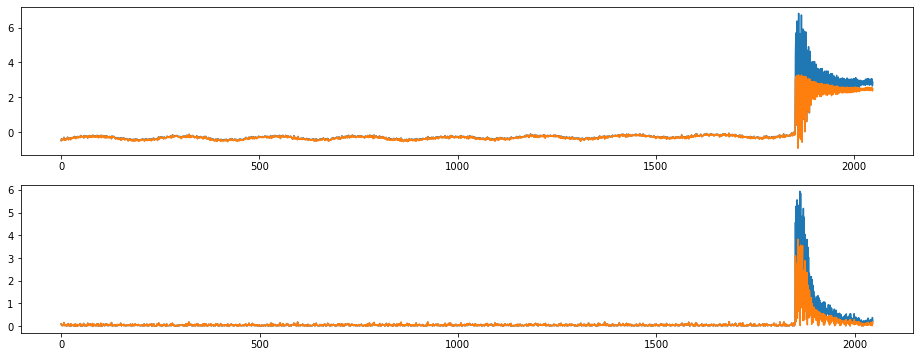

index:  594785
MAE:  0.06300924400078066
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


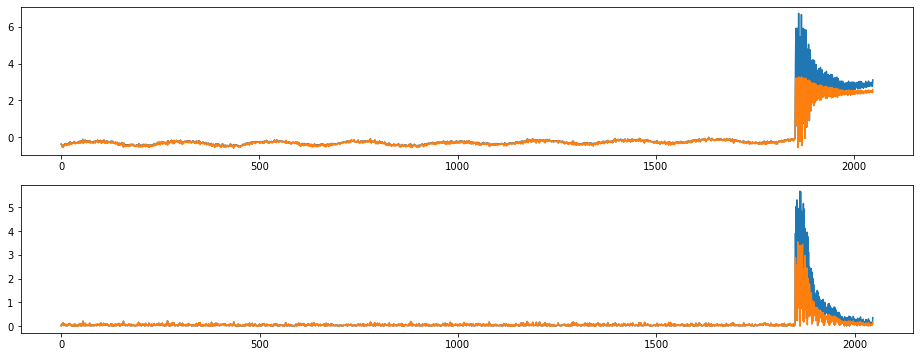

index:  134728
MAE:  0.0630037104735266
n_bunches        796
bunch_index     1367
bunch_number     751
Name: 4685, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


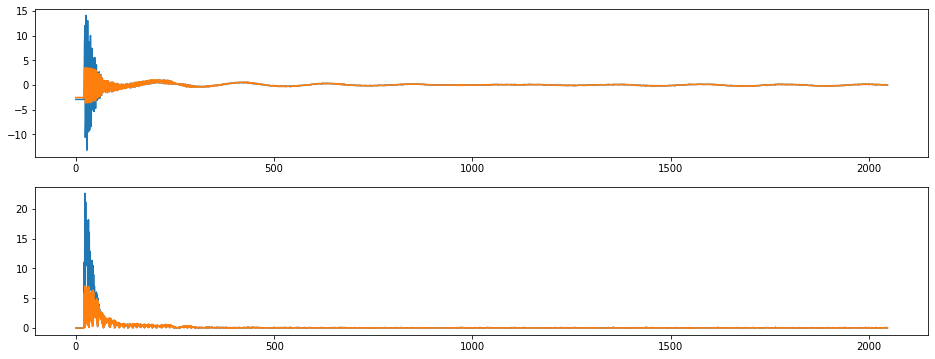

index:  594798
MAE:  0.06296181967375993
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


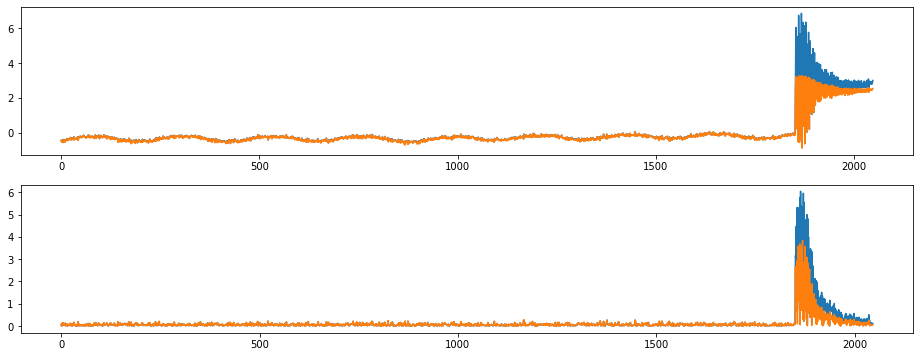

index:  594787
MAE:  0.0628411326536998
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


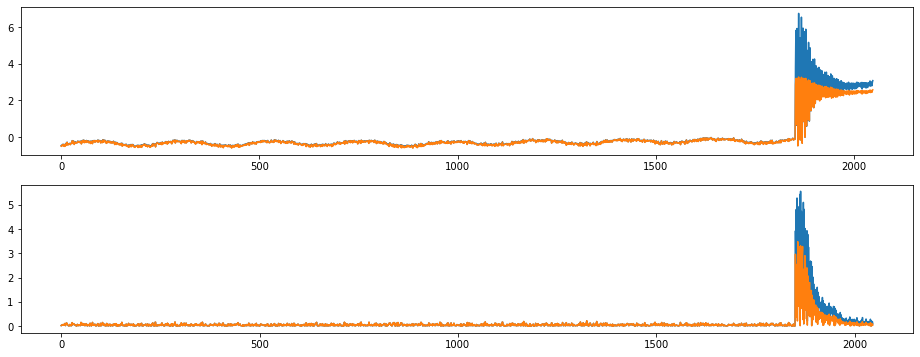

index:  594786
MAE:  0.0628403386996666
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


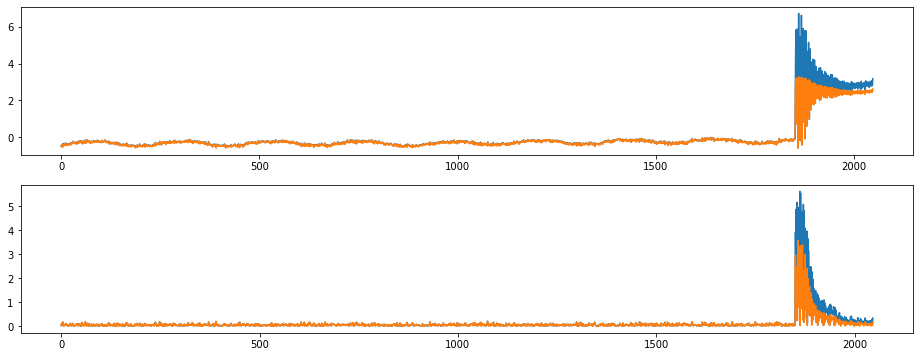

index:  594788
MAE:  0.06281074086270497
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


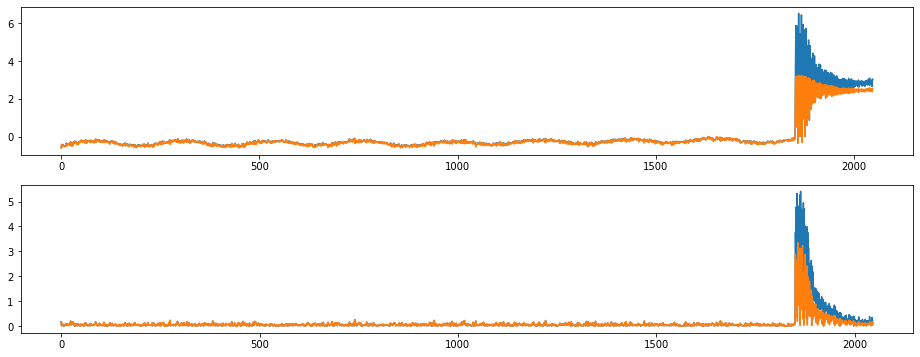

index:  594779
MAE:  0.06280047504632882
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


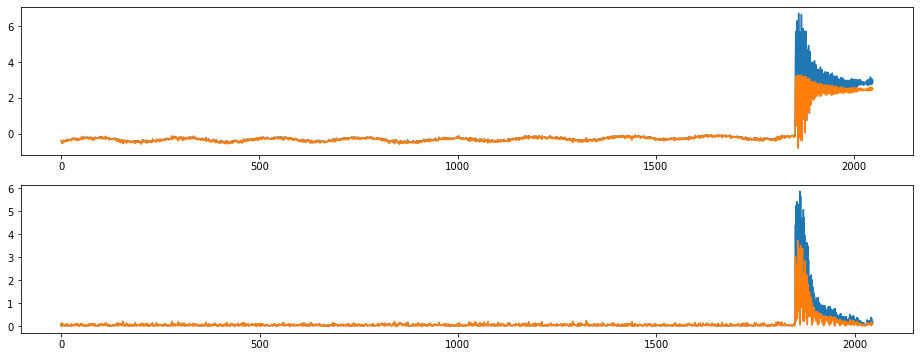

index:  134715
MAE:  0.06277807398929347
n_bunches        796
bunch_index     1366
bunch_number     750
Name: 4684, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


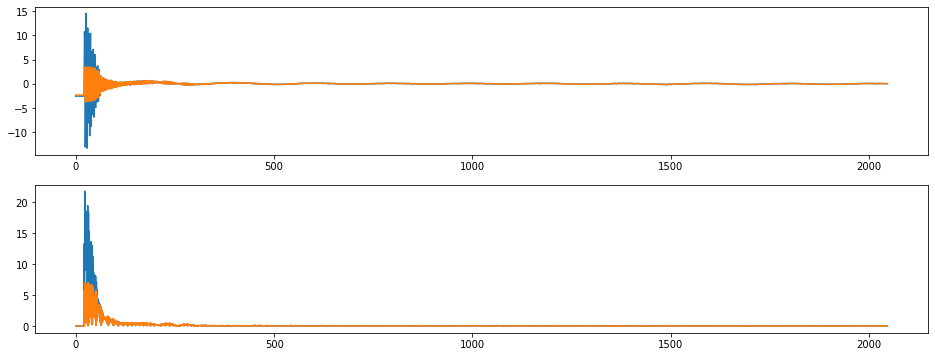

index:  594771
MAE:  0.06277690560871599
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


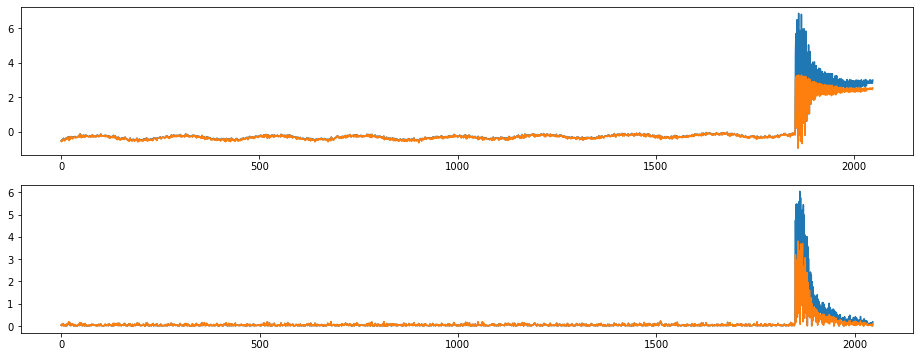

index:  594789
MAE:  0.06275306537041948
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


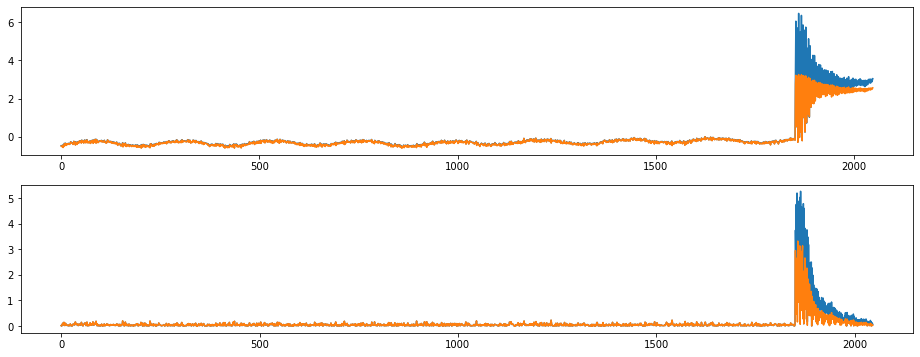

index:  594748
MAE:  0.06272760645428578
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


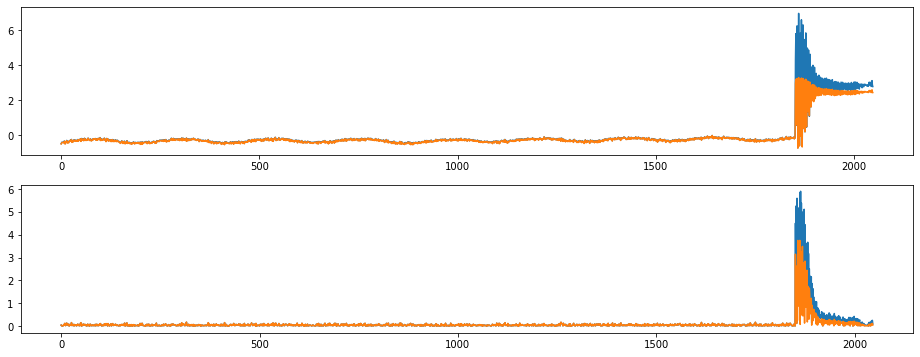

index:  594790
MAE:  0.06269516887013374
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


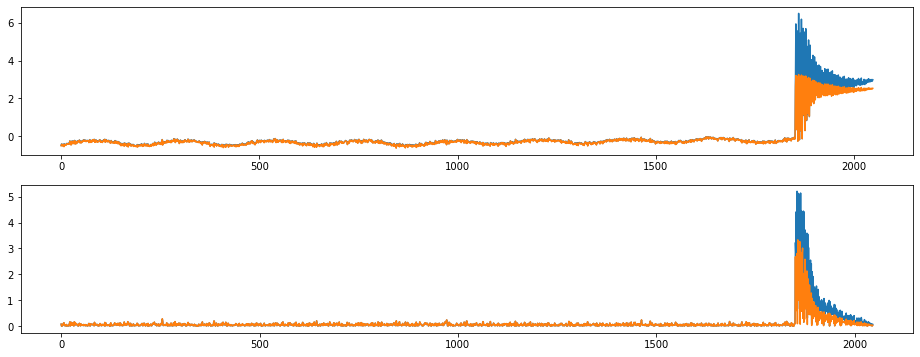

index:  594764
MAE:  0.06268917834920082
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


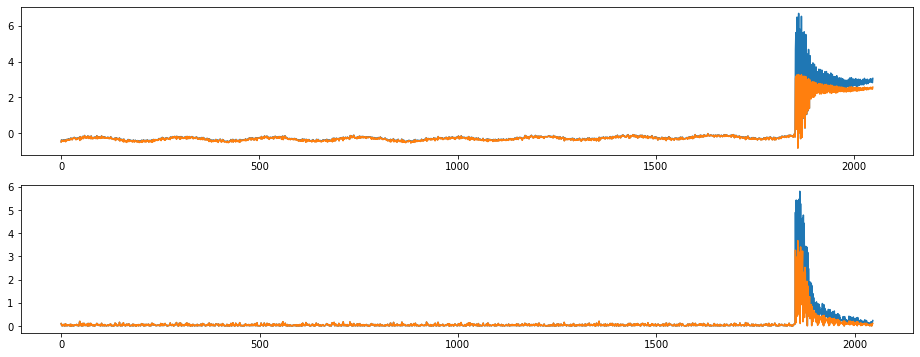

index:  594813
MAE:  0.06262230594105266
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


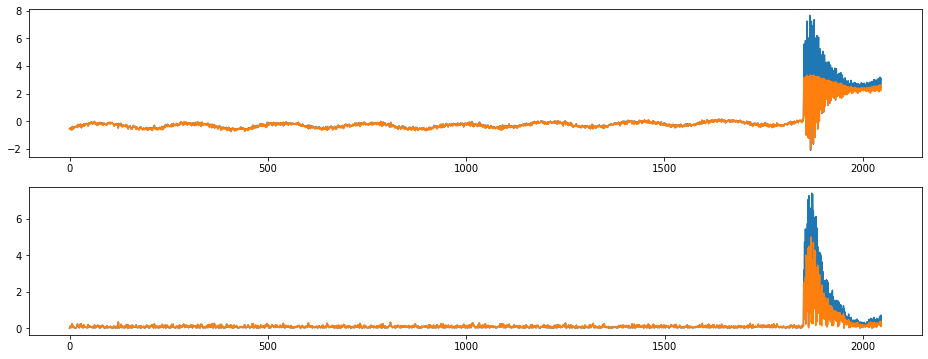

index:  594791
MAE:  0.06261769145978133
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


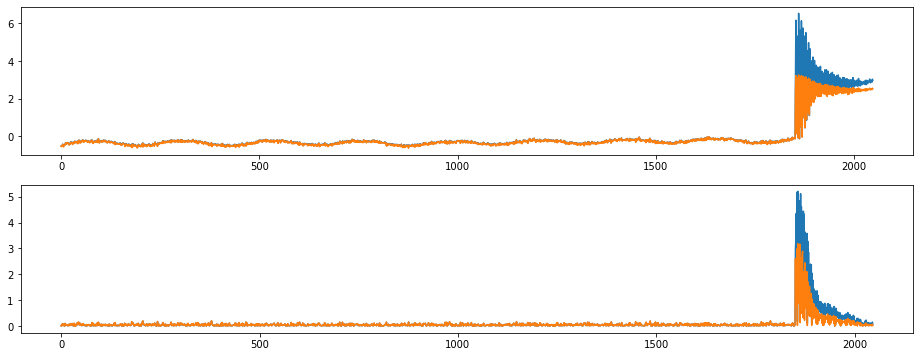

index:  594772
MAE:  0.06260603011366905
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


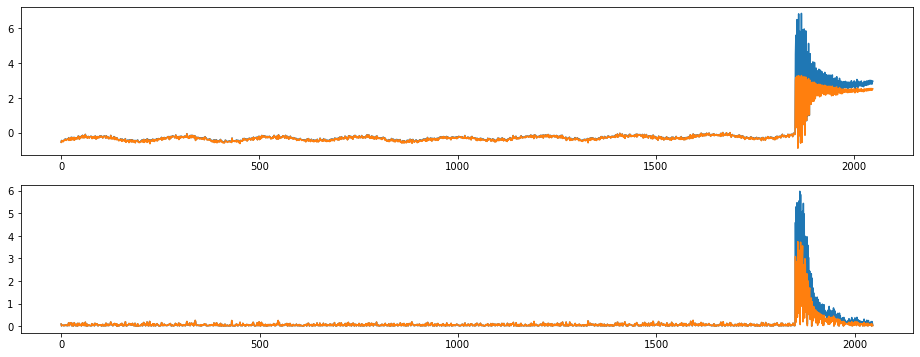

index:  594780
MAE:  0.0625694354654235
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


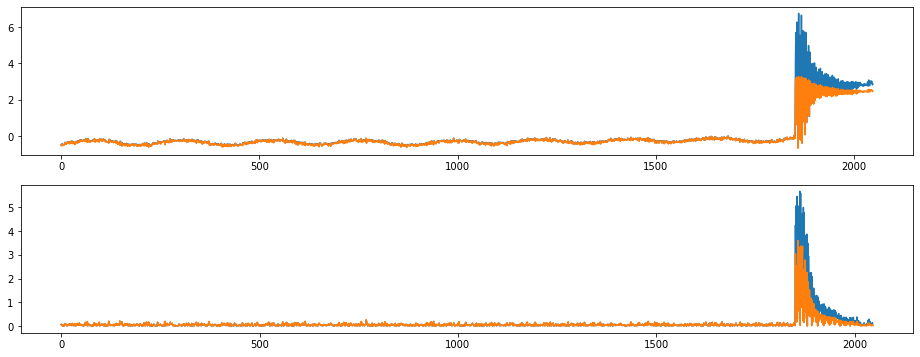

index:  134770
MAE:  0.06254124080948839
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


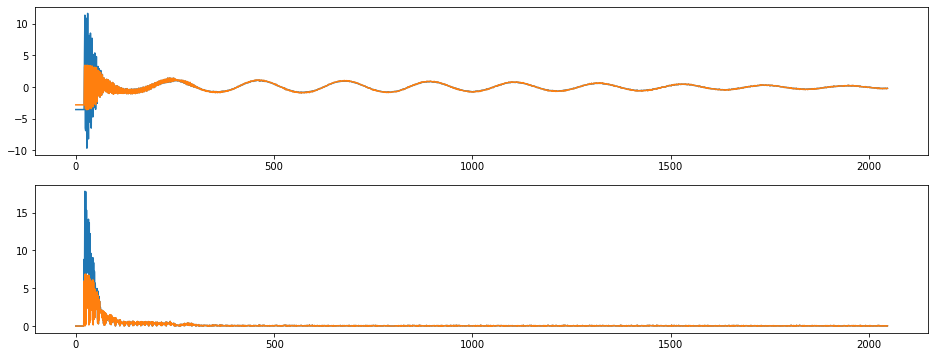

index:  594749
MAE:  0.06254084005083468
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


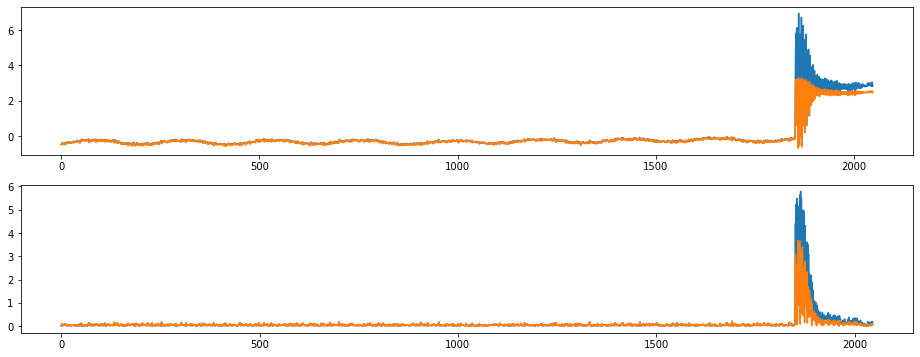

index:  594792
MAE:  0.06252504162474597
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


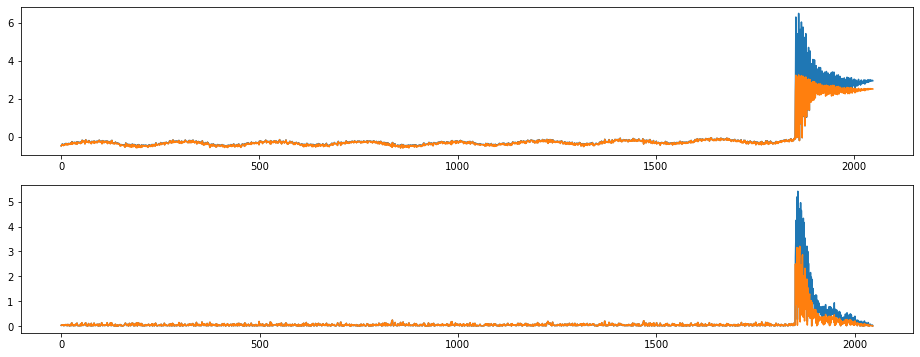

index:  594765
MAE:  0.06248335581710569
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


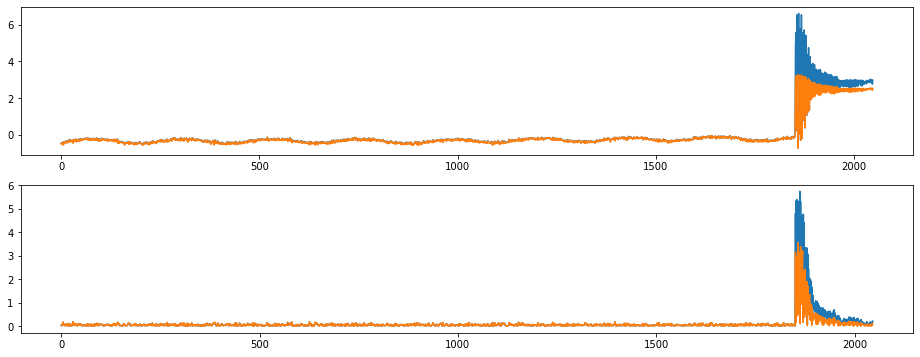

index:  594756
MAE:  0.06246537750317276
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


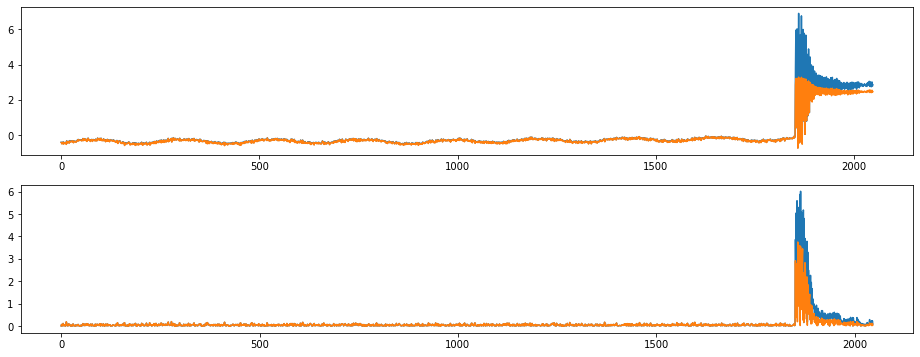

index:  594773
MAE:  0.06242761493679485
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


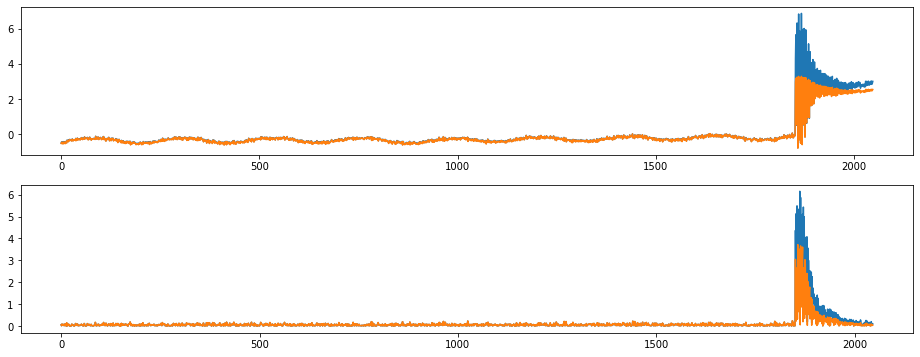

index:  594818
MAE:  0.062400231441728626
n_bunches       652
bunch_index     502
bunch_number    269
Name: 20650, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


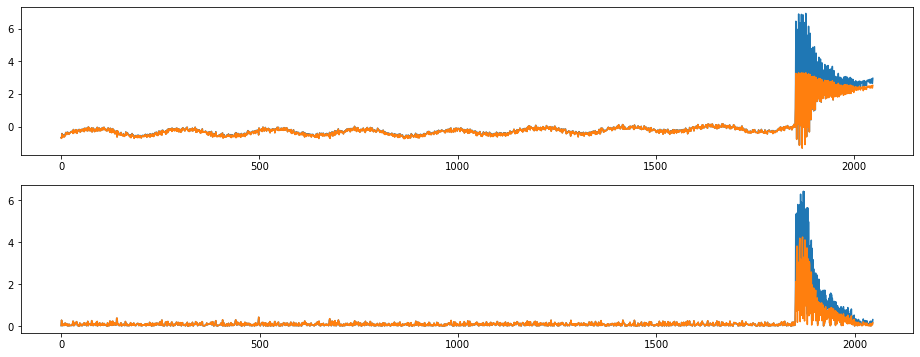

index:  594777
MAE:  0.062395053688131655
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


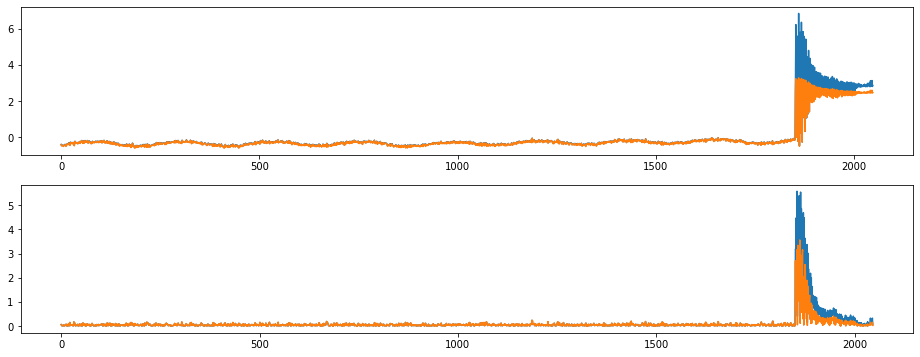

index:  594819
MAE:  0.06237904970417069
n_bunches       652
bunch_index     502
bunch_number    269
Name: 20650, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


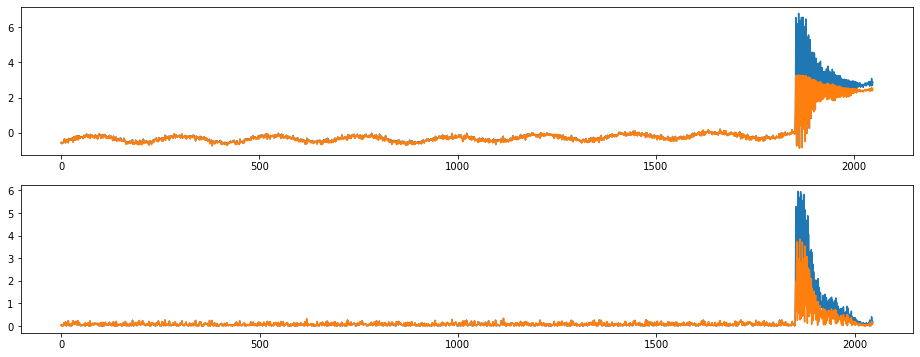

index:  594766
MAE:  0.062376632206328775
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


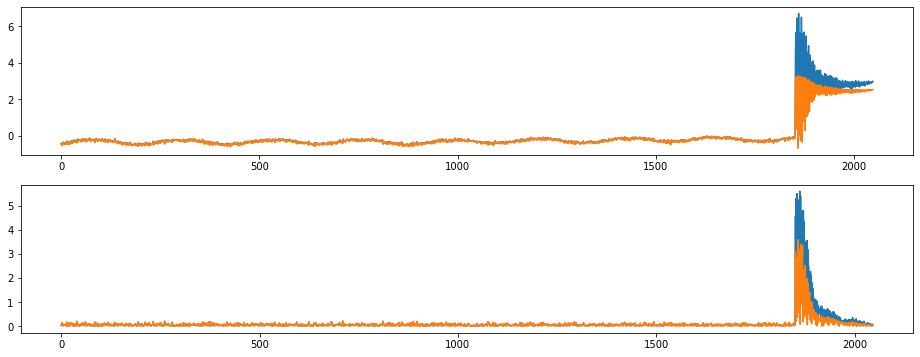

index:  594750
MAE:  0.0623479914642858
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


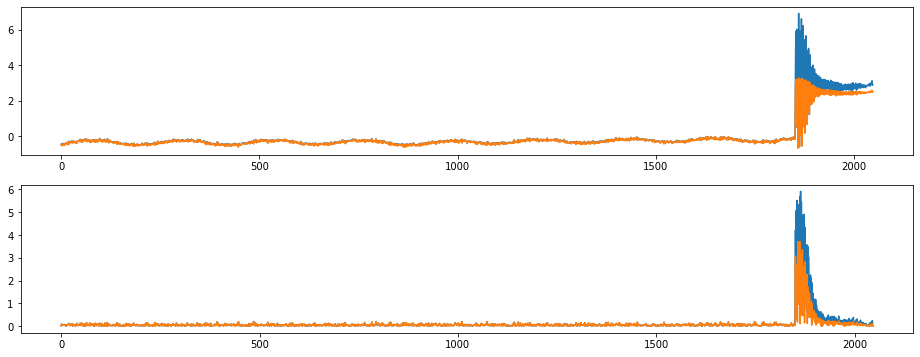

index:  594774
MAE:  0.0622981610134197
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


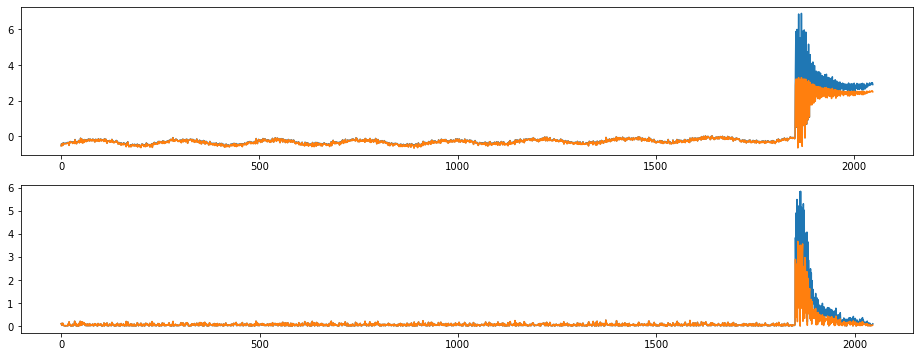

index:  594781
MAE:  0.06228463860806193
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


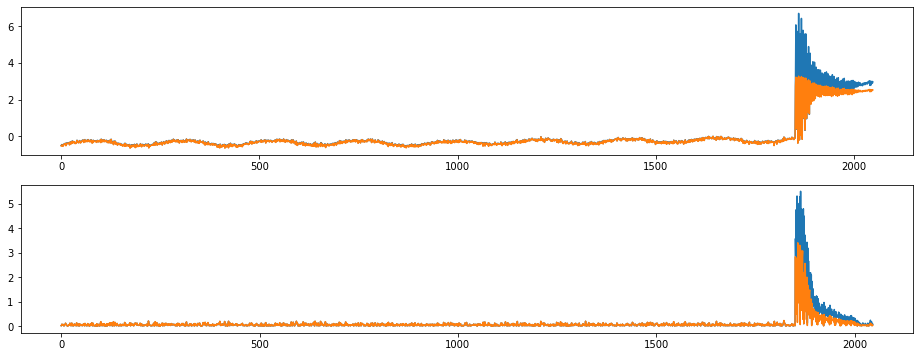

index:  594757
MAE:  0.062284199221040254
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


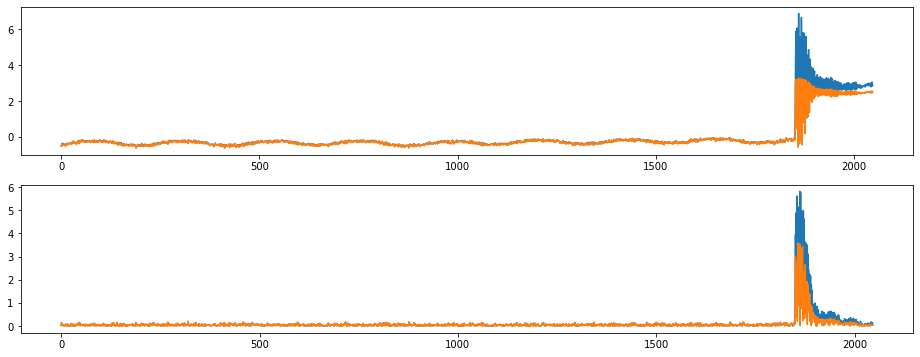

index:  594776
MAE:  0.06224410501476251
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


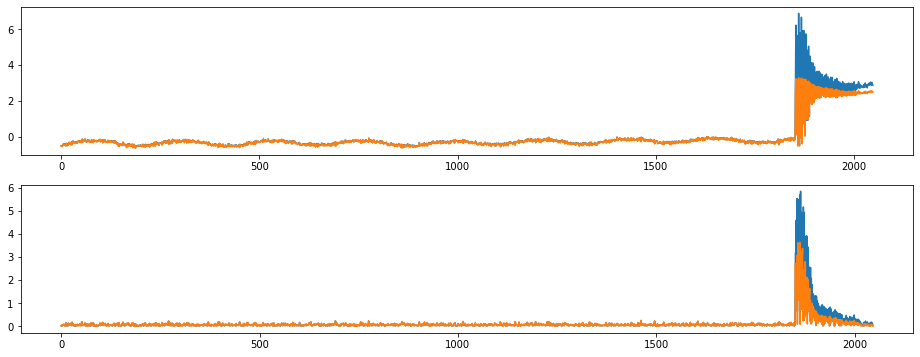

index:  594758
MAE:  0.062221352170220574
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


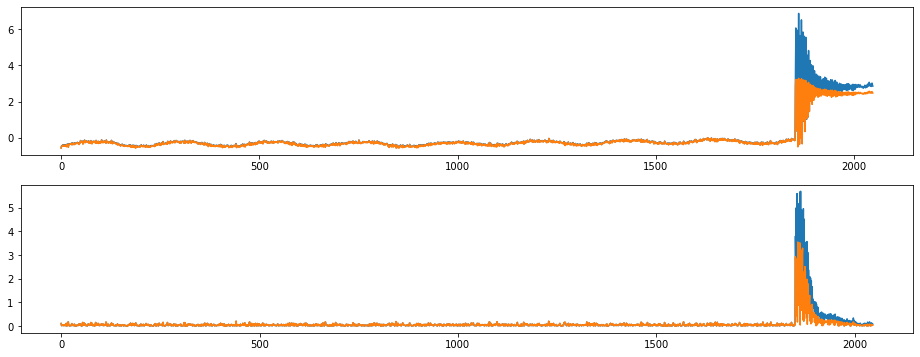

index:  594817
MAE:  0.06221826984357961
n_bunches       652
bunch_index     502
bunch_number    269
Name: 20650, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


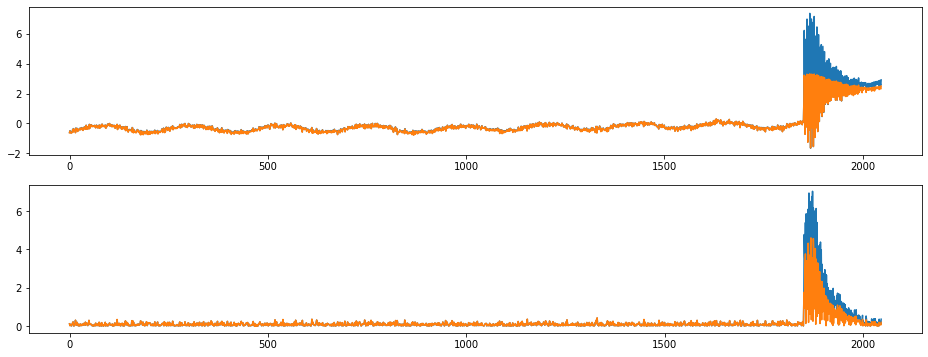

index:  594767
MAE:  0.06219558078881212
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


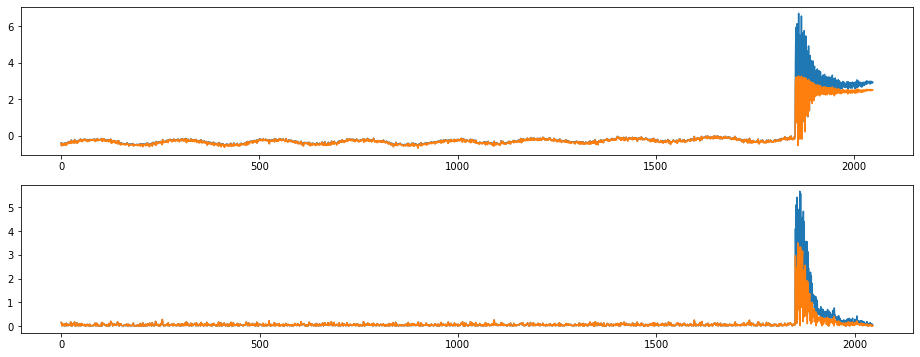

index:  594775
MAE:  0.0621915242086377
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


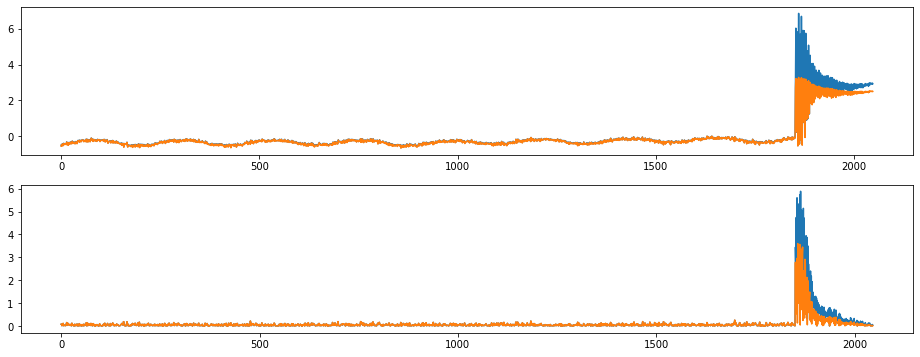

index:  594782
MAE:  0.06218474460795689
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


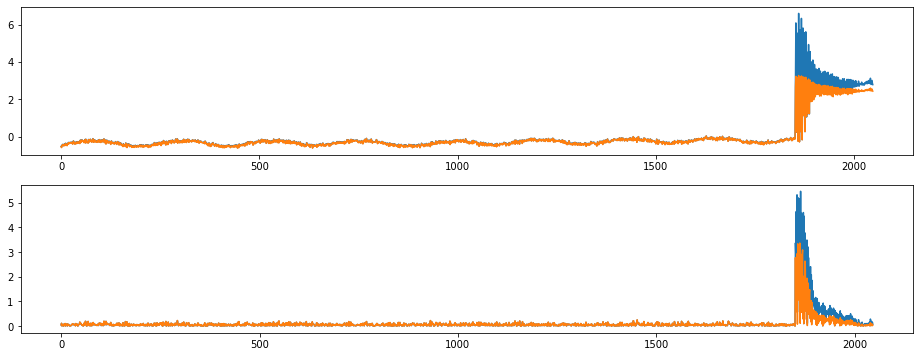

index:  594740
MAE:  0.06217937936923833
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


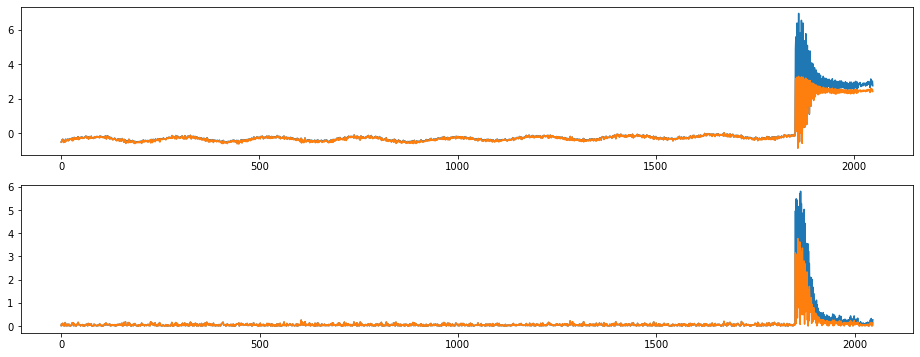

index:  594783
MAE:  0.06216178936015278
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


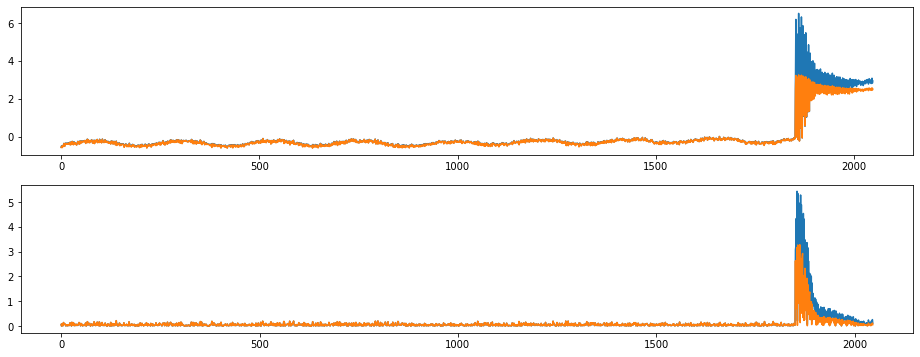

index:  594751
MAE:  0.062122362396808066
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


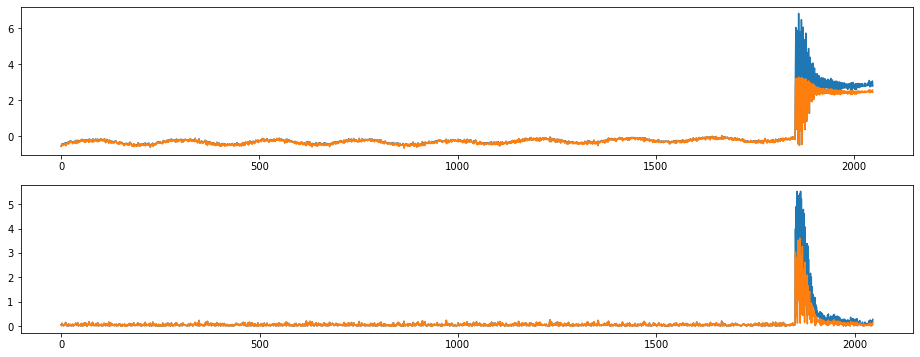

index:  594784
MAE:  0.062107898386268845
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


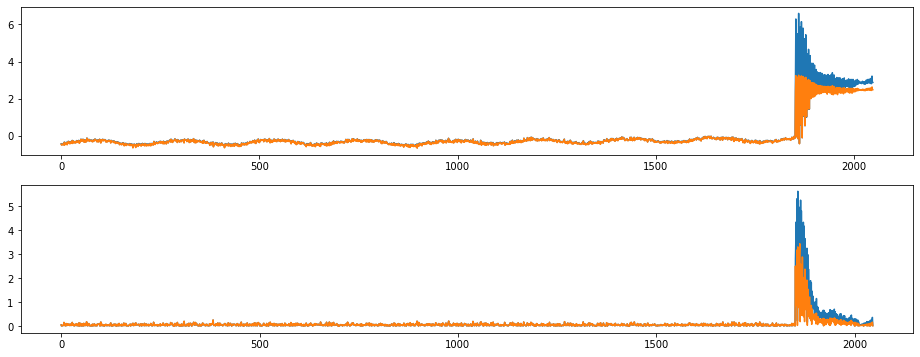

index:  594759
MAE:  0.062058745281897656
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


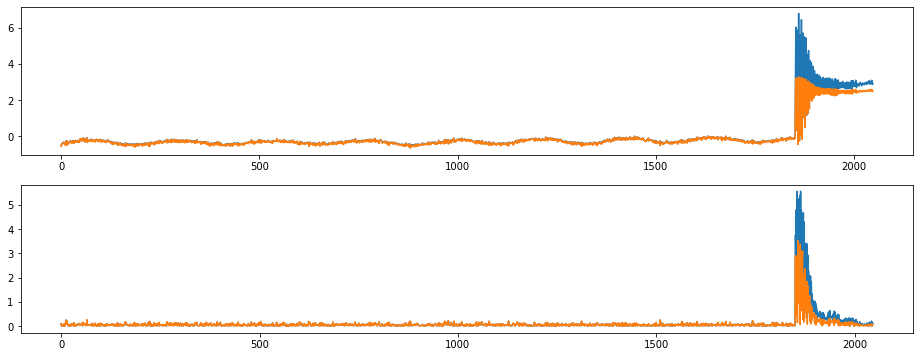

index:  594742
MAE:  0.061994833490512026
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


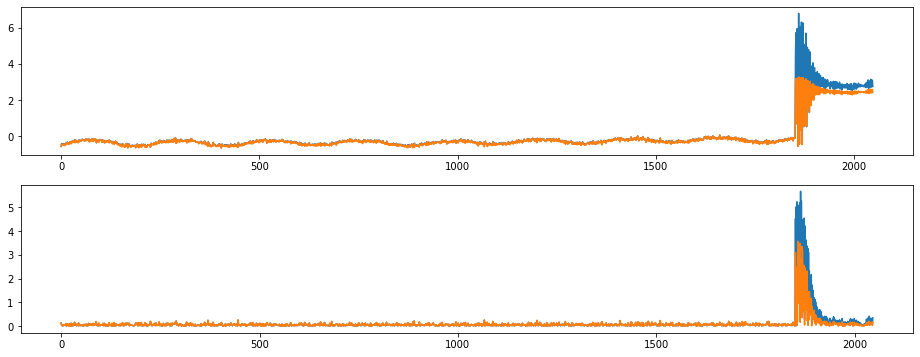

index:  594760
MAE:  0.06198146936931155
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


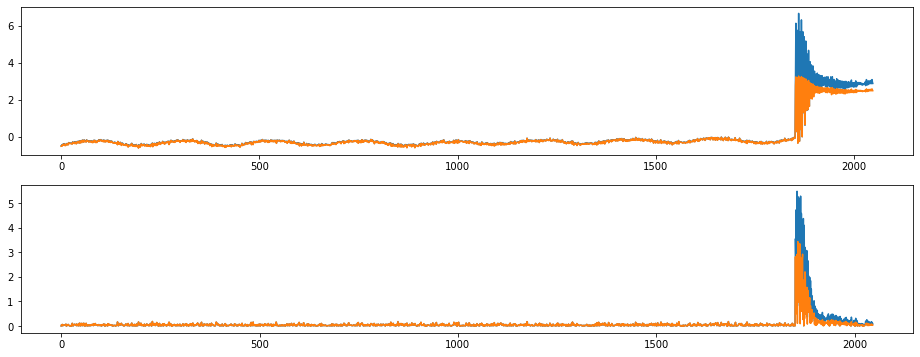

index:  594768
MAE:  0.06196329331614531
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


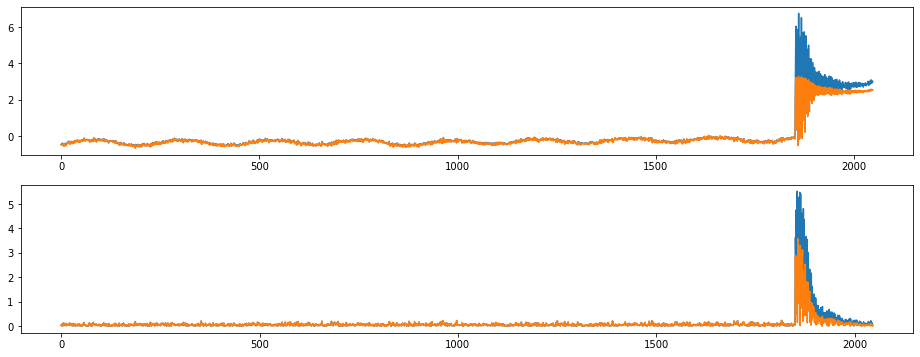

index:  594761
MAE:  0.06194858810813086
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


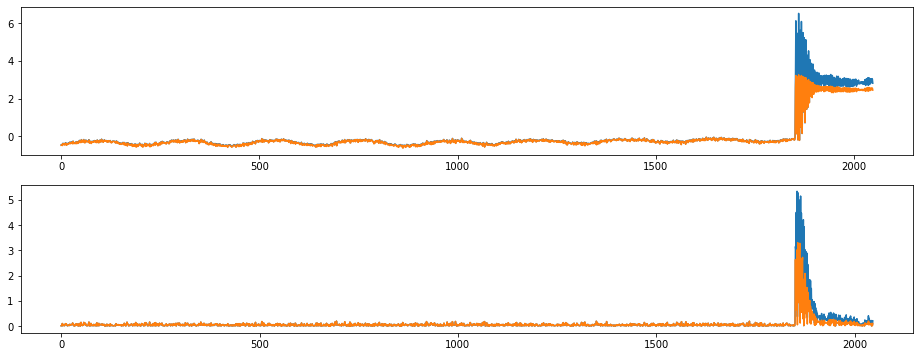

index:  594814
MAE:  0.06193828042776396
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


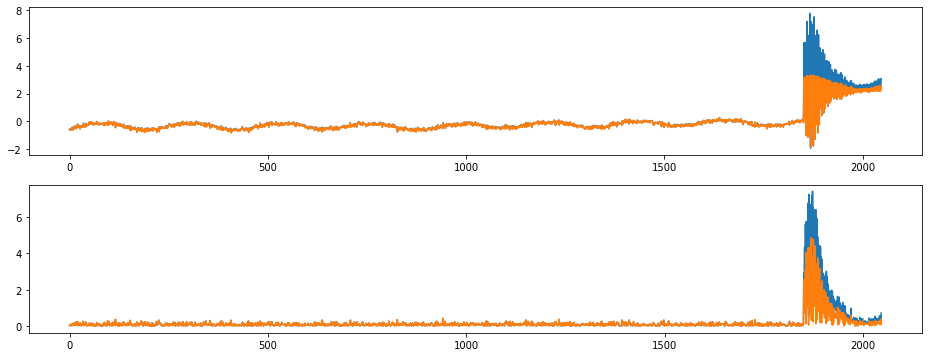

index:  594741
MAE:  0.06192391562439127
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


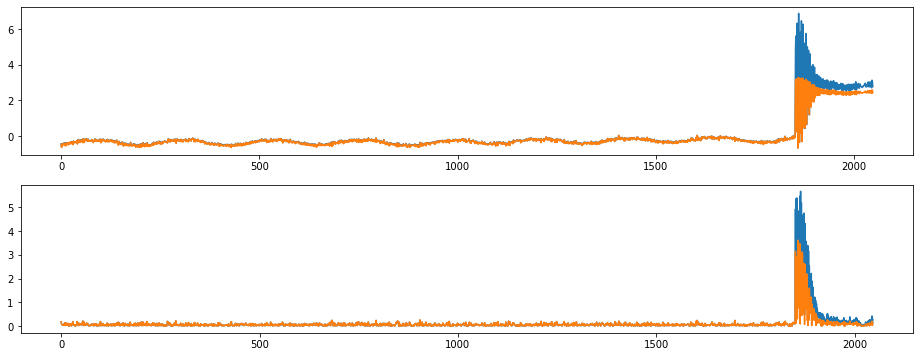

index:  594762
MAE:  0.06190920515809563
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


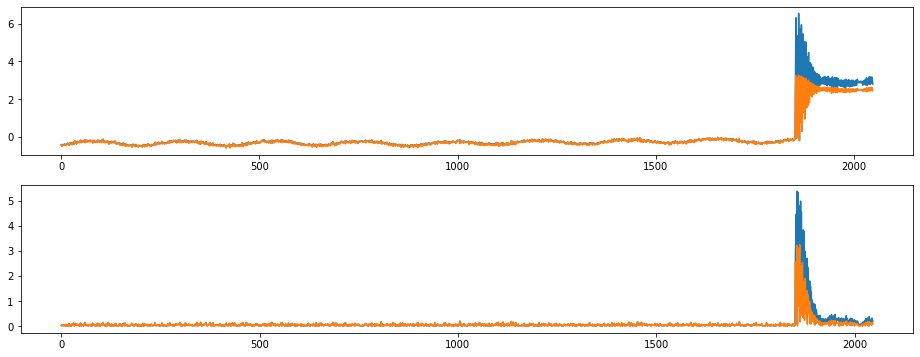

index:  594747
MAE:  0.06190846764379844
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


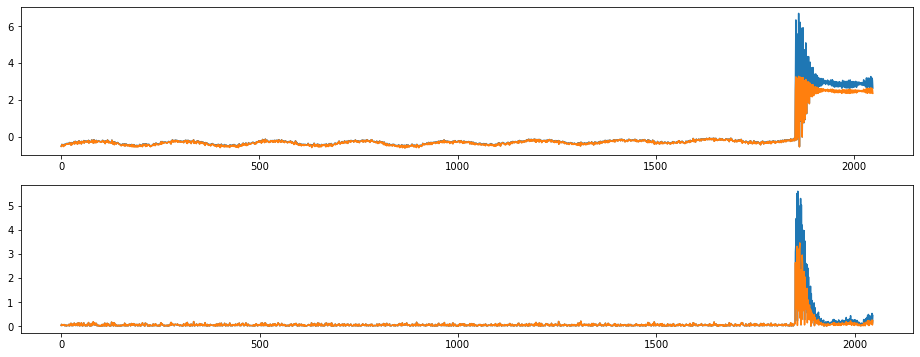

index:  594755
MAE:  0.06189241823511997
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


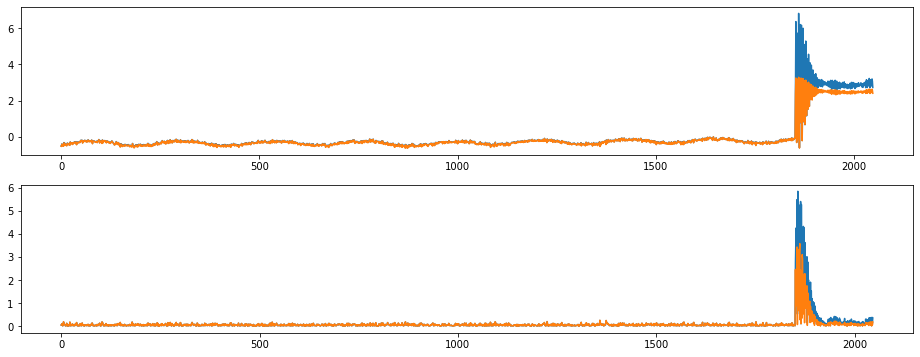

index:  594770
MAE:  0.06186392812760162
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


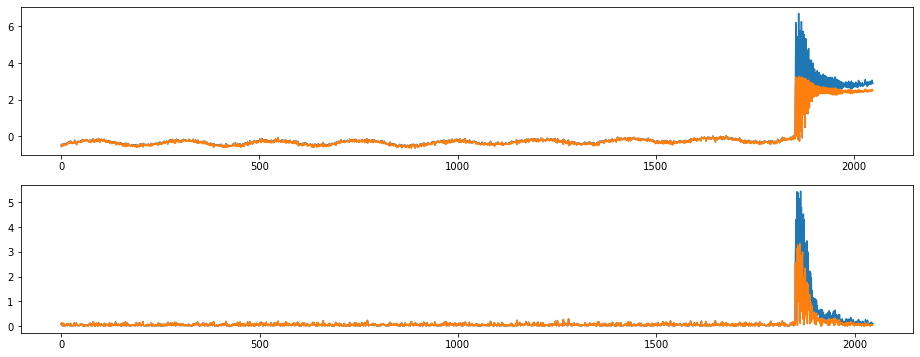

index:  594816
MAE:  0.06183425804516946
n_bunches       652
bunch_index     502
bunch_number    269
Name: 20650, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


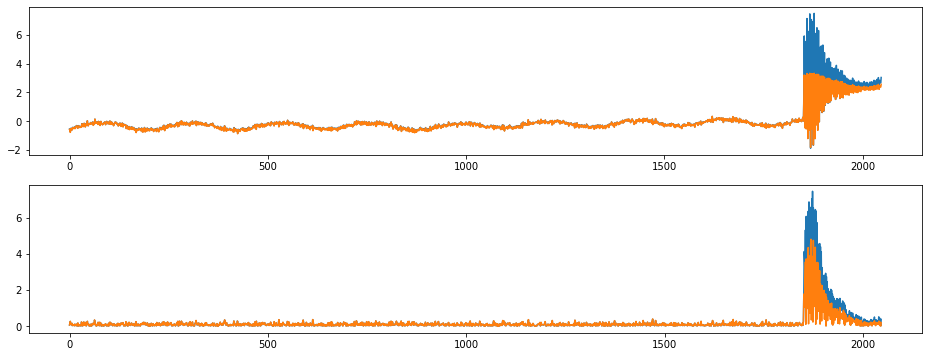

index:  594754
MAE:  0.06183161292387145
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


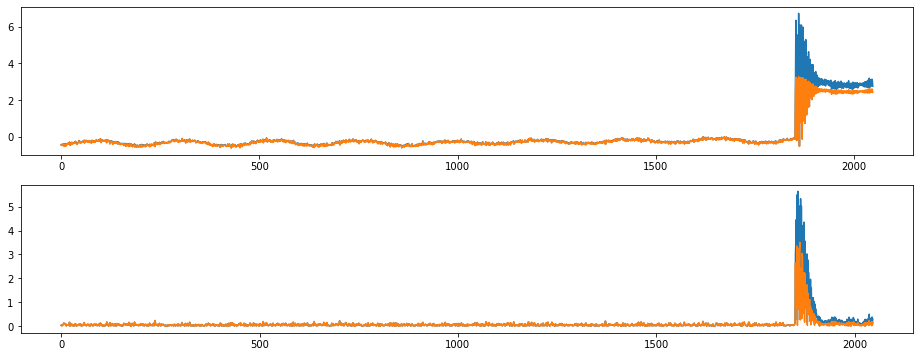

index:  594752
MAE:  0.061823594223981385
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


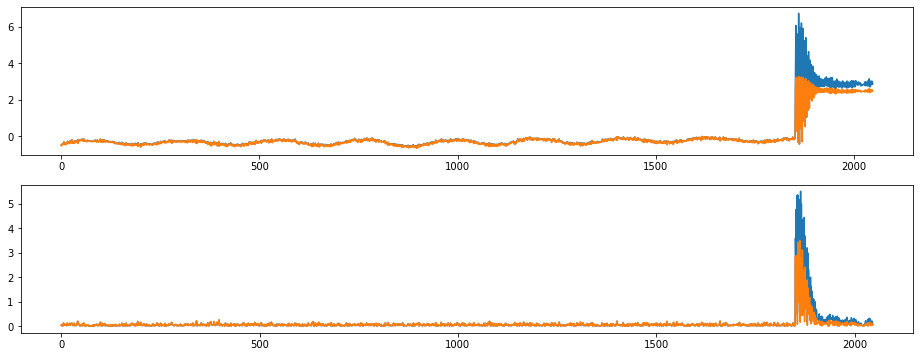

index:  594769
MAE:  0.061821038977773794
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


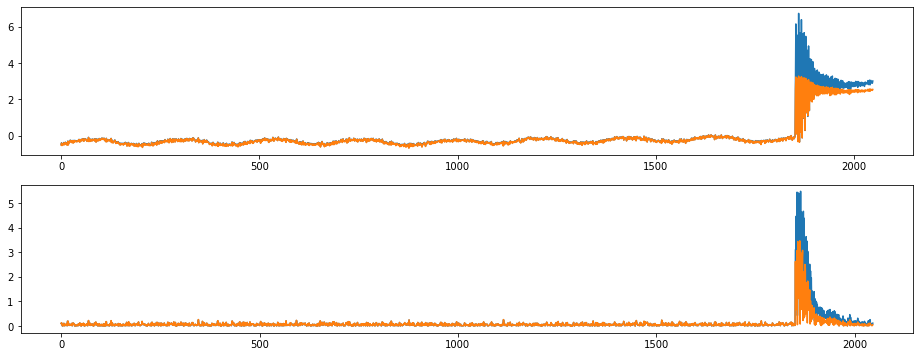

index:  594763
MAE:  0.06180036316753599
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


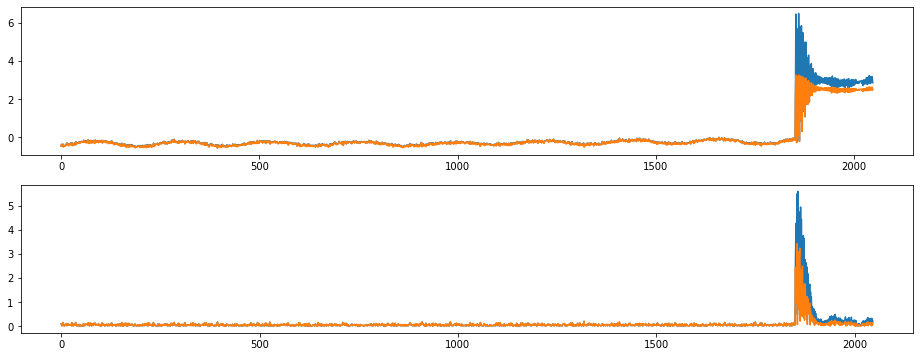

index:  594815
MAE:  0.06178285096209492
n_bunches       652
bunch_index     501
bunch_number    268
Name: 20649, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


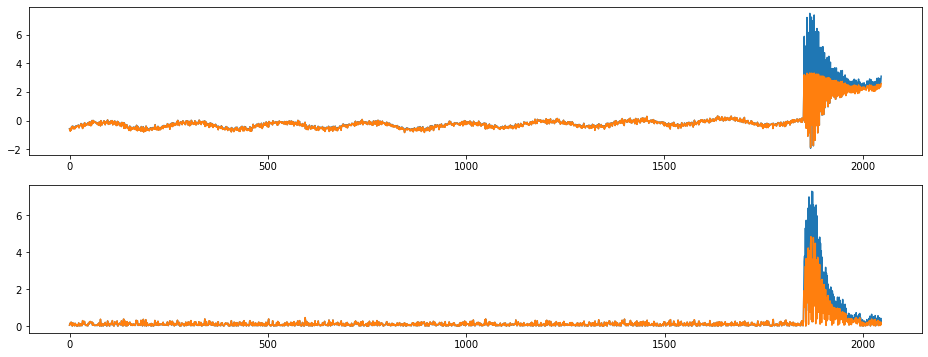

index:  594753
MAE:  0.061744450762875956
n_bunches       652
bunch_index     493
bunch_number    267
Name: 20648, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


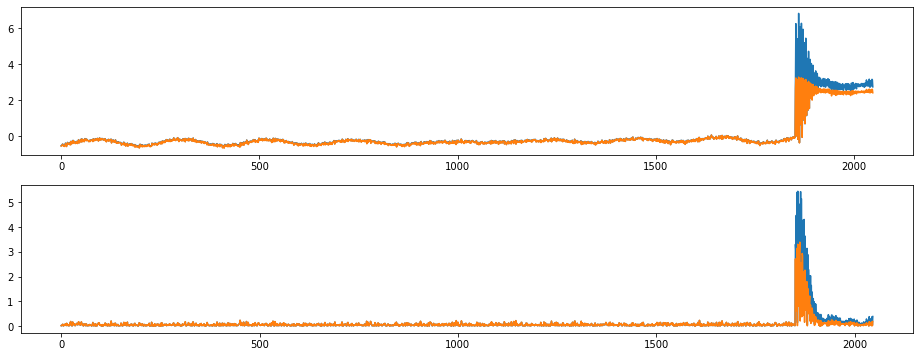

index:  594746
MAE:  0.061740227530938774
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


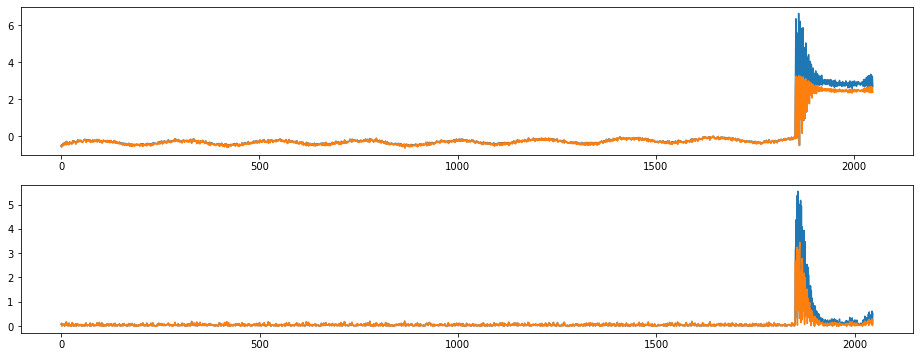

index:  594745
MAE:  0.06154186754867269
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


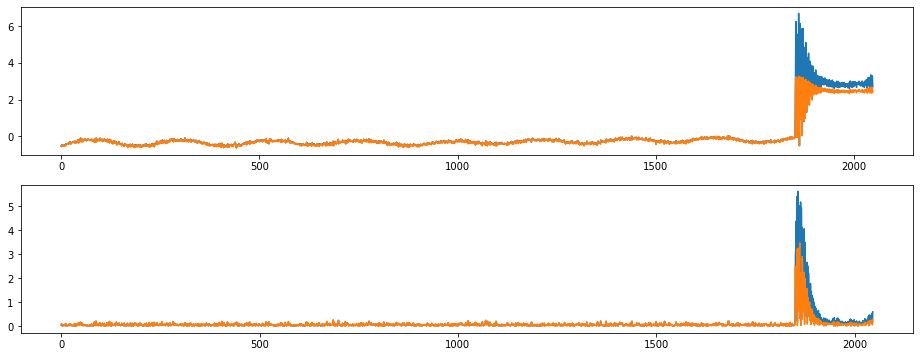

index:  594744
MAE:  0.06142180557427724
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


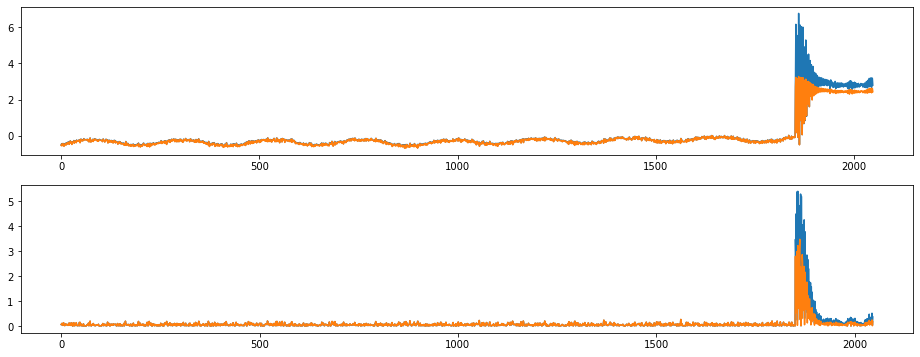

index:  594743
MAE:  0.06138522740221776
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


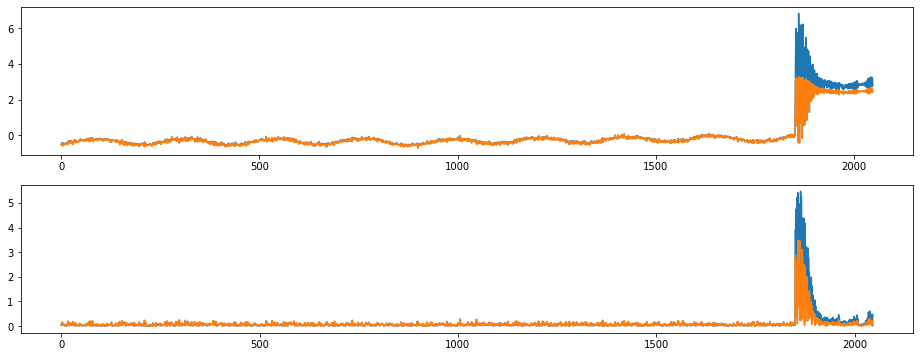

index:  149669
MAE:  0.060684775634189336
n_bunches       572
bunch_index     835
bunch_number    457
Name: 5199, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6246/instability_data/06246_Inst_B1H_Q7_20170927_04h56m36s.h5


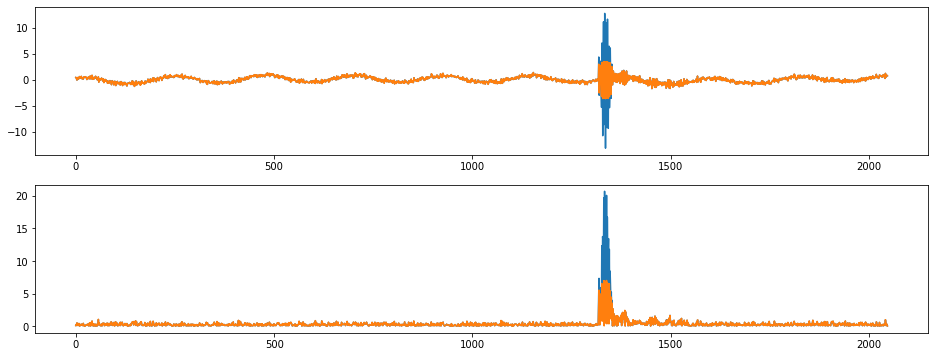

index:  134767
MAE:  0.05993011897215733
n_bunches        796
bunch_index     1368
bunch_number     752
Name: 4686, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


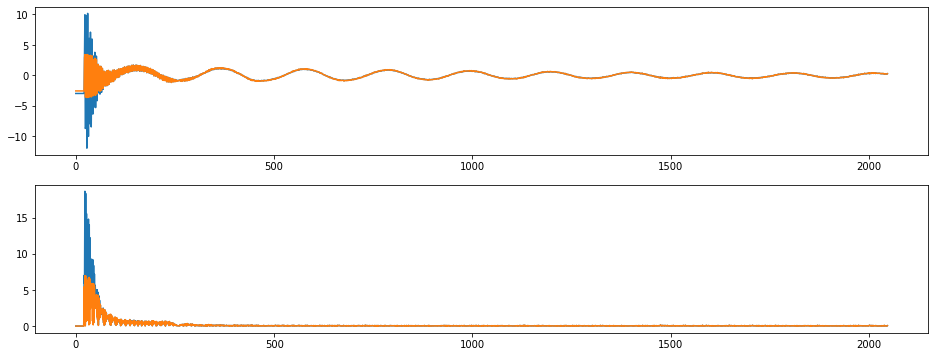

index:  594739
MAE:  0.05898591398756596
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


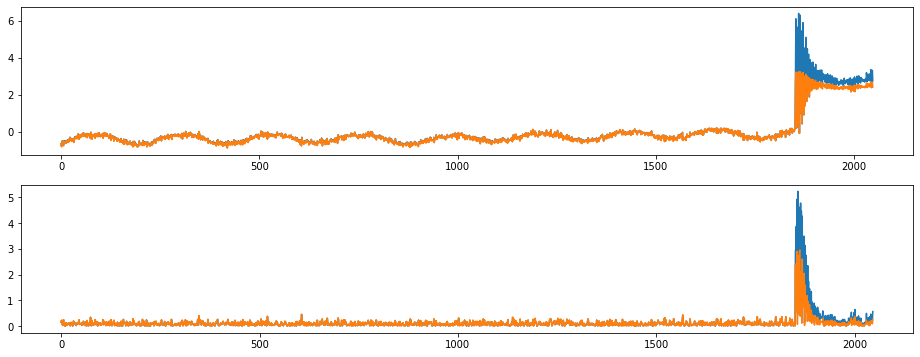

index:  594734
MAE:  0.05849191785216647
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


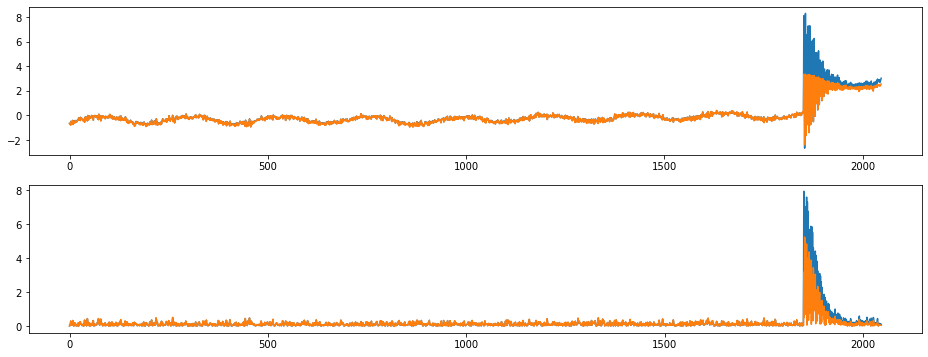

index:  237299
MAE:  0.057859855551214416
n_bunches       12
bunch_index     22
bunch_number     4
Name: 8219, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7224/instability_data/07224_Inst_B1H_Q7_20180927_18h14m14s.h5


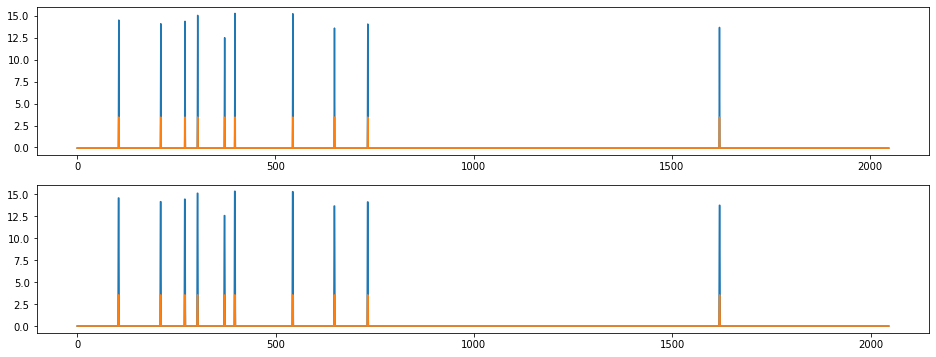

index:  728325
MAE:  0.05747345560596782
n_bunches        733
bunch_index     3370
bunch_number     714
Name: 25256, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7477/instability_data/07477_Inst_B1H_Q7_20181127_07h35m15s.h5


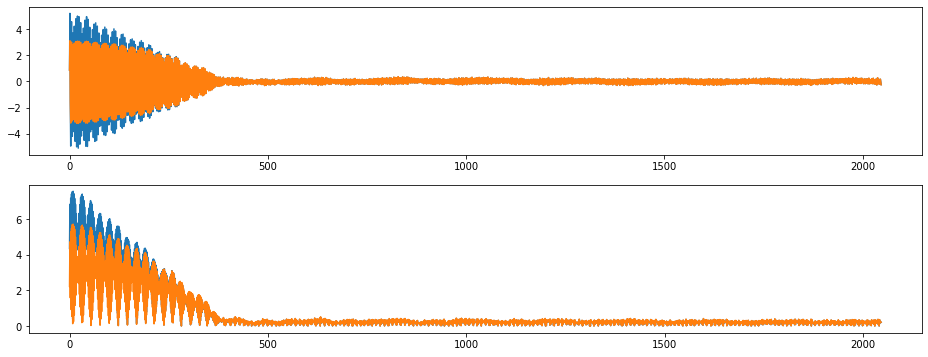

index:  594735
MAE:  0.0572496047492278
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


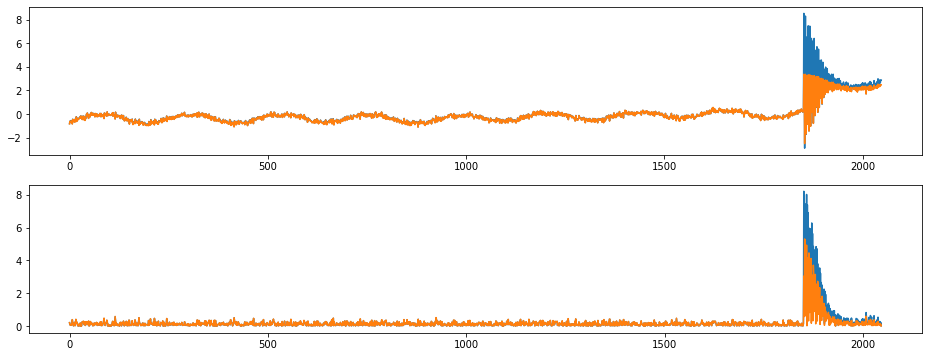

index:  594738
MAE:  0.057191665406223585
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


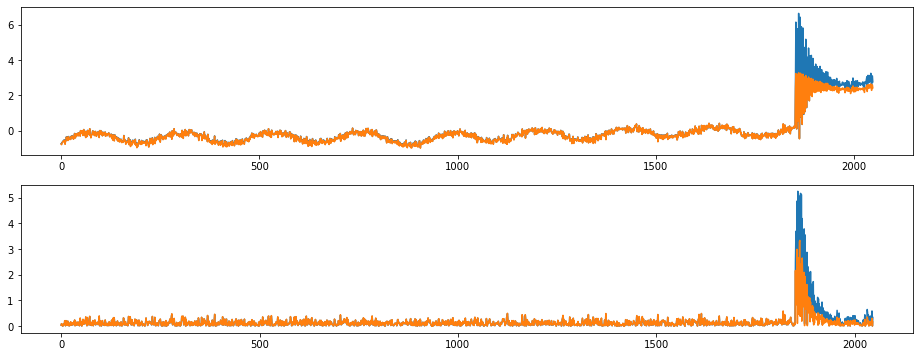

index:  594736
MAE:  0.05538951746651402
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


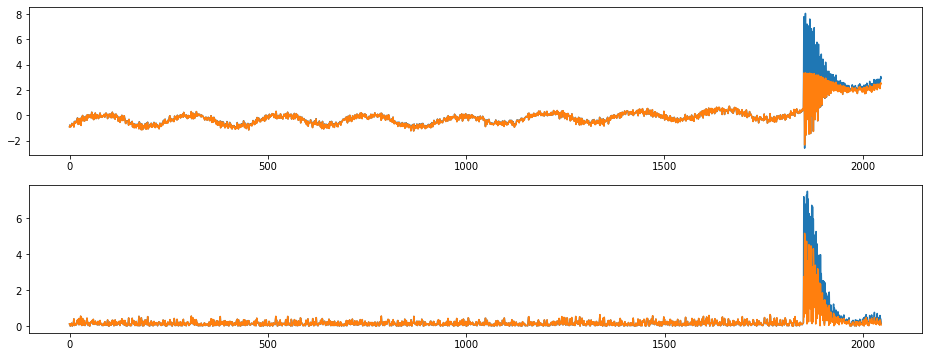

index:  578052
MAE:  0.054057184978949145
n_bunches        733
bunch_index     2163
bunch_number     459
Name: 20062, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7480/instability_data/07480_Inst_B1H_Q7_20181127_23h52m23s.h5


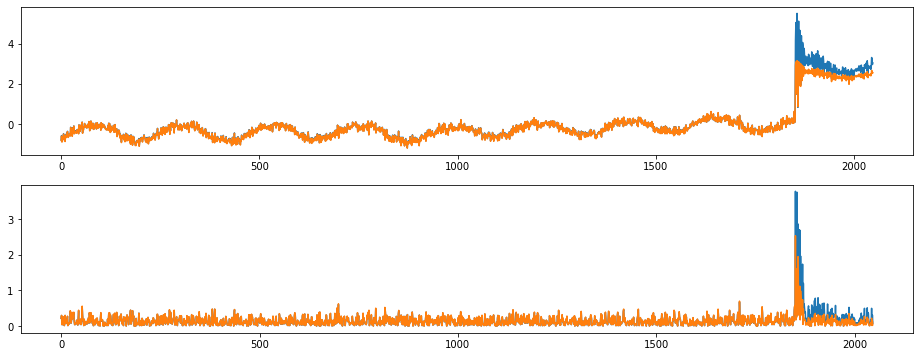

index:  578066
MAE:  0.05395890925732219
n_bunches        733
bunch_index     2163
bunch_number     459
Name: 20062, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7480/instability_data/07480_Inst_B1H_Q7_20181127_23h52m23s.h5


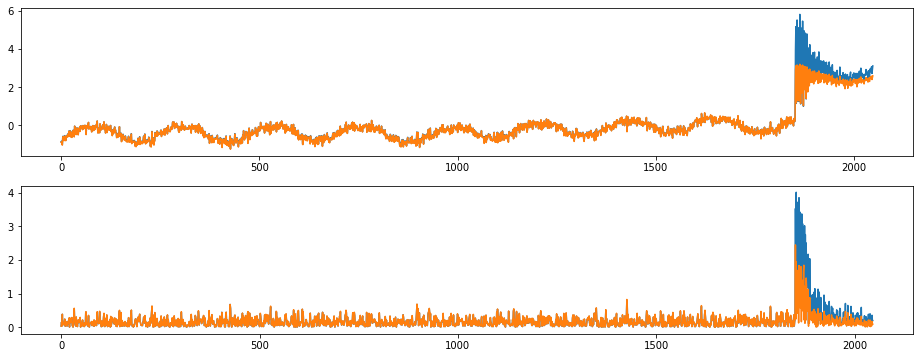

index:  578051
MAE:  0.05381883089501589
n_bunches        733
bunch_index     2163
bunch_number     459
Name: 20062, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7480/instability_data/07480_Inst_B1H_Q7_20181127_23h52m23s.h5


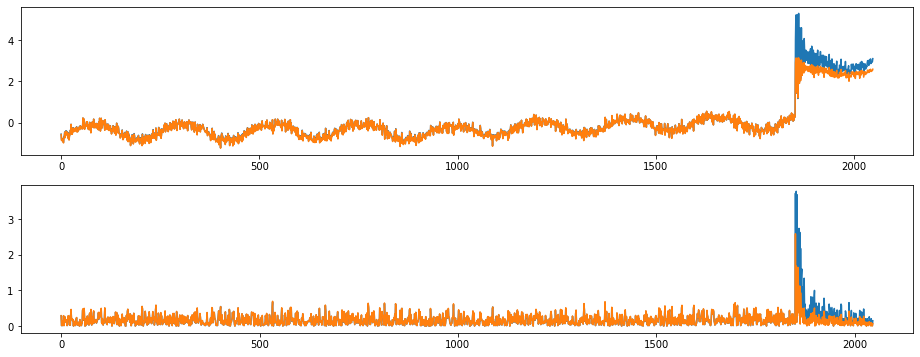

index:  578065
MAE:  0.05372966141004579
n_bunches        733
bunch_index     2163
bunch_number     459
Name: 20062, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7480/instability_data/07480_Inst_B1H_Q7_20181127_23h52m23s.h5


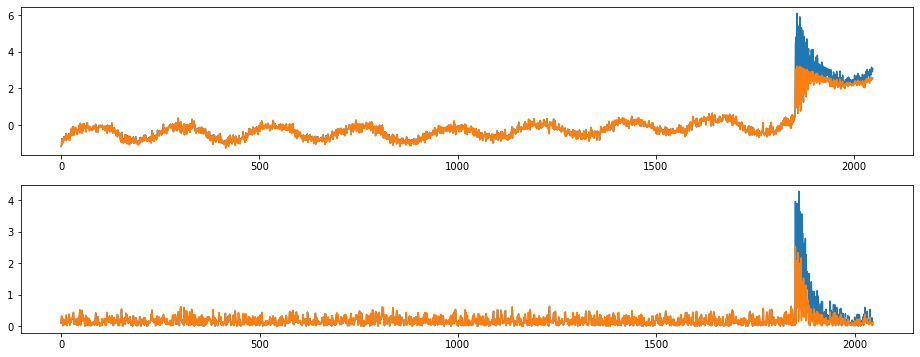

index:  594737
MAE:  0.05348415683271624
n_bunches       652
bunch_index     492
bunch_number    266
Name: 20647, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6360/instability_data/06360_Inst_B1H_Q7_20171103_13h13m41s.h5


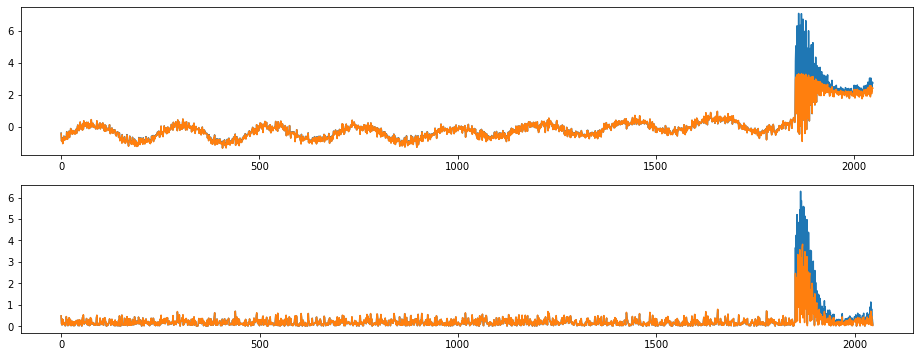

index:  578064
MAE:  0.05345260486667945
n_bunches        733
bunch_index     2163
bunch_number     459
Name: 20062, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7480/instability_data/07480_Inst_B1H_Q7_20181127_23h52m23s.h5


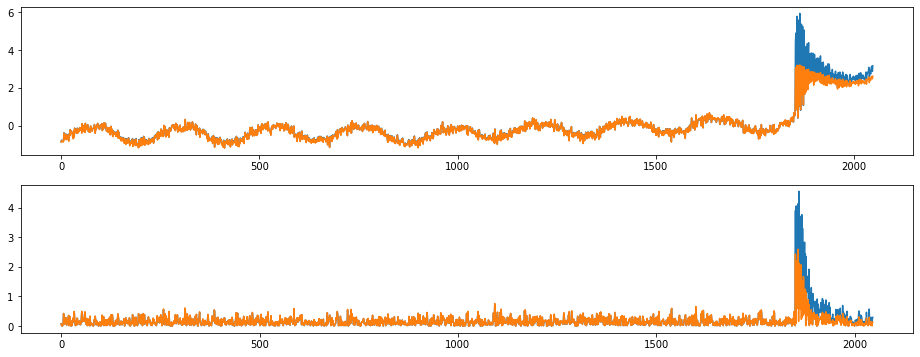

index:  578067
MAE:  0.05340500541778296
n_bunches        733
bunch_index     2163
bunch_number     459
Name: 20062, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7480/instability_data/07480_Inst_B1H_Q7_20181127_23h52m23s.h5


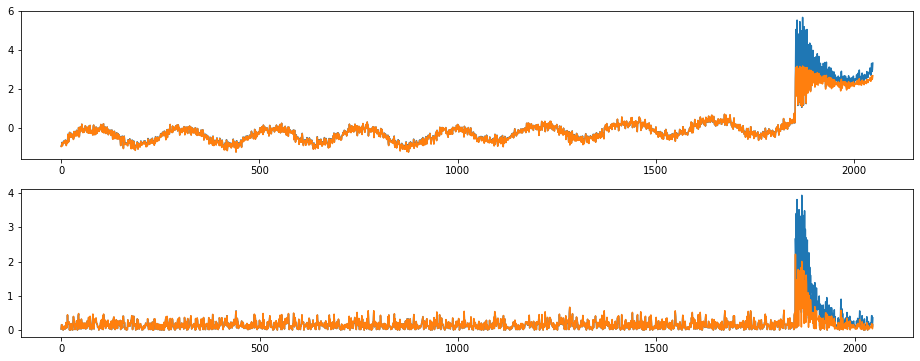

In [43]:
for i in range(200):
    anomalous = i
    anomalous_index = max_MAE_indices[anomalous]

    print('index: ', anomalous_index)
    print("MAE: ", MAE_train[anomalous_index])
    # I'm not sure this row is correct
    metadata_row = train_generator.metadata.iloc[anomalous_index // 32]
    print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
    print(metadata_row['file'])

    true_signal = train_dataset[anomalous_index].squeeze()
    pred_signal = train_pred[anomalous_index].squeeze()

    plot_true_pred(true_signal, pred_signal)
    plt.show()

# Top leftmost signals

index:  131134
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1154
bunch_number     628
Name: 4562, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


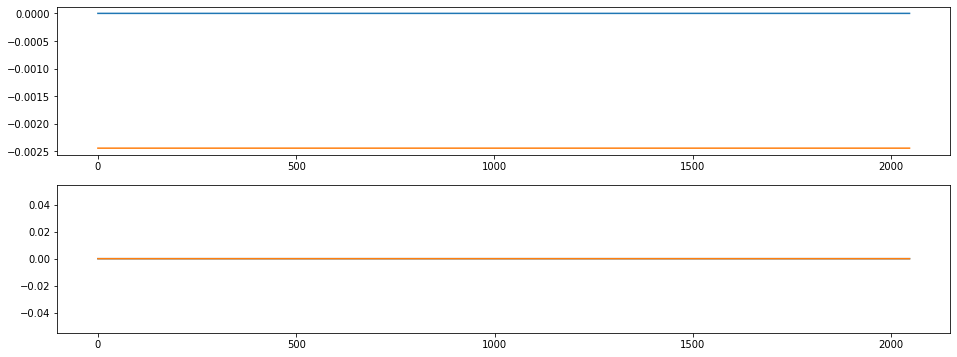

index:  17917
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


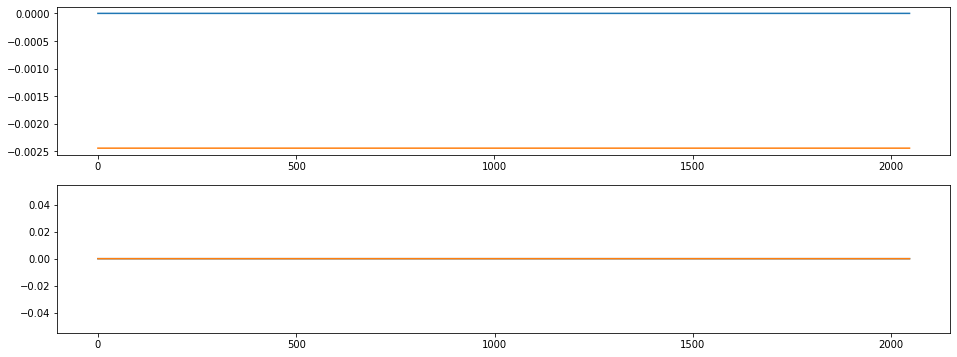

index:  17916
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


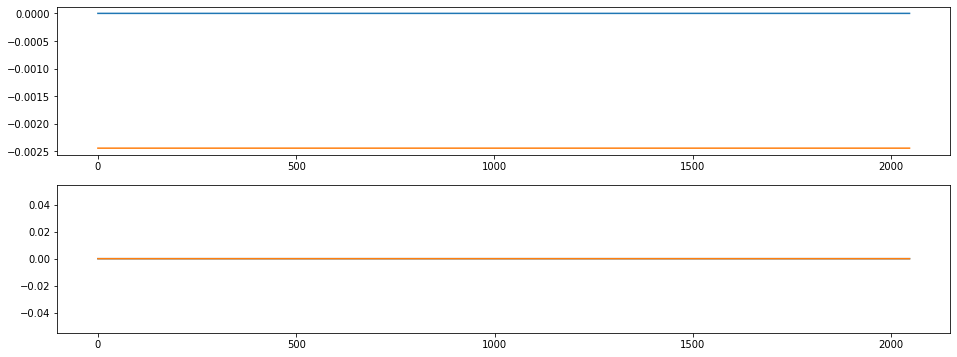

index:  17915
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


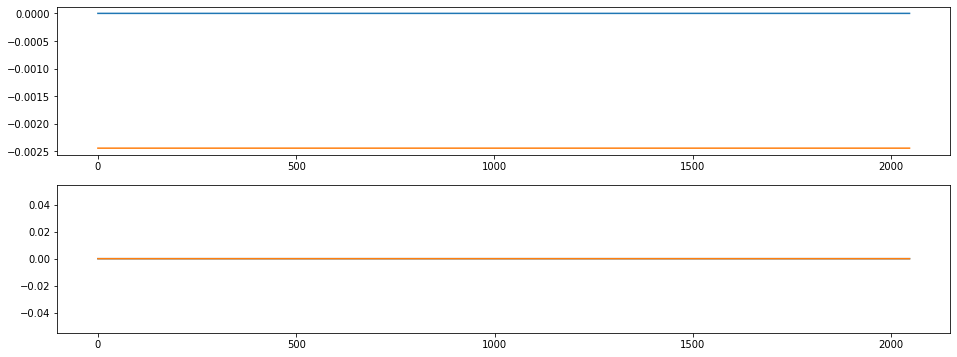

index:  17914
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


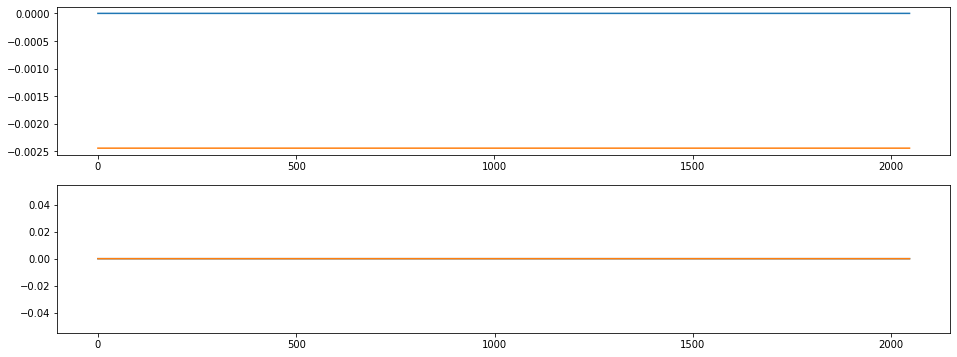

index:  17913
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


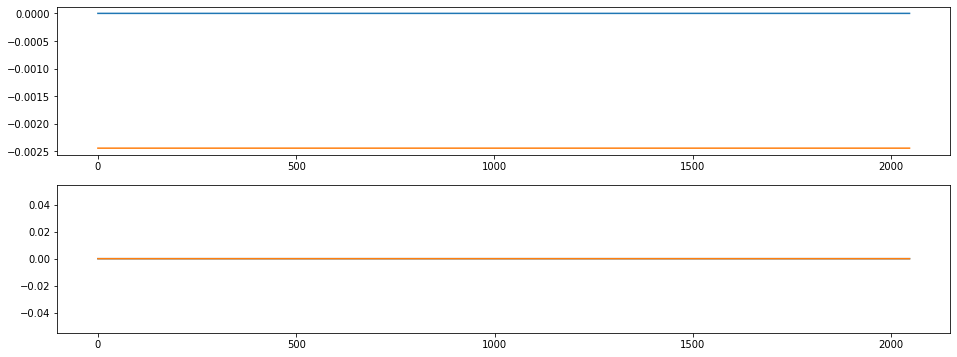

index:  131133
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1154
bunch_number     628
Name: 4562, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


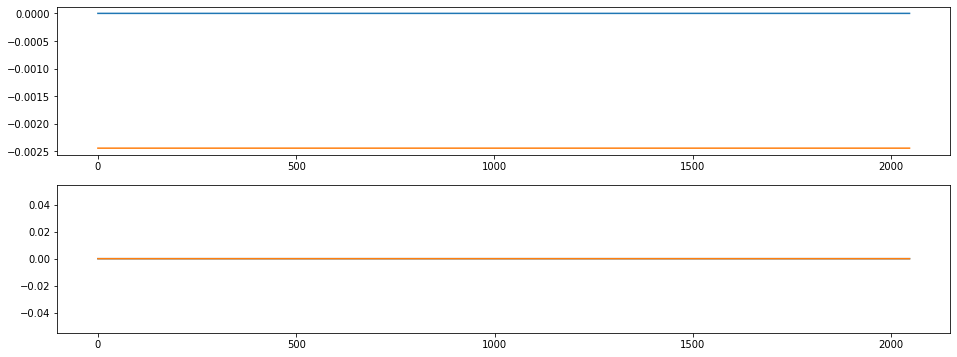

index:  17912
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


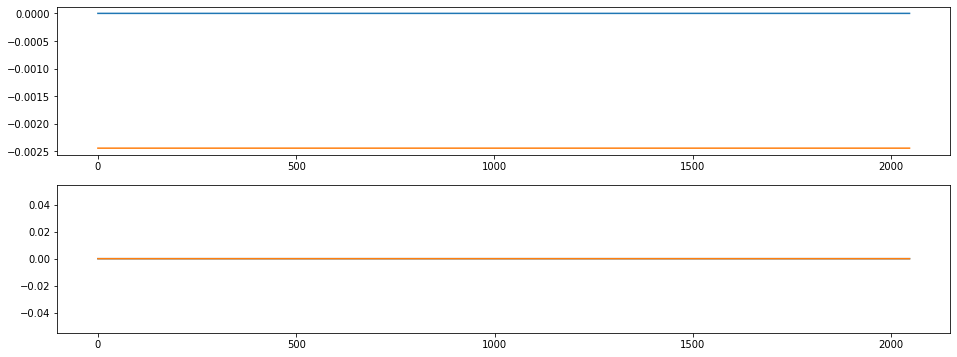

index:  17911
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


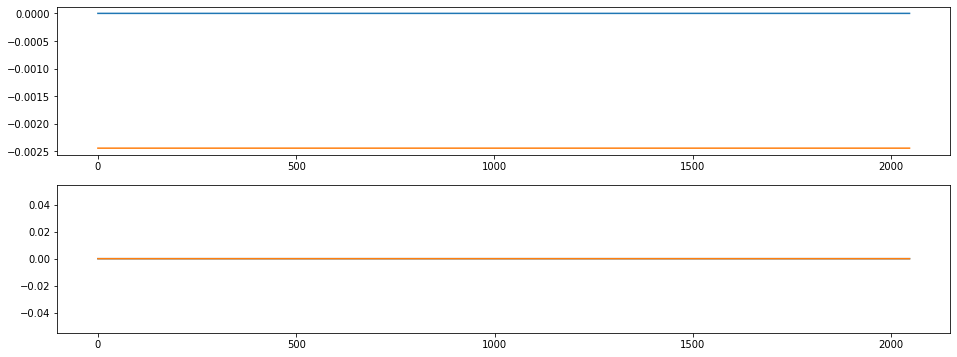

index:  17910
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


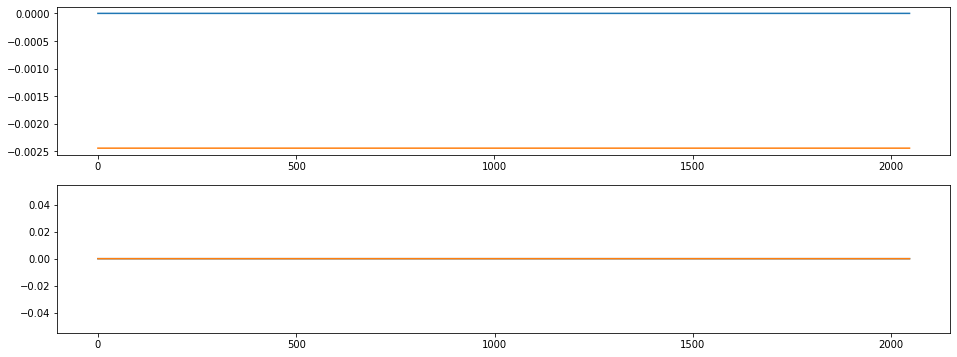

index:  17909
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


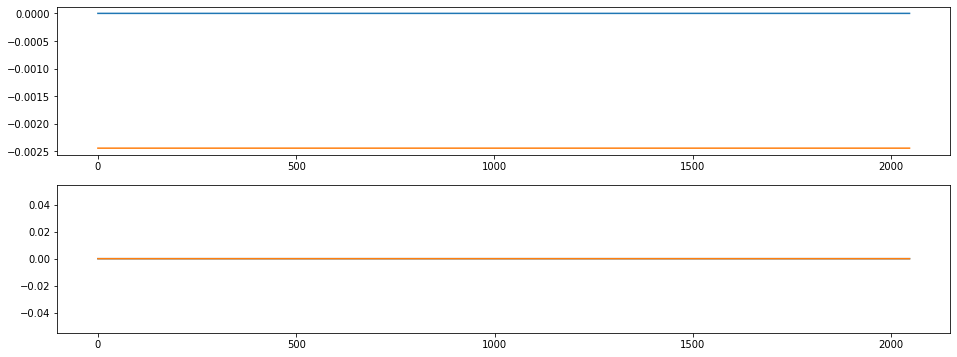

index:  17908
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


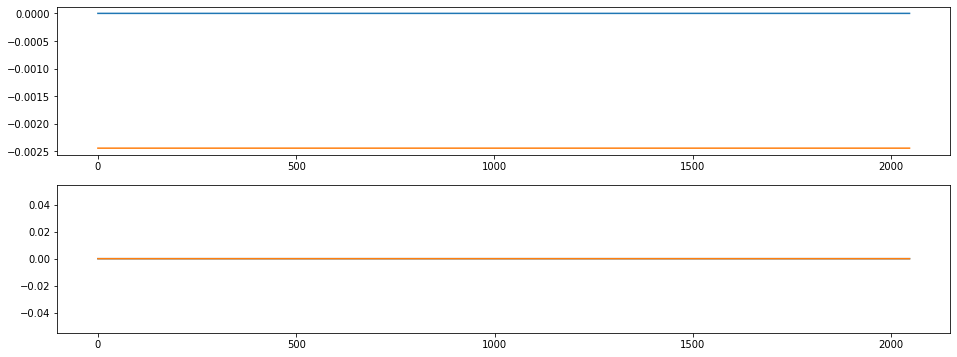

index:  32787
MAE:  0.00244385888800025
n_bunches        972
bunch_index     1738
bunch_number     918
Name: 1131, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


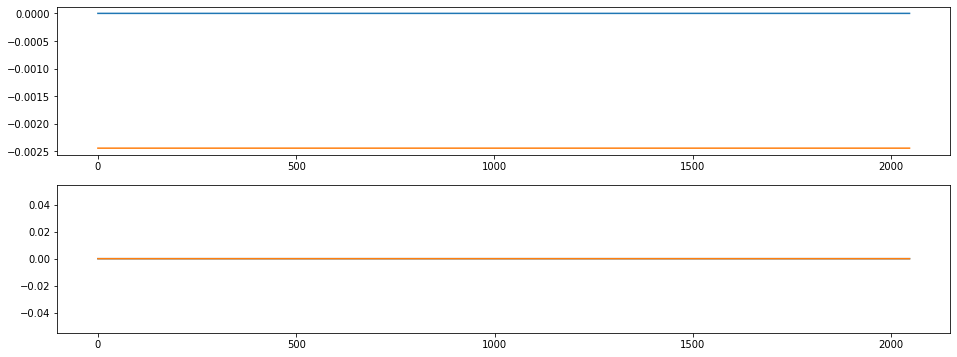

index:  17918
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


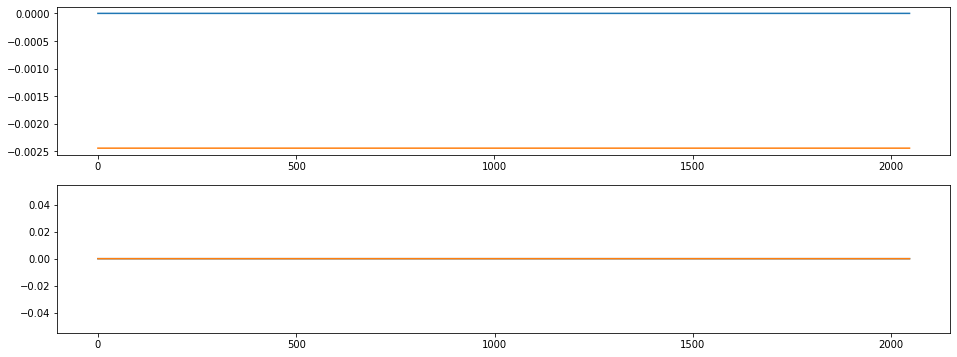

index:  17907
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


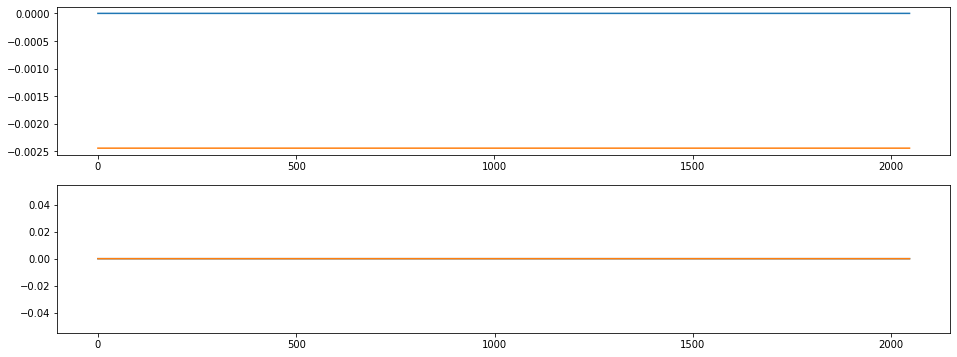

index:  17905
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


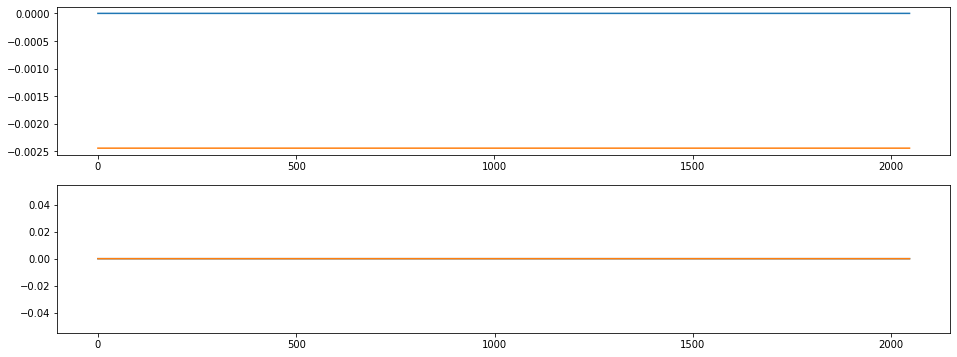

index:  17904
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


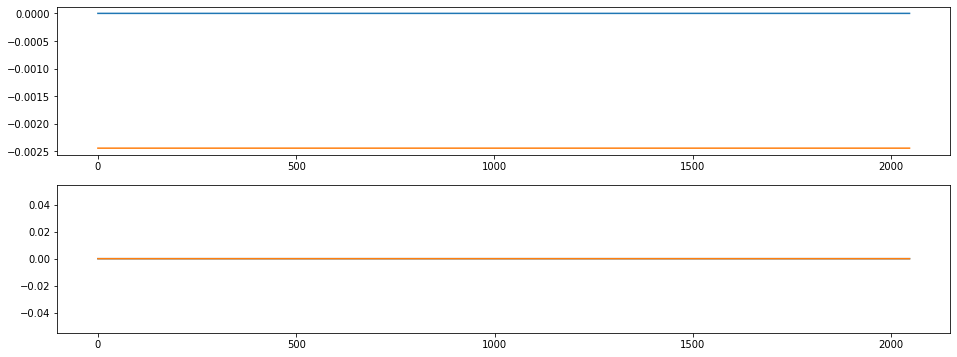

index:  17903
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


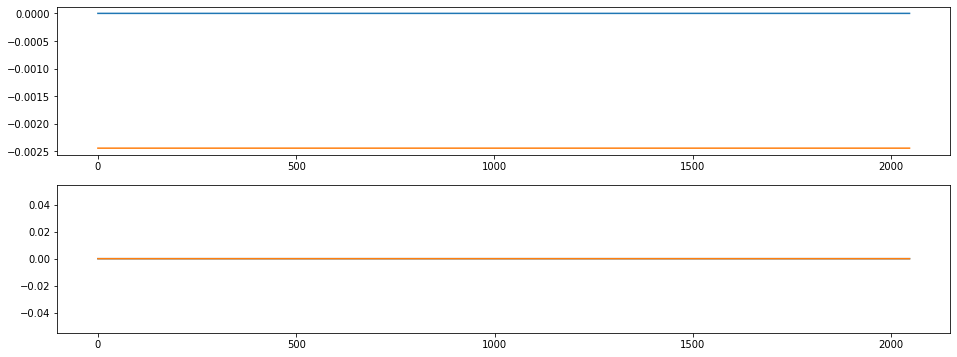

index:  17902
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


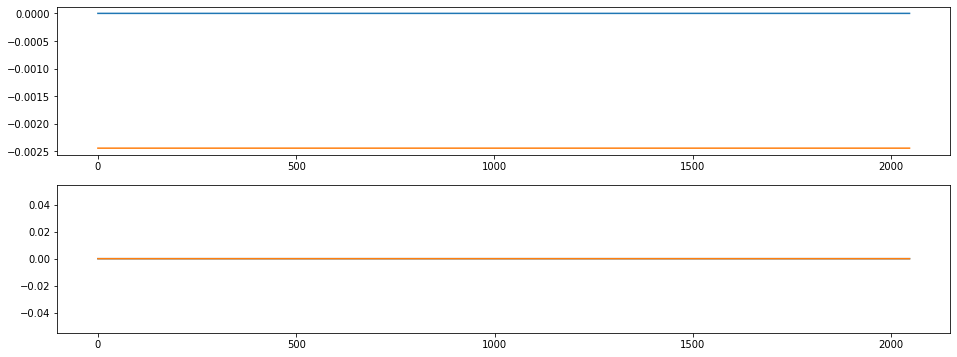

index:  17901
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


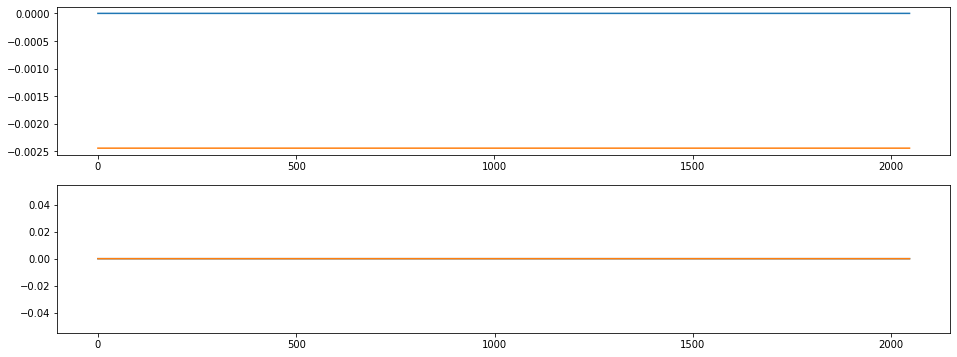

index:  17900
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


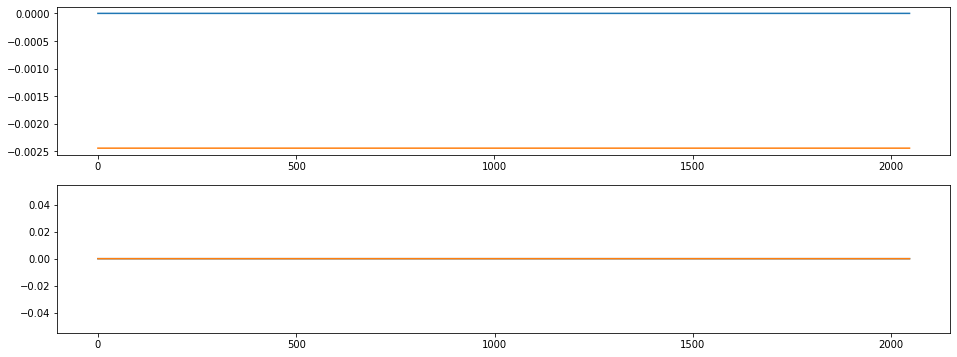

index:  17899
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


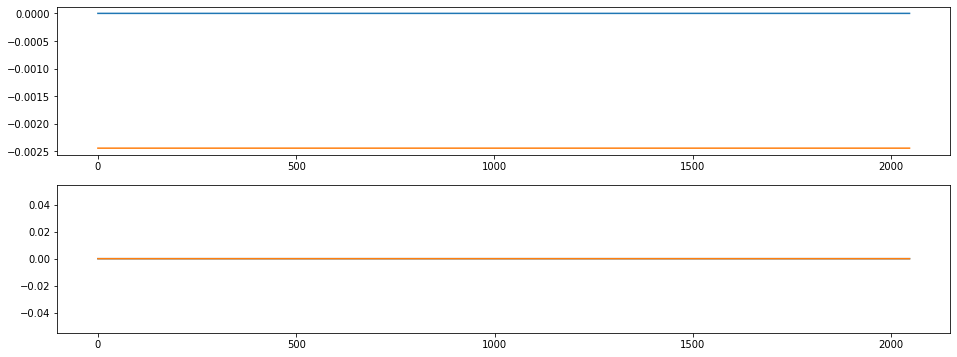

index:  17898
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


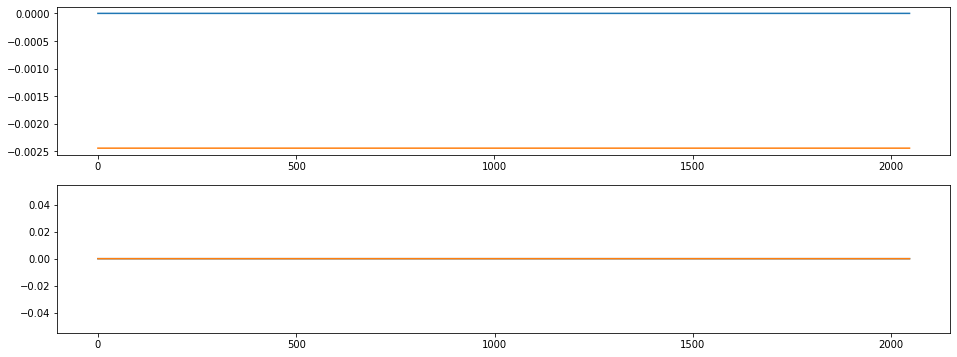

index:  17897
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


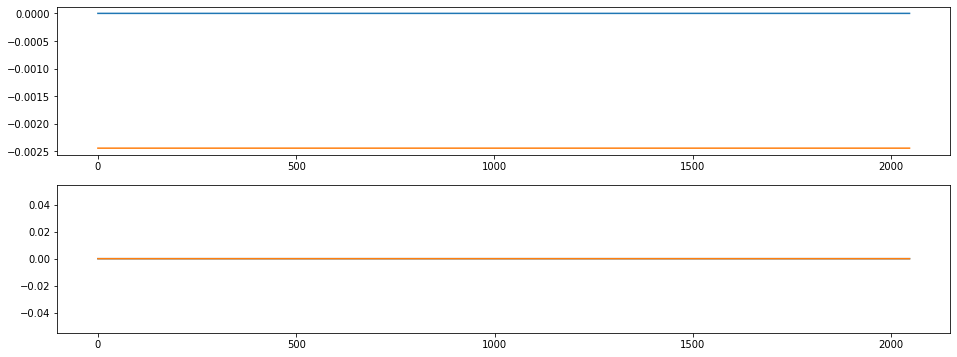

index:  17896
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


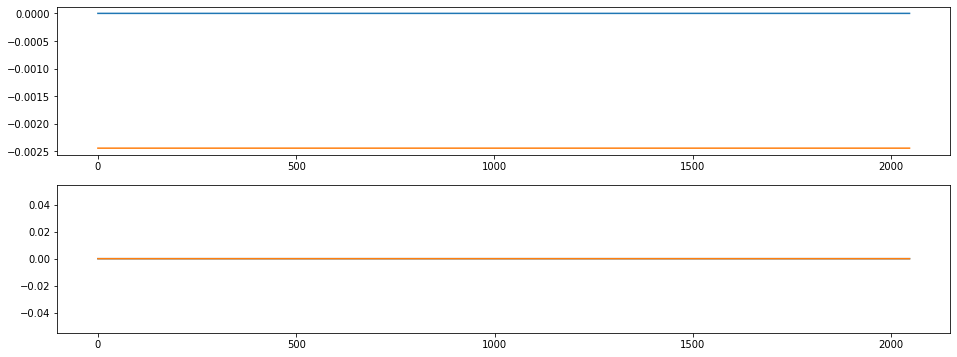

index:  17895
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


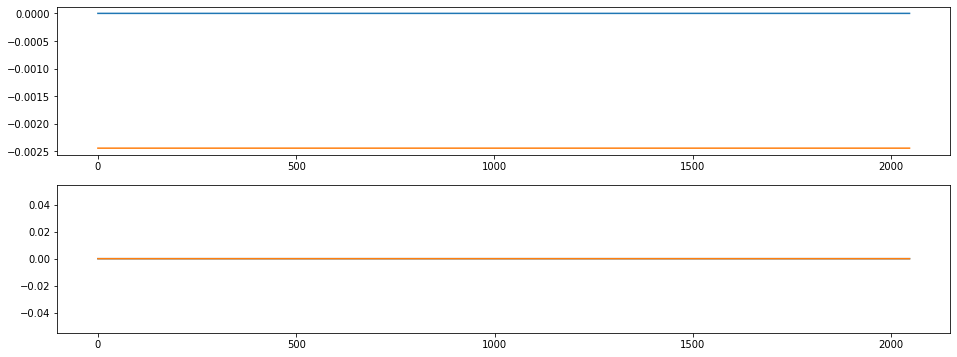

index:  17894
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


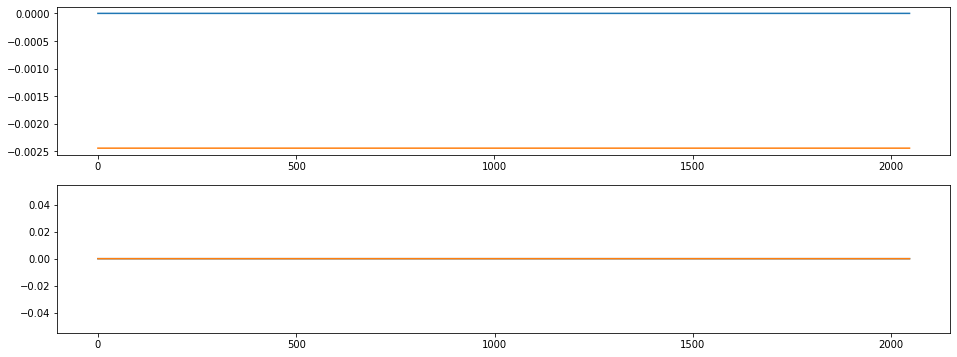

index:  17906
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


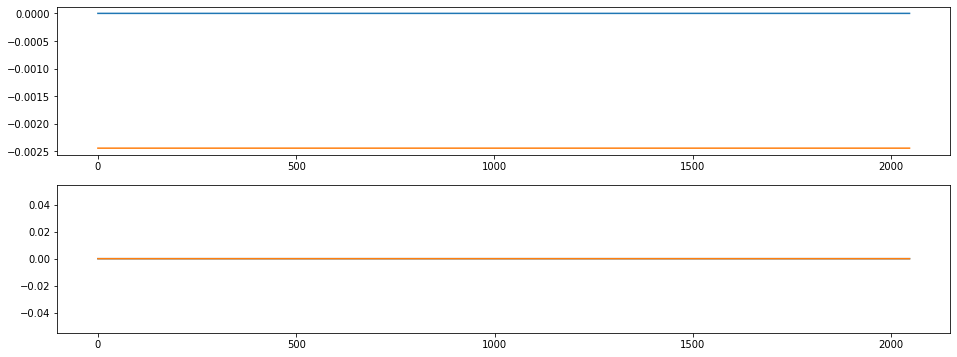

index:  17893
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


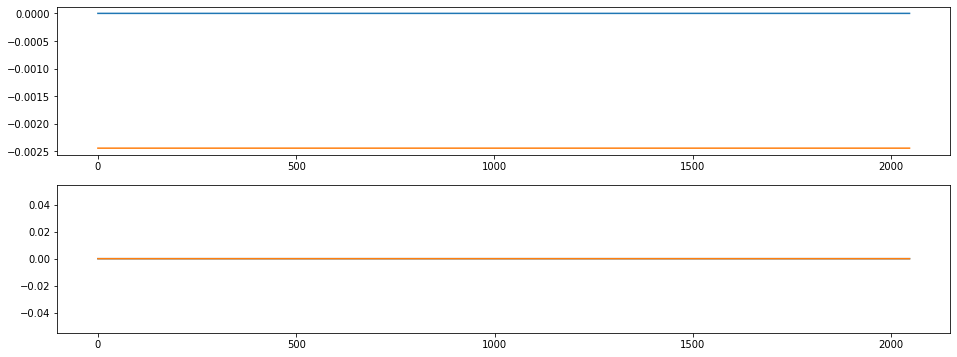

index:  17919
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


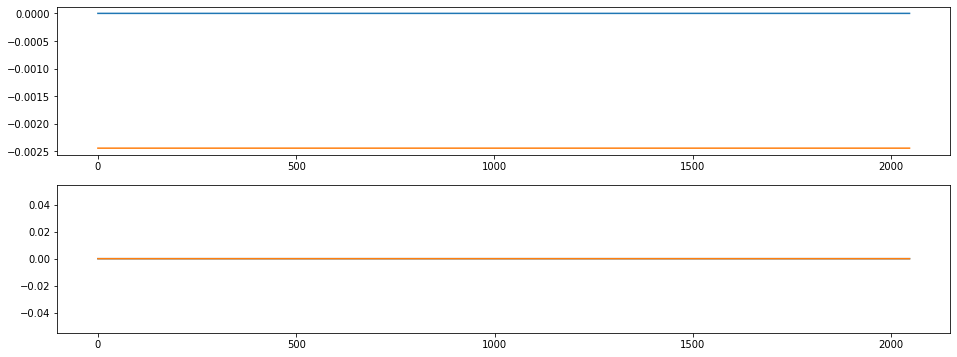

index:  131131
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1154
bunch_number     628
Name: 4562, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


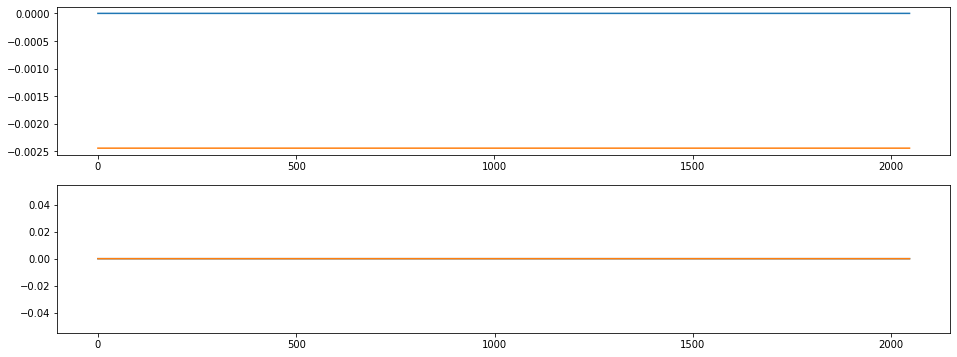

index:  35362
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


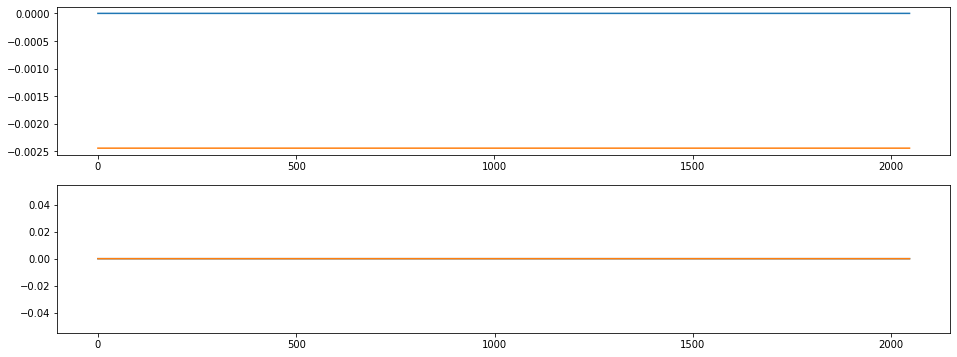

index:  35363
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


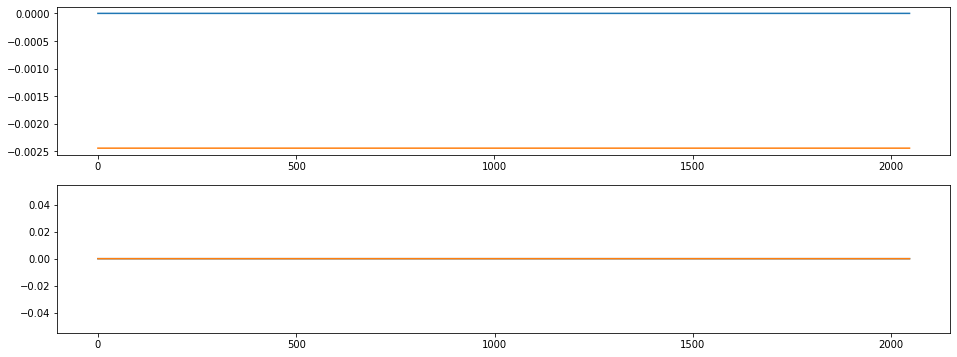

index:  35364
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


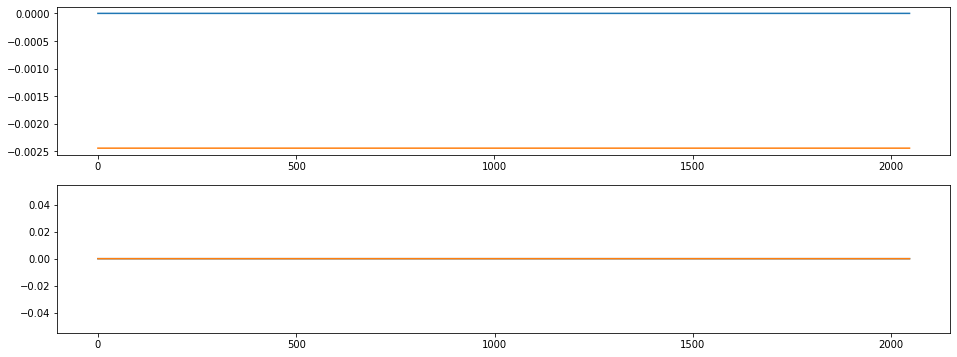

index:  35365
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


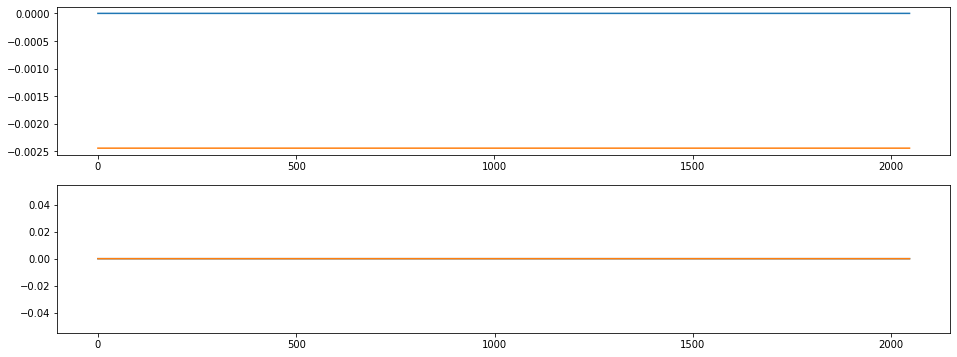

index:  32774
MAE:  0.00244385888800025
n_bunches        972
bunch_index     1738
bunch_number     918
Name: 1131, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


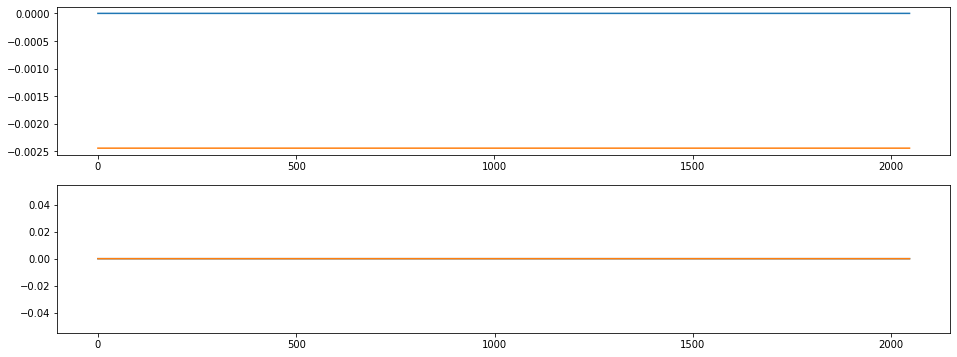

index:  35366
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


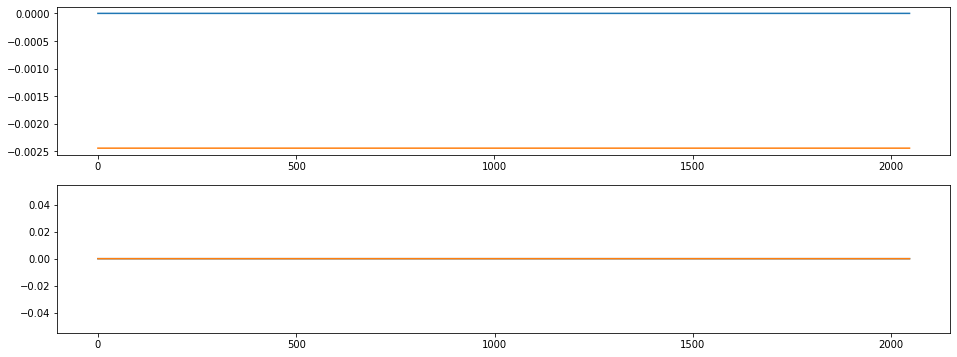

index:  35367
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


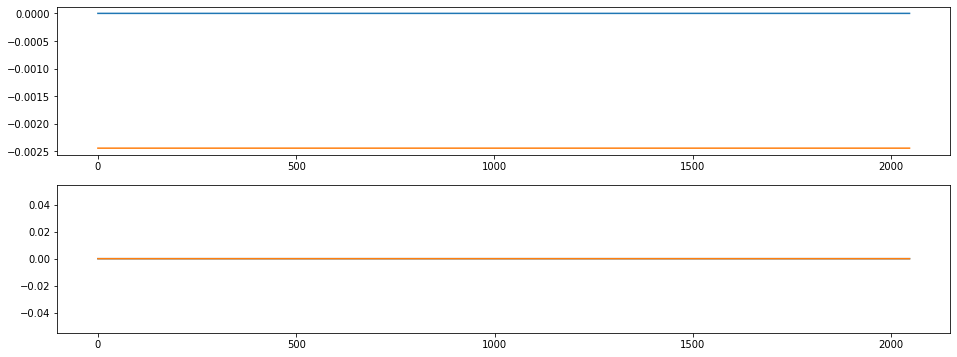

index:  35368
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


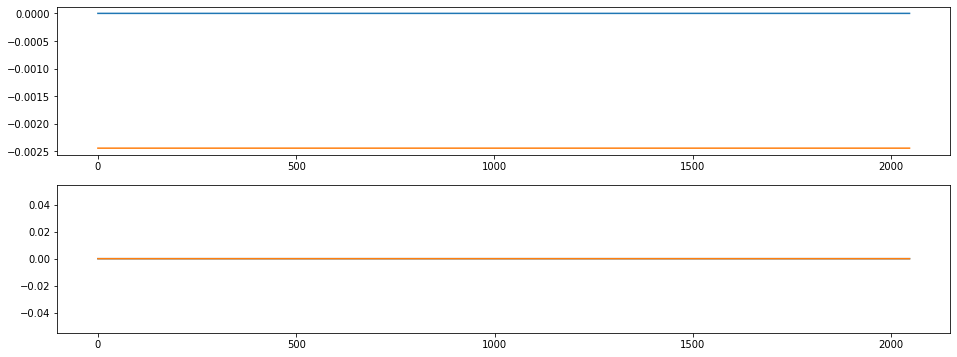

index:  35369
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


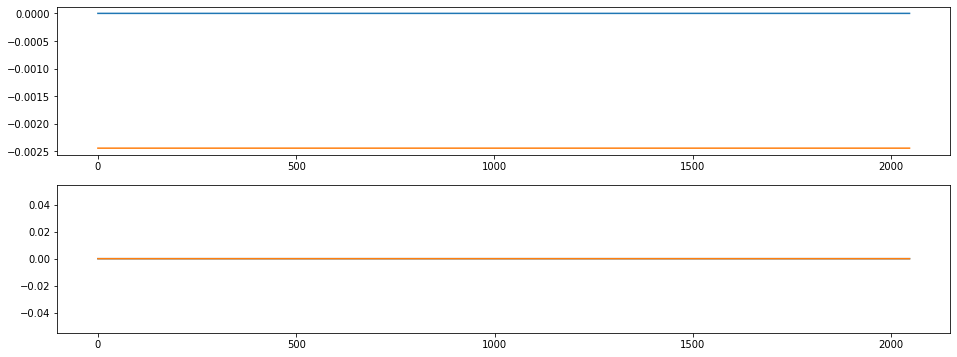

index:  35370
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


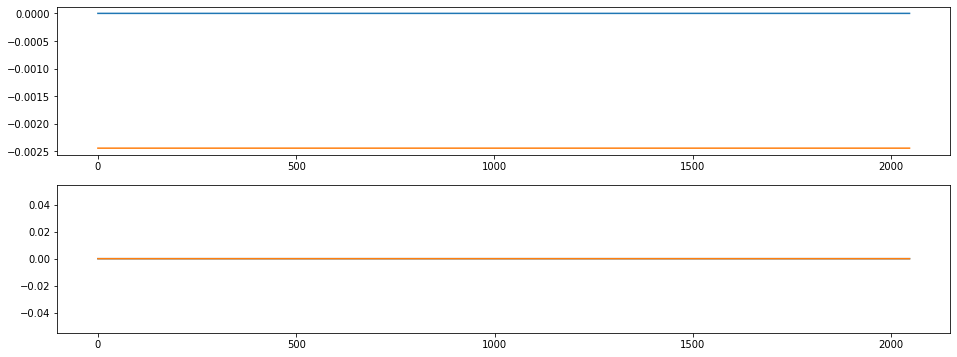

index:  35371
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


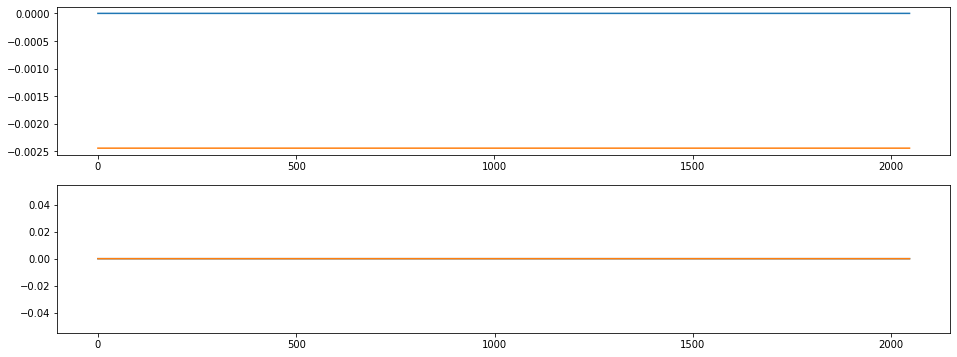

index:  35372
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


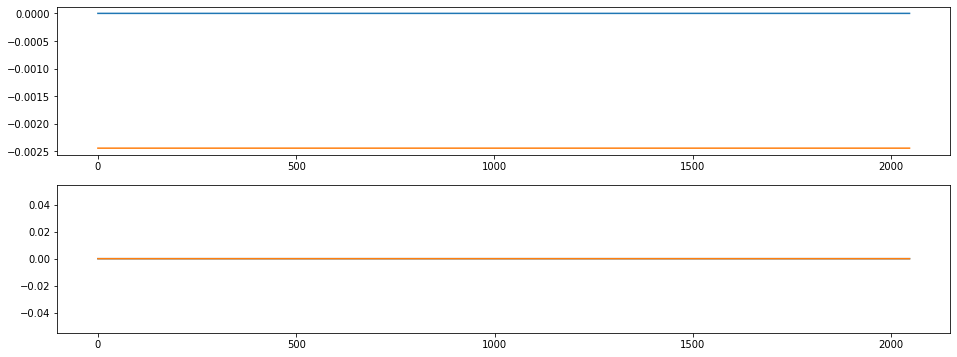

index:  131132
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1154
bunch_number     628
Name: 4562, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


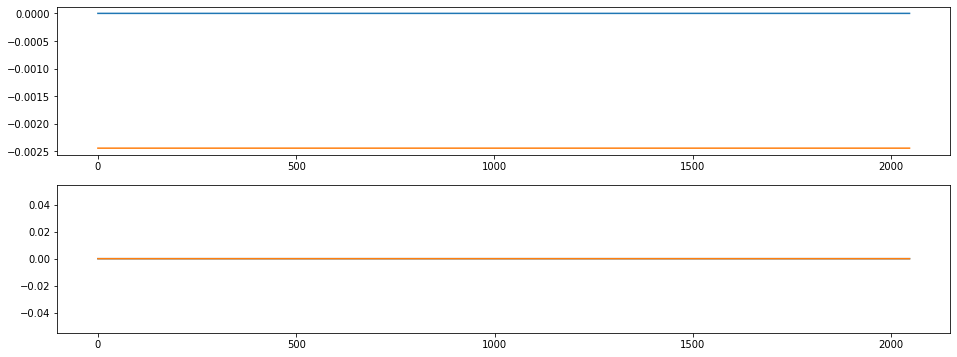

index:  35373
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


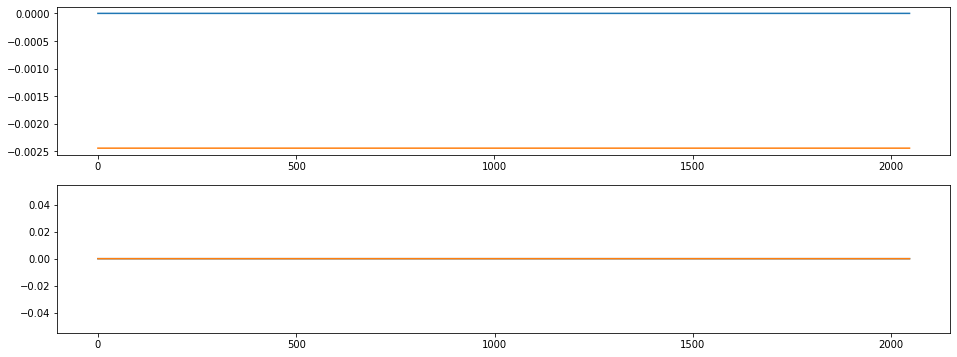

index:  35375
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


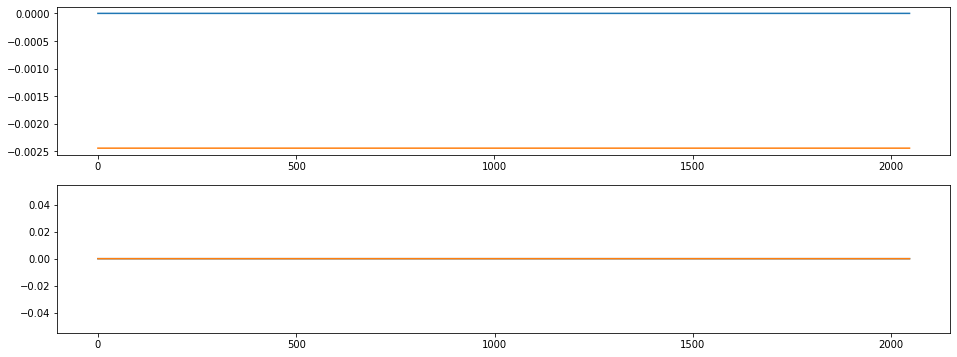

index:  35376
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


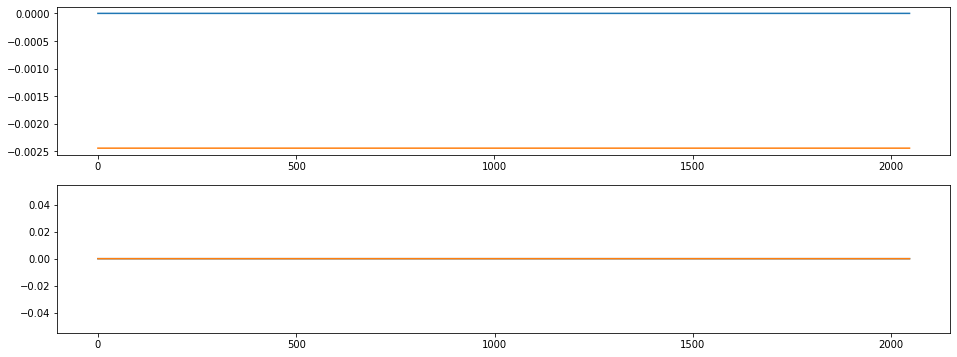

index:  35377
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


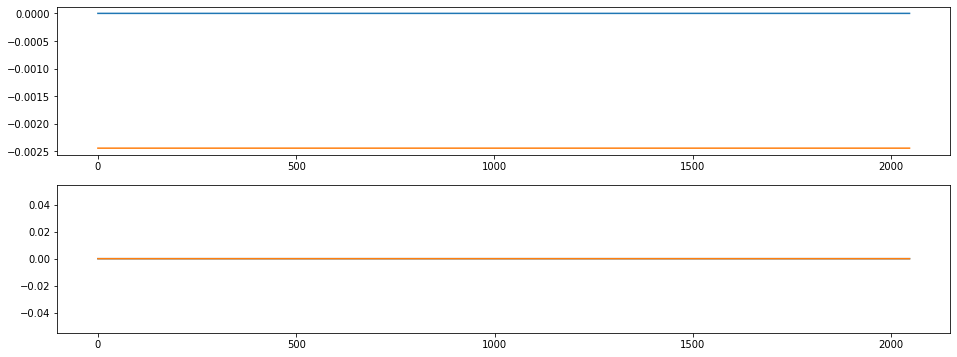

index:  132760
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


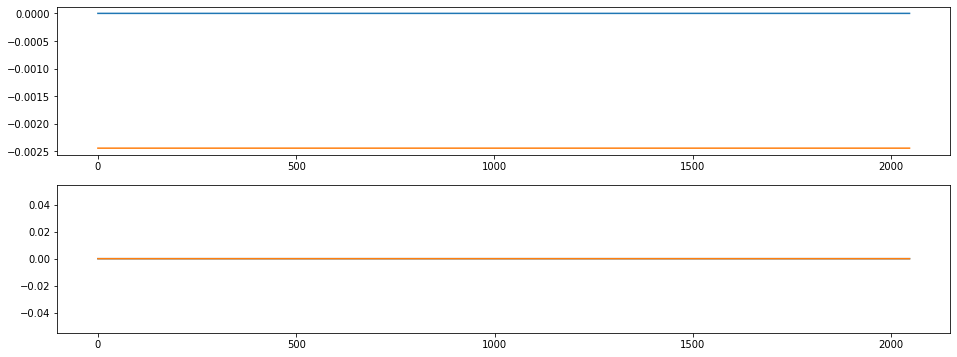

index:  132759
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


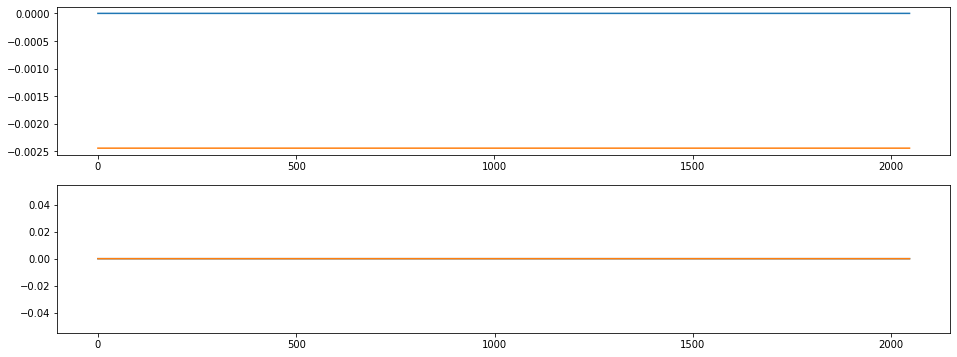

index:  131126
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1154
bunch_number     628
Name: 4562, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


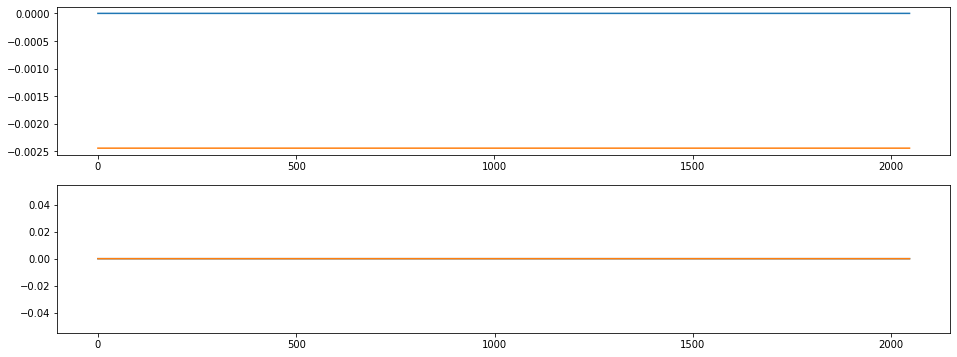

index:  131127
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1154
bunch_number     628
Name: 4562, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


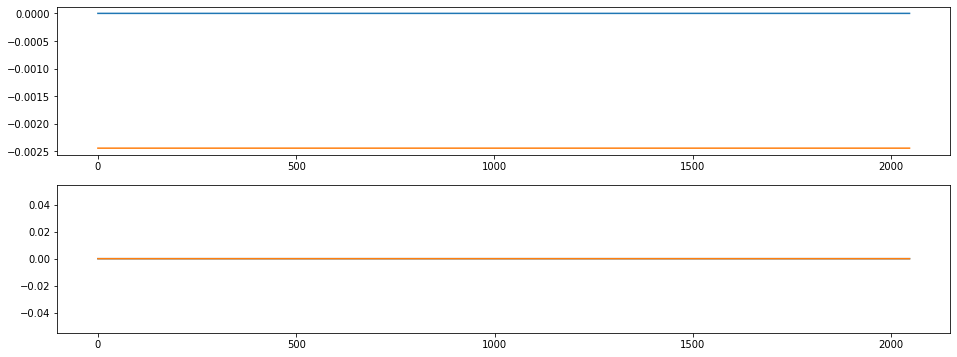

index:  131128
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1154
bunch_number     628
Name: 4562, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


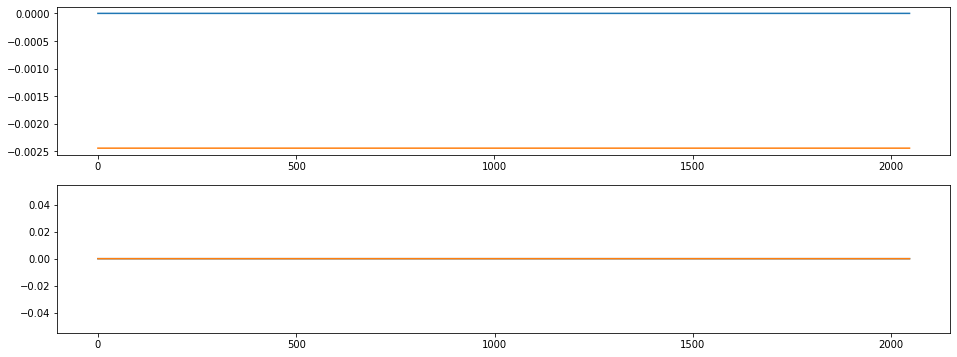

index:  132758
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


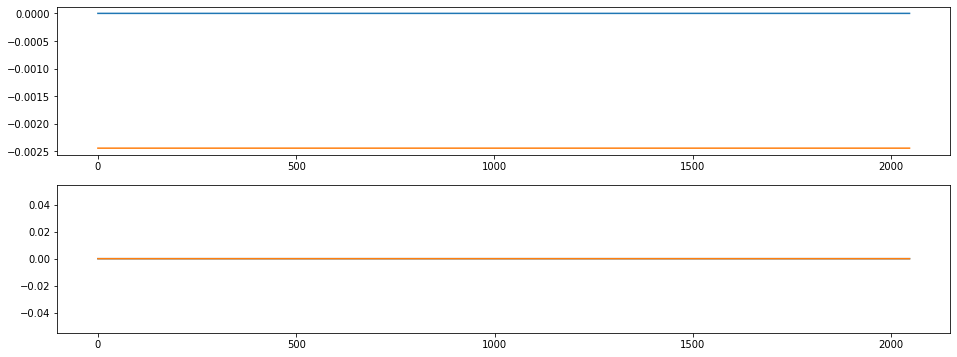

index:  132757
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


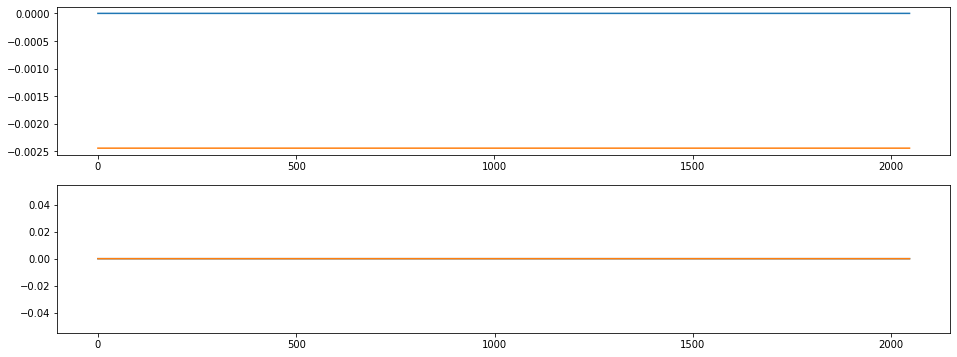

index:  131129
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1154
bunch_number     628
Name: 4562, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


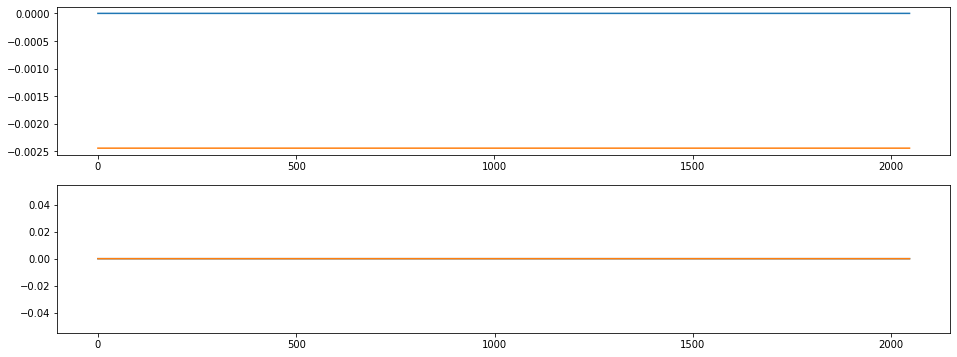

index:  131130
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1154
bunch_number     628
Name: 4562, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


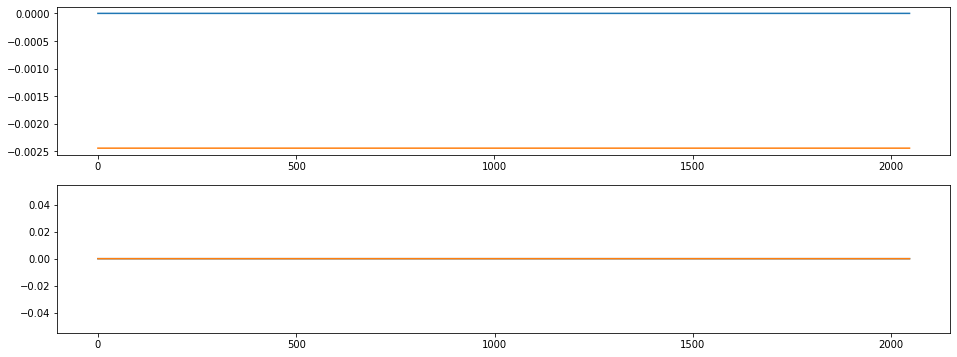

index:  35374
MAE:  0.00244385888800025
n_bunches       733
bunch_index     172
bunch_number     35
Name: 1220, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_09h54m15s.h5


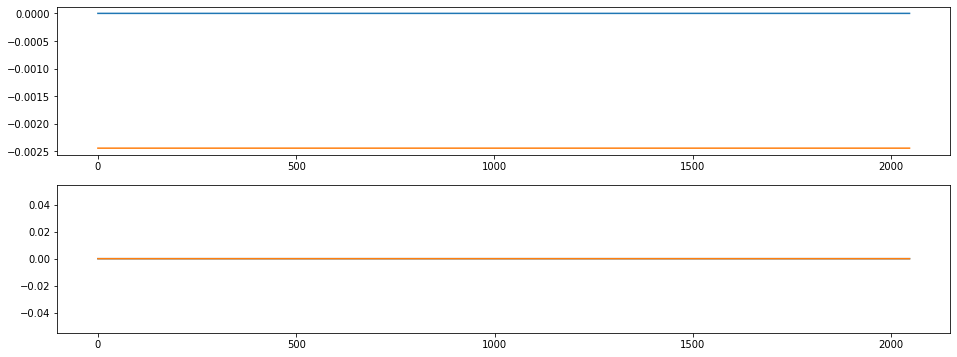

index:  134298
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1340
bunch_number     735
Name: 4669, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


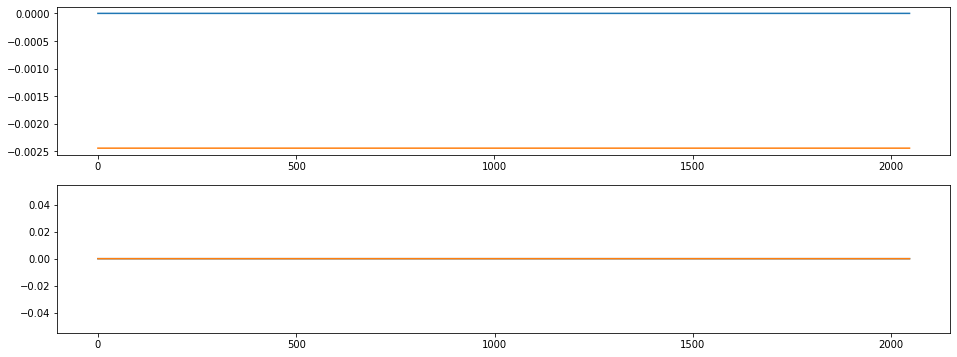

index:  17892
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


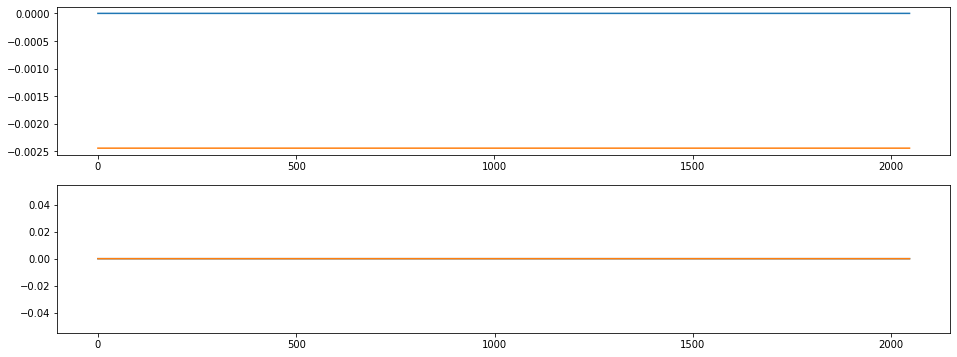

index:  17890
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


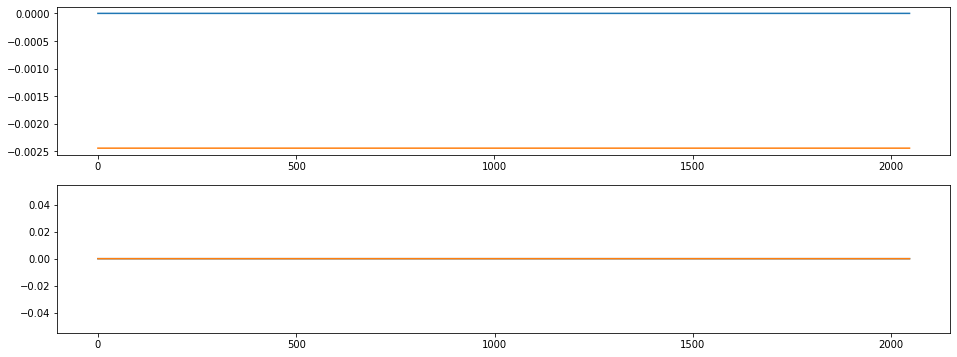

index:  131151
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


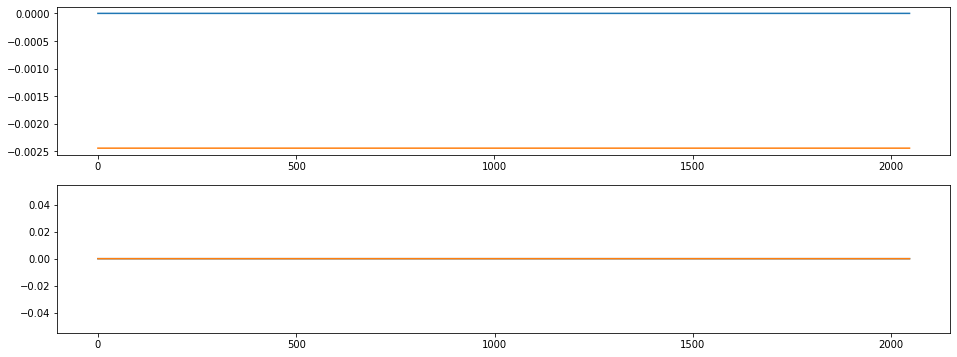

index:  132751
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


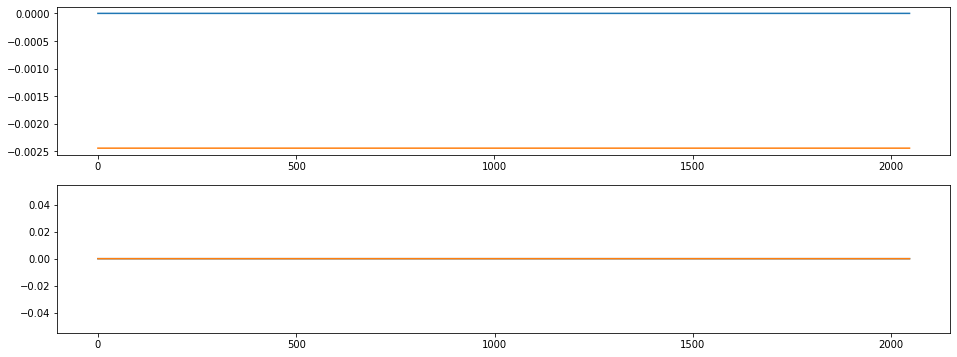

index:  131152
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


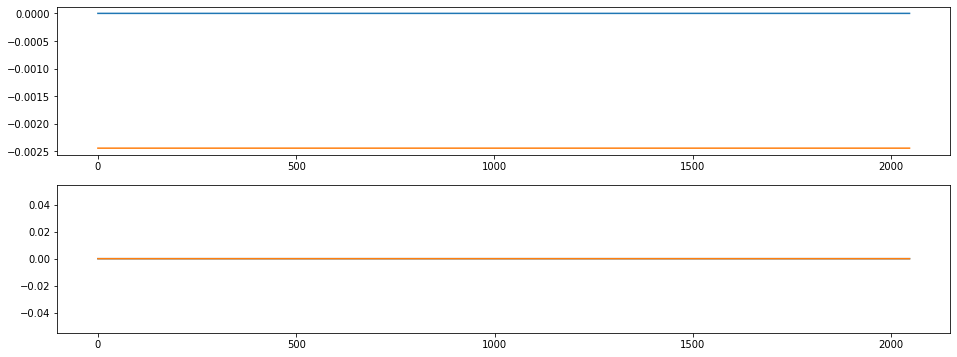

index:  131153
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


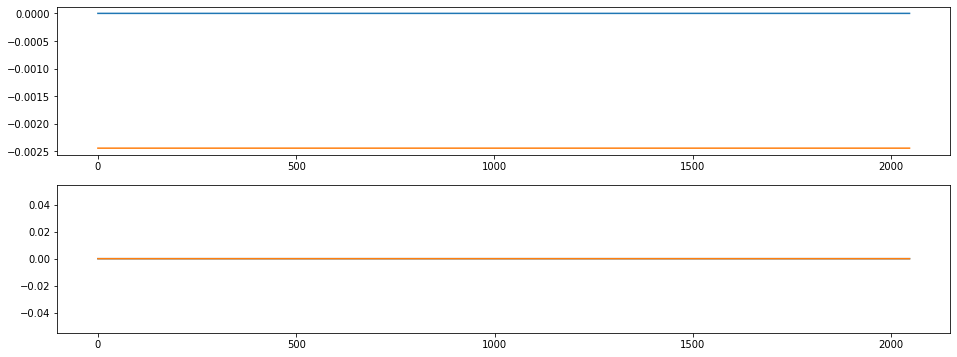

index:  131154
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


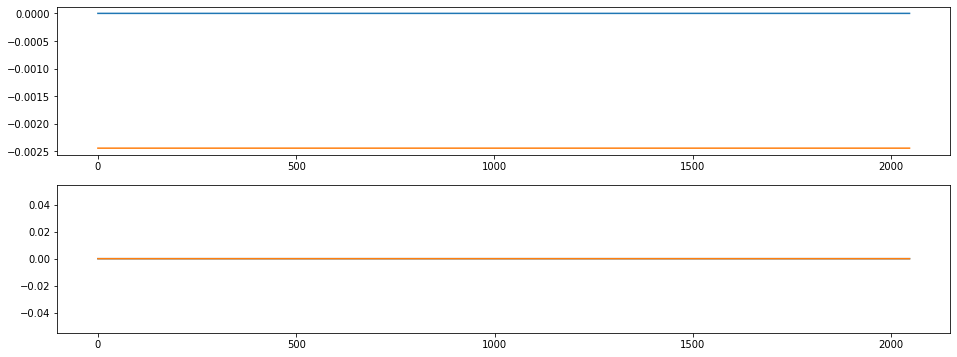

index:  131155
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


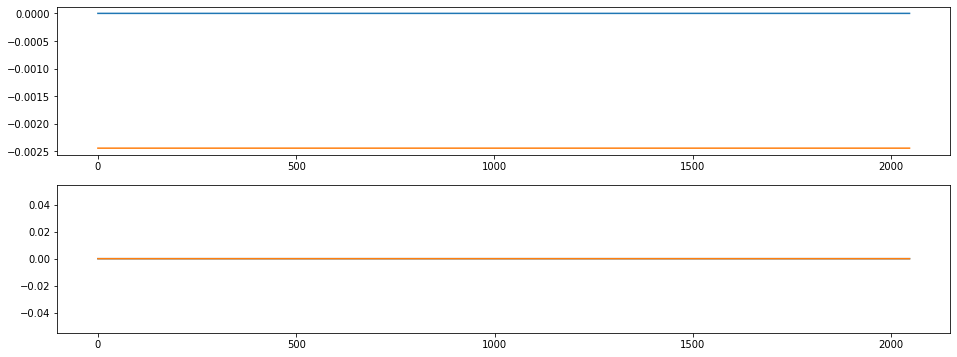

index:  132750
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


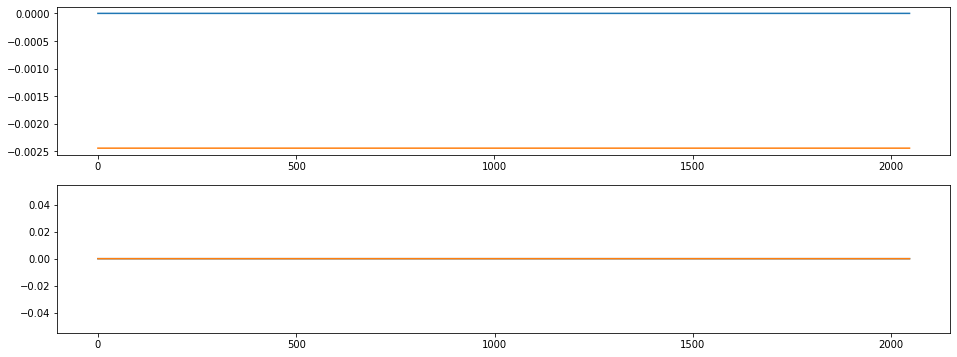

index:  131156
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


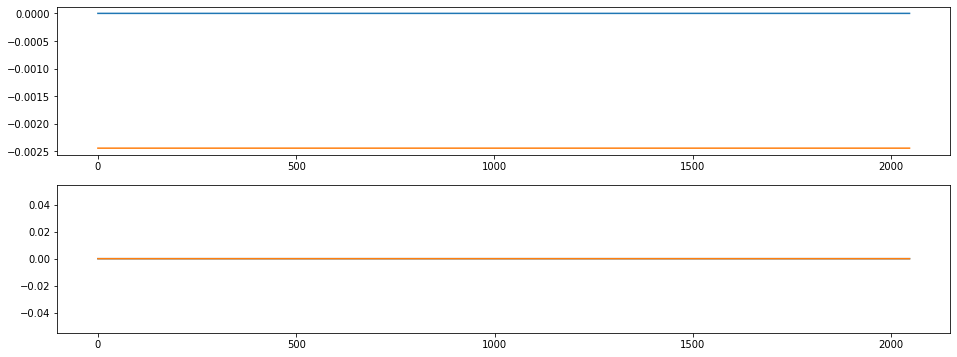

index:  131157
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


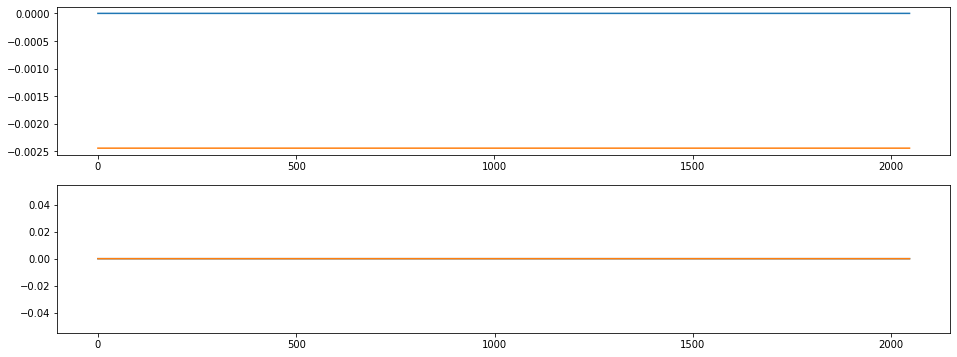

index:  132749
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


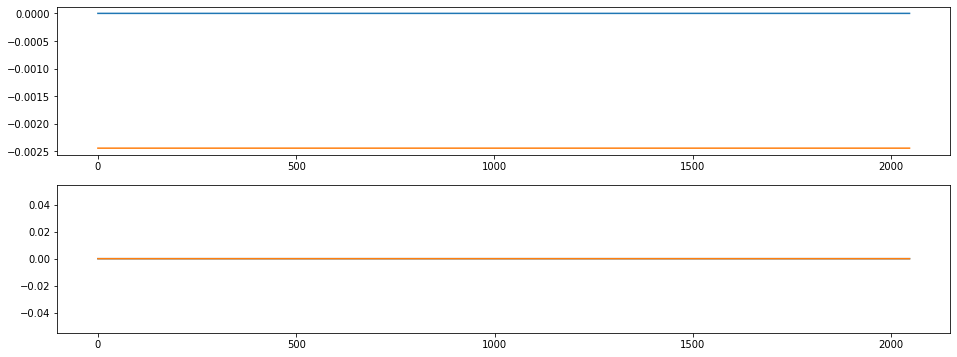

index:  132748
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


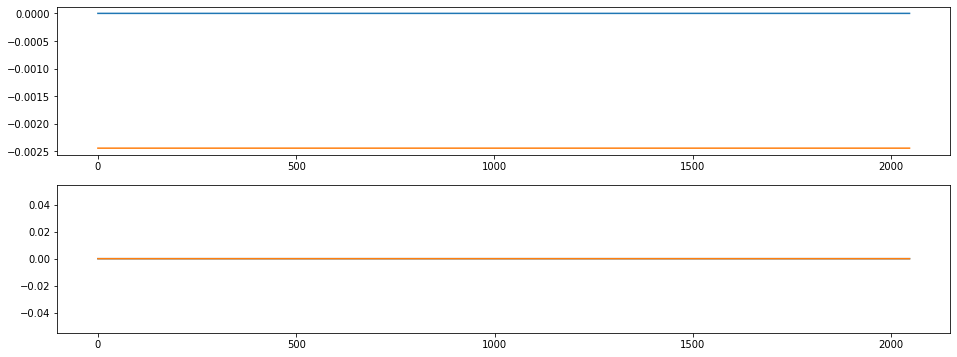

index:  131158
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


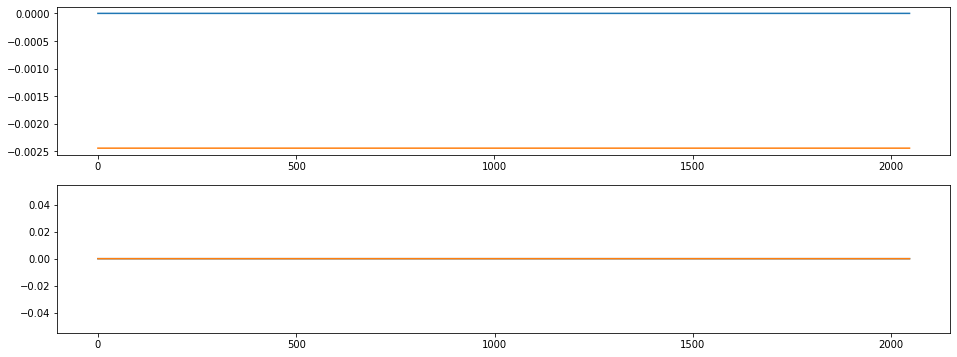

index:  131150
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


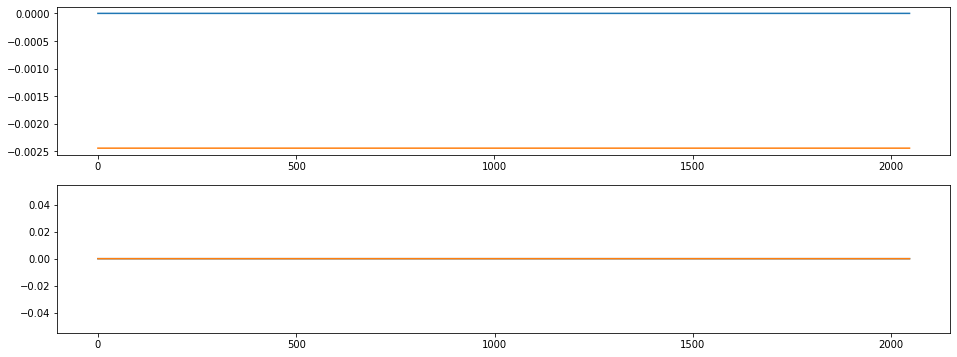

index:  131159
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


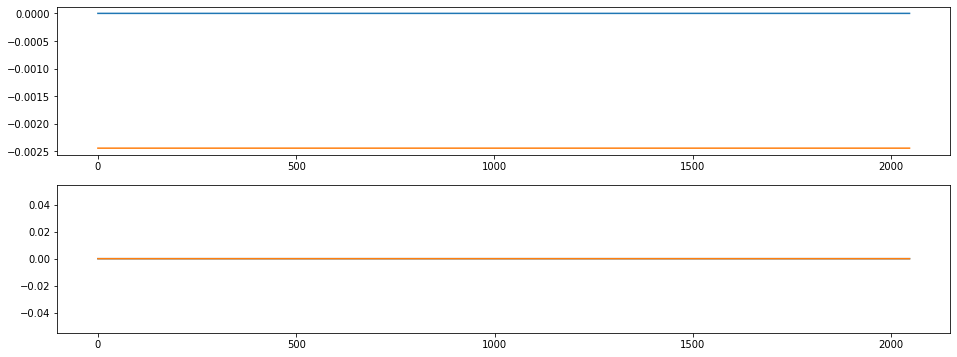

index:  32773
MAE:  0.00244385888800025
n_bunches        972
bunch_index     1738
bunch_number     918
Name: 1131, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


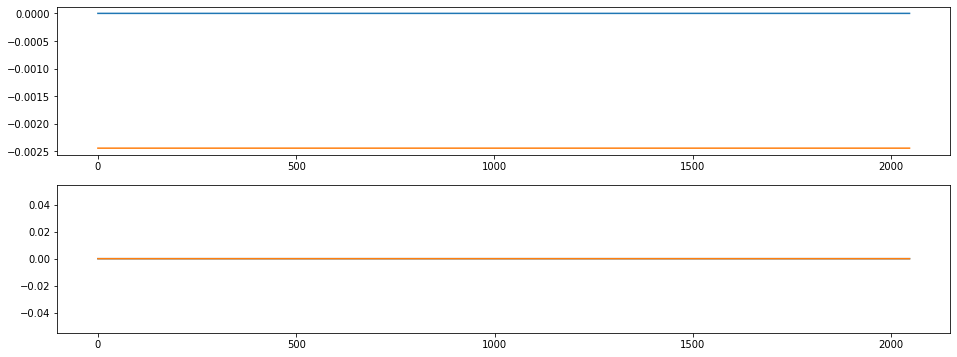

index:  132746
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


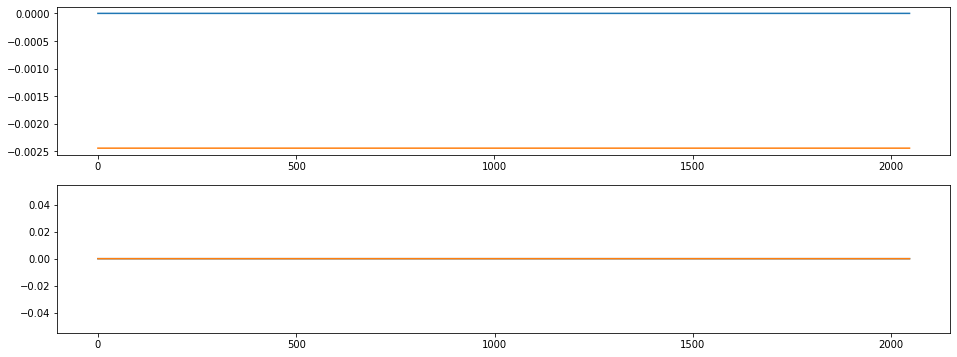

index:  132745
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


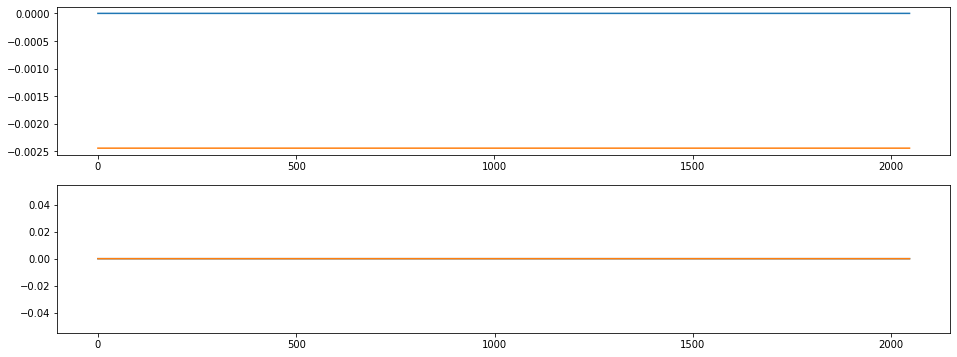

index:  132744
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


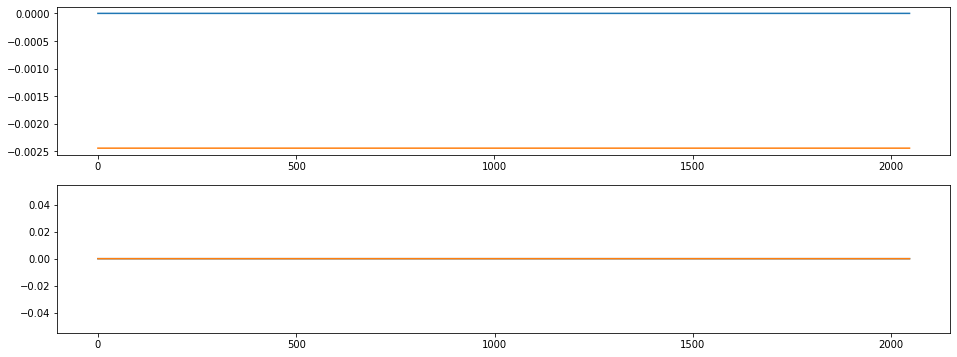

index:  132743
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


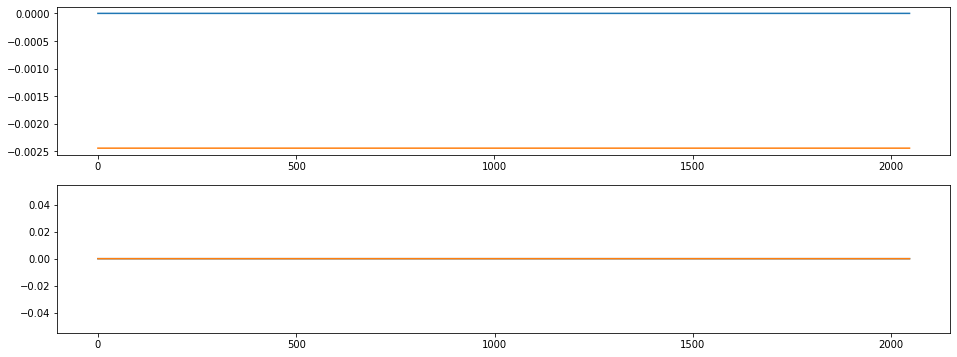

index:  131160
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


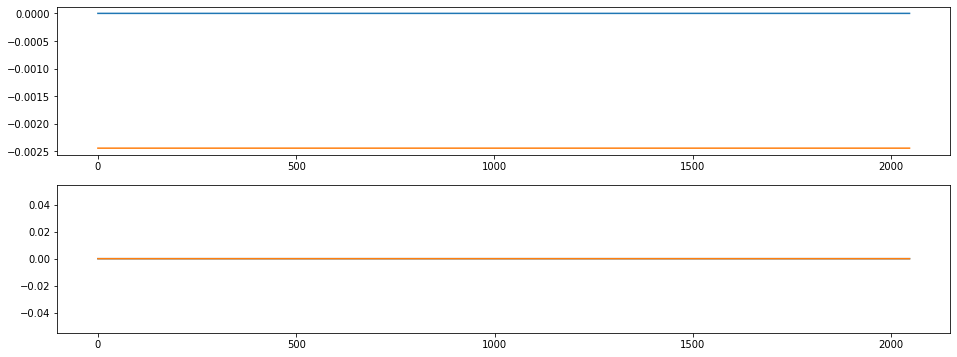

index:  131161
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


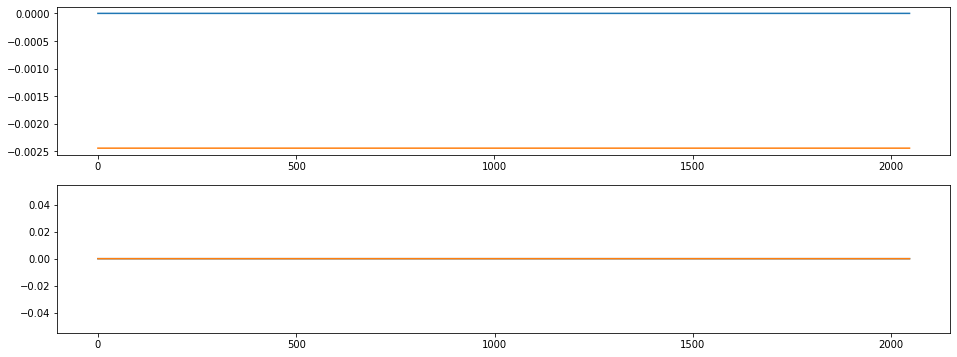

index:  132742
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


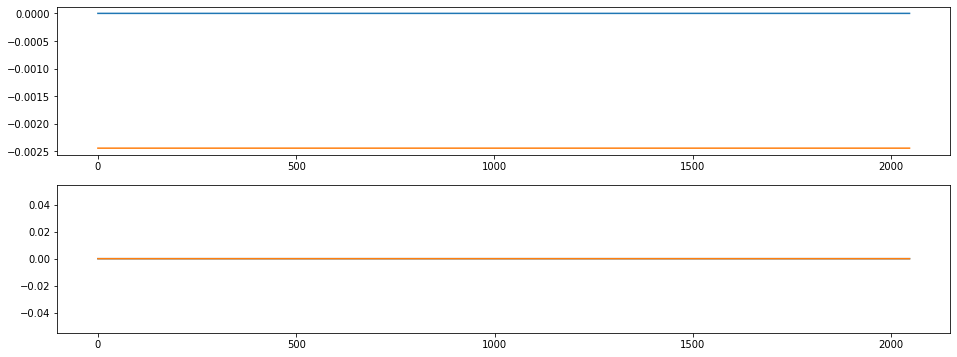

index:  131162
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


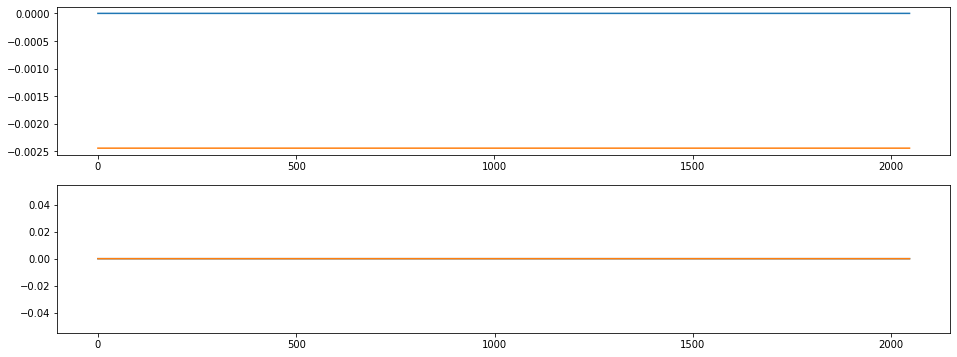

index:  32772
MAE:  0.00244385888800025
n_bunches        972
bunch_index     1738
bunch_number     918
Name: 1131, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


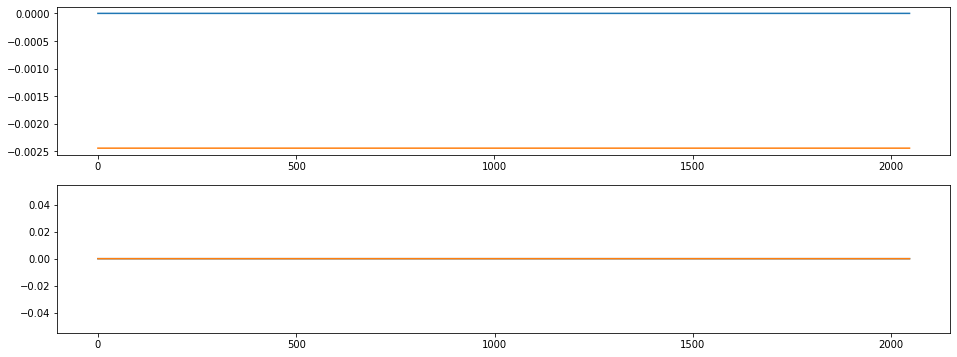

index:  131163
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


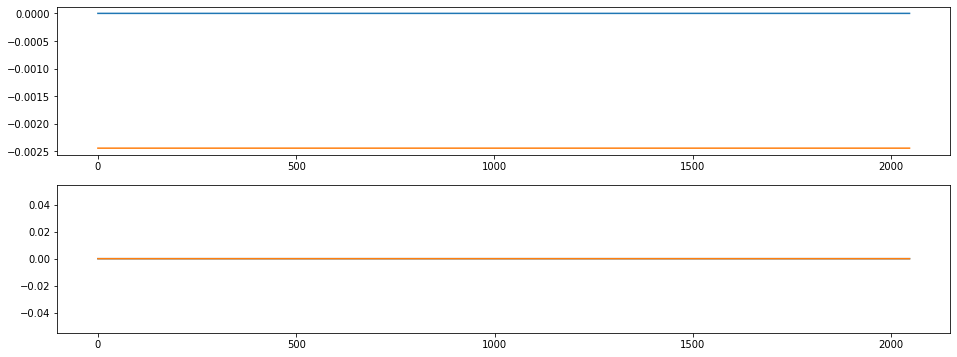

index:  132741
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


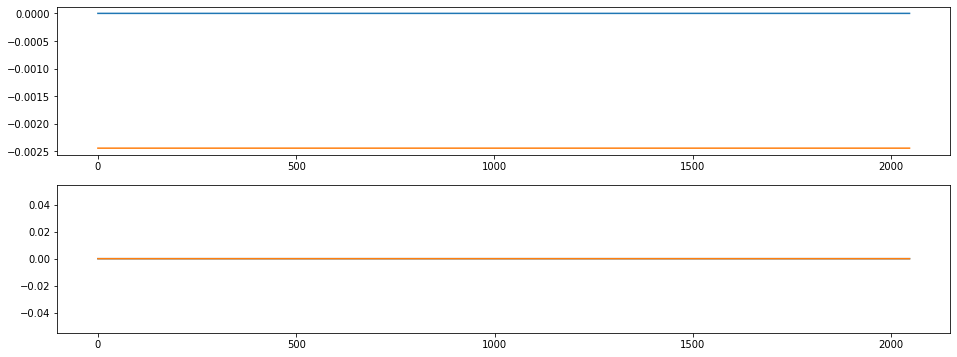

index:  132747
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


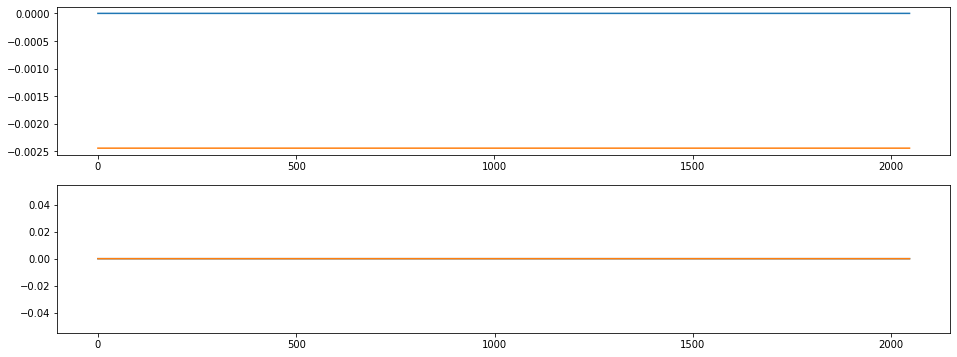

index:  17891
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


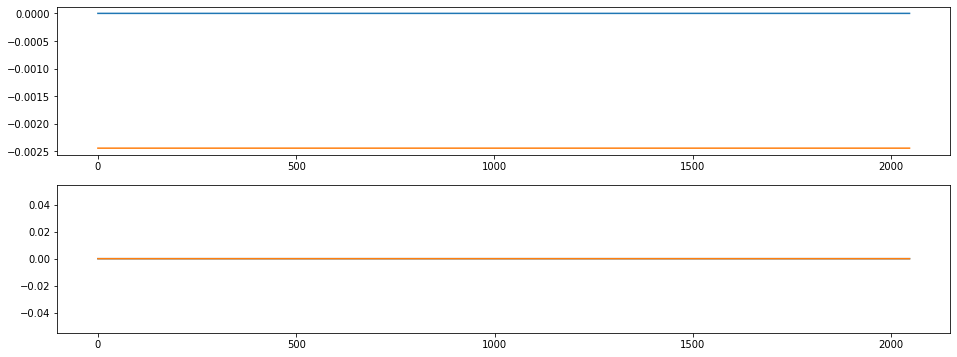

index:  131149
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


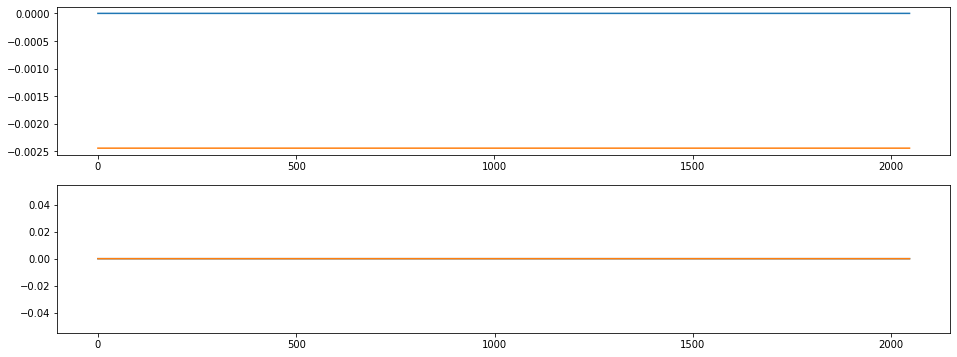

index:  131147
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1155
bunch_number     629
Name: 4563, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


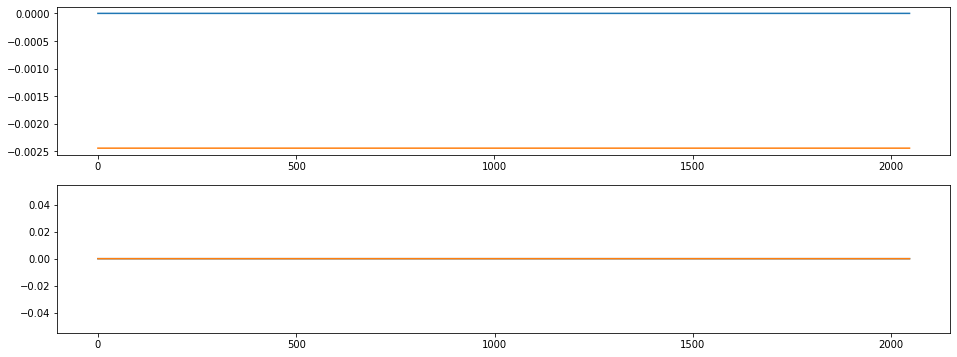

index:  17889
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


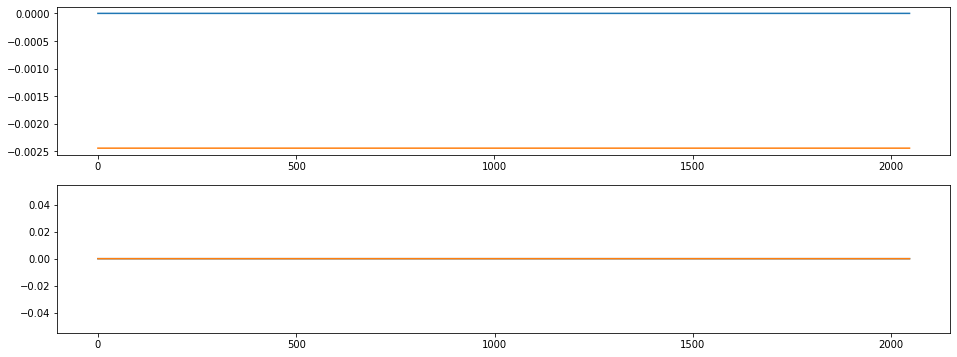

index:  17888
MAE:  0.00244385888800025
n_bunches       972
bunch_index     792
bunch_number    405
Name: 618, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


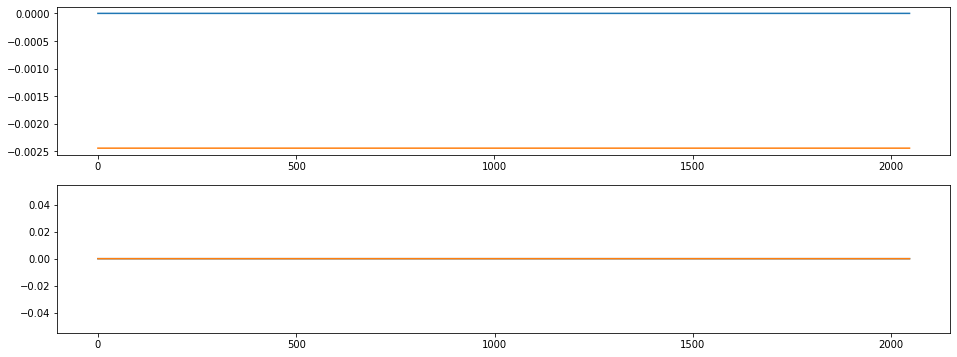

index:  17887
MAE:  0.00244385888800025
n_bunches       972
bunch_index     791
bunch_number    404
Name: 617, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


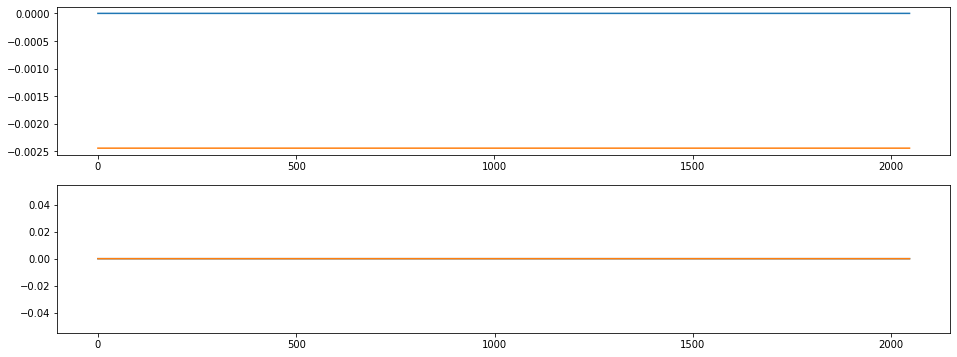

index:  17886
MAE:  0.00244385888800025
n_bunches       972
bunch_index     791
bunch_number    404
Name: 617, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


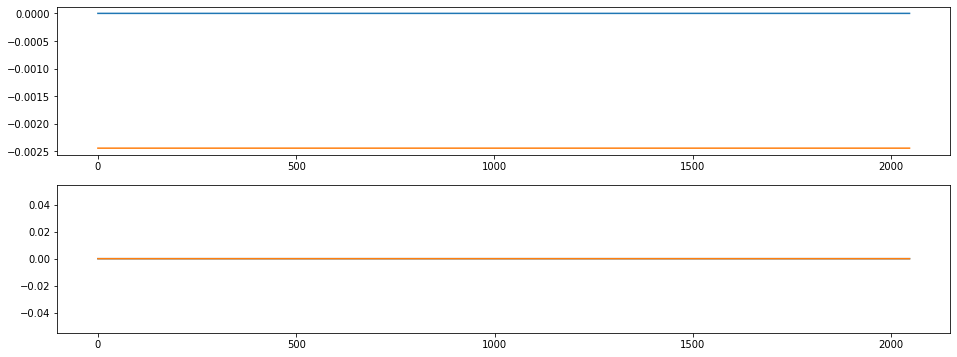

index:  17885
MAE:  0.00244385888800025
n_bunches       972
bunch_index     791
bunch_number    404
Name: 617, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


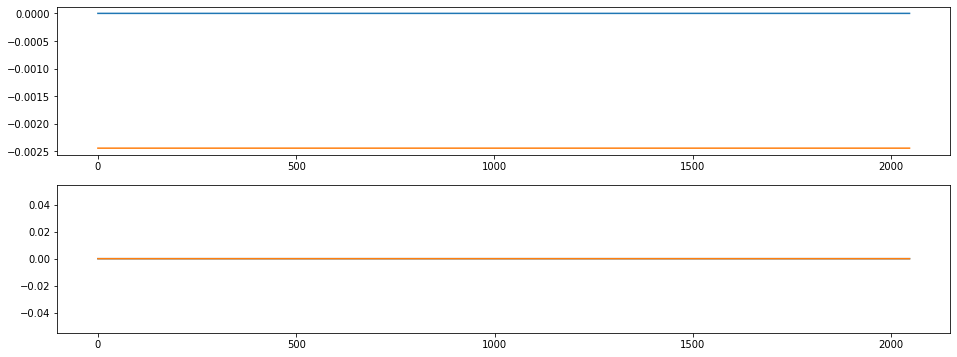

index:  132756
MAE:  0.00244385888800025
n_bunches        796
bunch_index     1232
bunch_number     682
Name: 4616, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/instability_data/06192_Inst_B1H_Q7_20170912_17h19m38s.h5


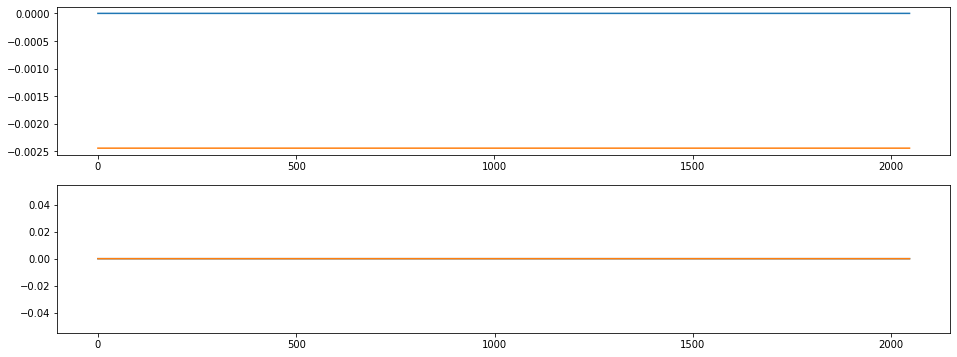

index:  17884
MAE:  0.00244385888800025
n_bunches       972
bunch_index     791
bunch_number    404
Name: 617, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


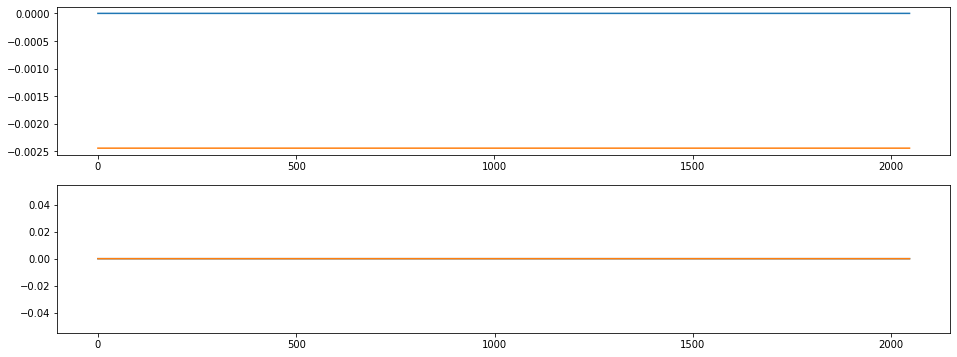

index:  17883
MAE:  0.00244385888800025
n_bunches       972
bunch_index     791
bunch_number    404
Name: 617, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


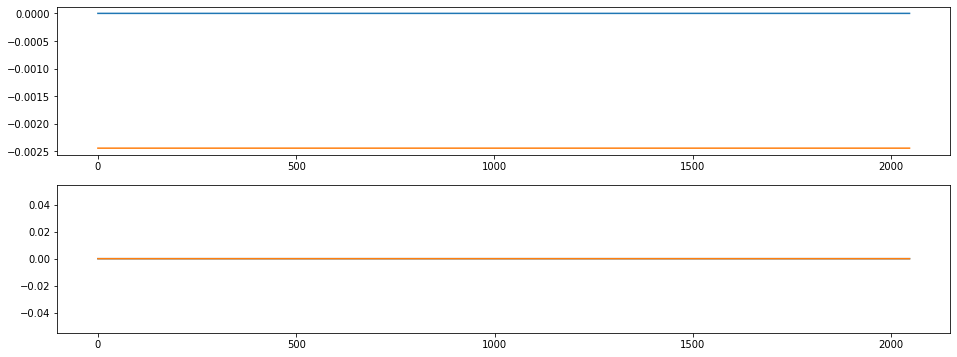

index:  17882
MAE:  0.00244385888800025
n_bunches       972
bunch_index     791
bunch_number    404
Name: 617, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


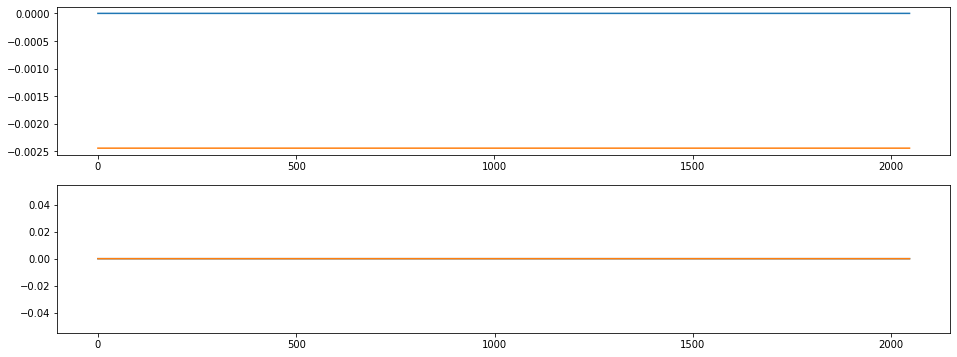

In [44]:
for i in range(1, 101):
    left_most = -i
    left_most_index = max_MAE_indices[left_most]

    print('index: ', left_most_index)
    print("MAE: ", MAE_train[left_most_index])
    # I'm not sure this row is correct
    metadata_row = train_generator.metadata.iloc[left_most_index // 32]
    print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
    print(metadata_row['file'])


    true_signal = train_dataset[left_most_index].squeeze()
    pred_signal = train_pred[left_most_index].squeeze()

    plot_true_pred(true_signal, pred_signal)
    plt.show()

# Signals around the peak

In [38]:
around_peak_indices = np.argsort(np.abs(MAE_train - hist_peak_train))

index:  32389
MAE:  0.021271289318897435
n_bunches        972
bunch_index     1713
bunch_number     904
Name: 1117, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_01h30m07s.h5


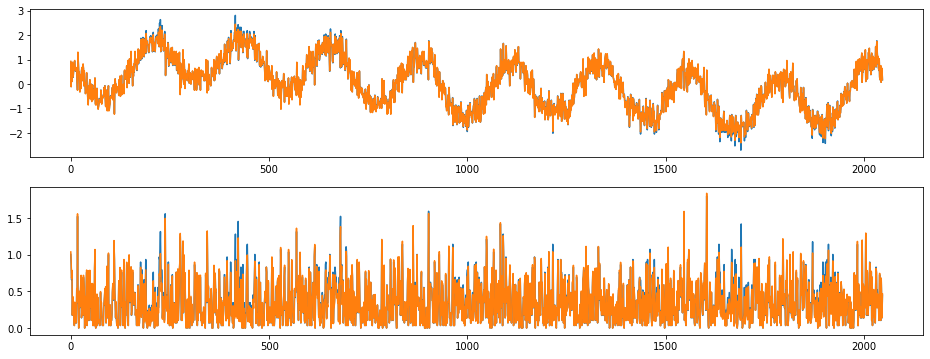

index:  646098
MAE:  0.021271294355375704
n_bunches       1916
bunch_index     2225
bunch_number    1226
Name: 22415, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6189/instability_data/06189_Inst_B1H_Q7_20170911_15h27m13s.h5


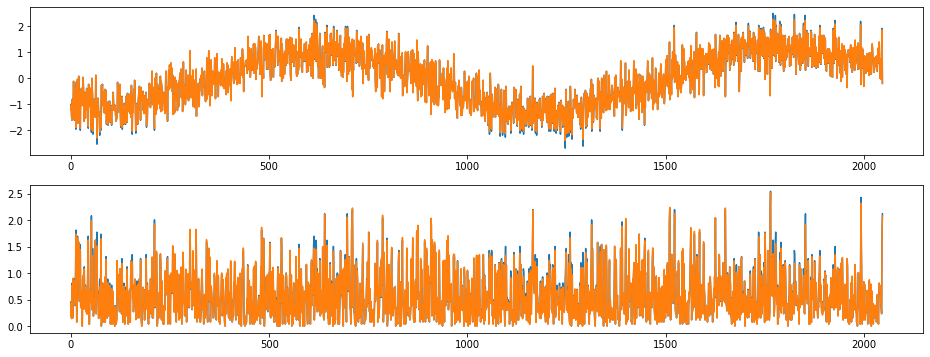

index:  246419
MAE:  0.021271294891578082
n_bunches       300
bunch_index     532
bunch_number    290
Name: 8531, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6989/instability_data/06989_Inst_B1H_Q7_20180727_06h58m14s.h5


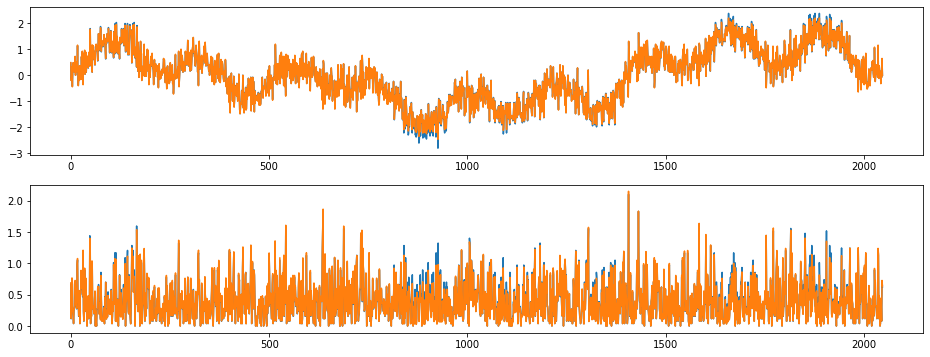

index:  323053
MAE:  0.021271294953492982
n_bunches       1358
bunch_index      268
bunch_number      87
Name: 11210, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6239/instability_data/06239_Inst_B1H_Q7_20170924_06h23m14s.h5


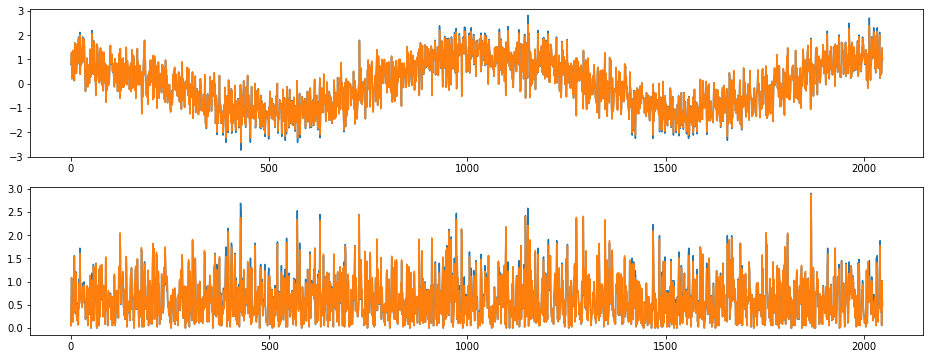

index:  474765
MAE:  0.021271297808171864
n_bunches        964
bunch_index     1788
bunch_number     856
Name: 16479, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6170/instability_data/06170_Inst_B1H_Q7_20170905_19h49m07s.h5


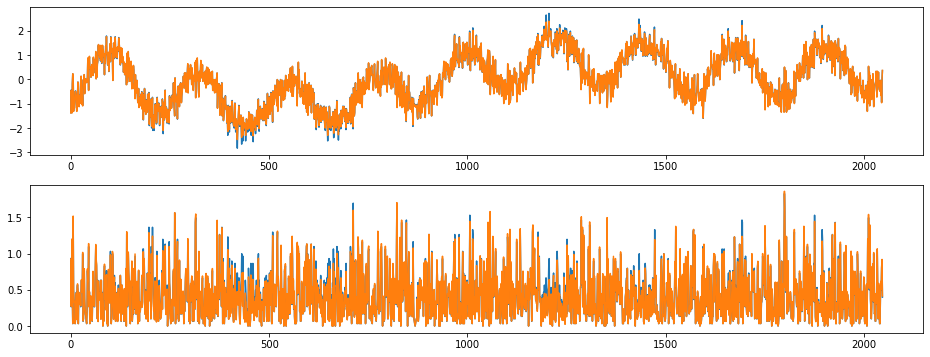

index:  694182
MAE:  0.021271301839358367
n_bunches       924
bunch_index     989
bunch_number    718
Name: 24088, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7239/instability_data/07239_Inst_B1H_Q7_20180930_12h15m49s.h5


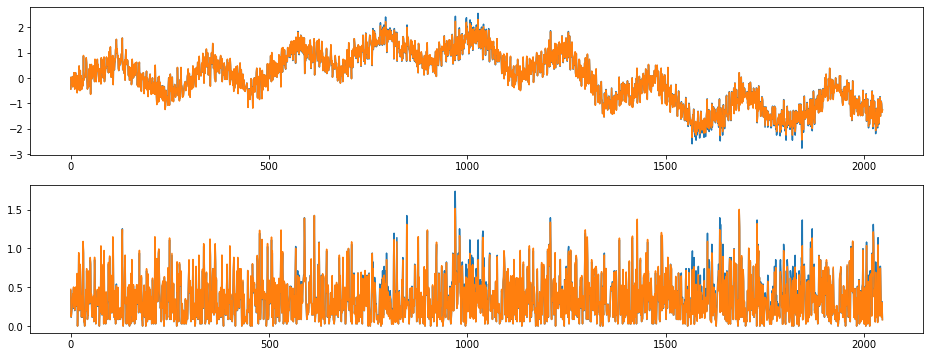

index:  357469
MAE:  0.02127128064486533
n_bunches       1358
bunch_index     3284
bunch_number    1281
Name: 12404, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6239/instability_data/06239_Inst_B1H_Q7_20170924_06h23m14s.h5


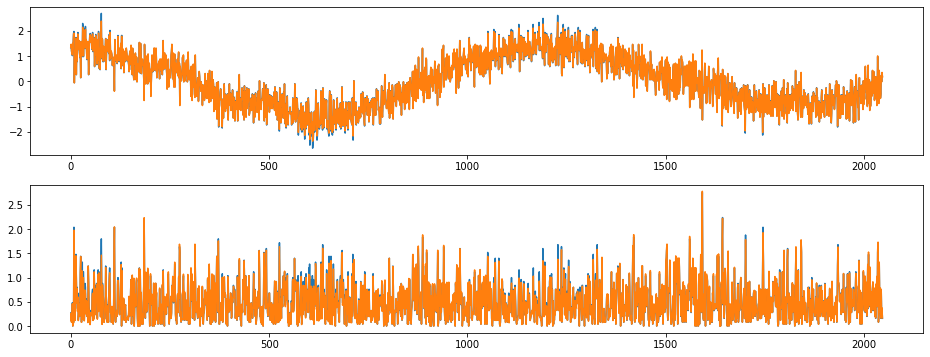

index:  214771
MAE:  0.02127127853867332
n_bunches       987
bunch_index     570
bunch_number    222
Name: 7450, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6706/instability_data/06706_Inst_B1H_Q7_20180520_12h23m14s.h5


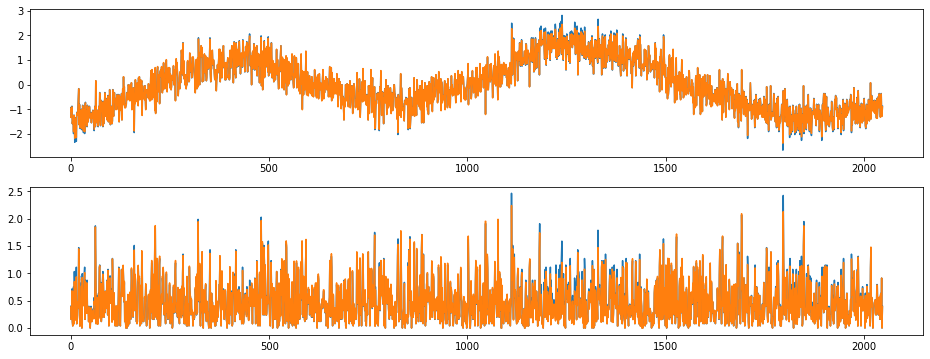

index:  158751
MAE:  0.02127130939018388
n_bunches       684
bunch_index     389
bunch_number    202
Name: 5516, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6247/instability_data/06247_Inst_B1H_Q7_20170927_07h40m43s.h5


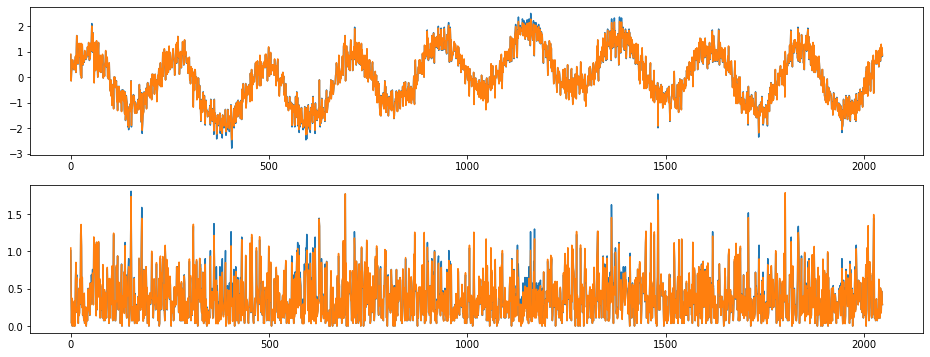

index:  690813
MAE:  0.021271314935195455
n_bunches       924
bunch_index     832
bunch_number    599
Name: 23969, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7239/instability_data/07239_Inst_B1H_Q7_20180930_12h15m49s.h5


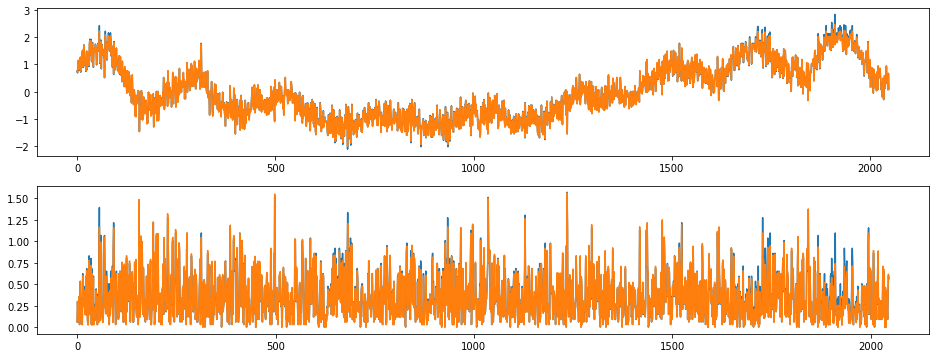

In [39]:
for i in range(10):
    around_peak_index = around_peak_indices[i]

    print('index: ', around_peak_index)
    print("MAE: ", MAE_train[around_peak_index])
    # I'm not sure this row is correct
    metadata_row = train_generator.metadata.iloc[around_peak_index // 32]
    print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
    print(metadata_row['file'])

    true_signal = train_dataset[around_peak_index].squeeze()
    pred_signal = train_pred[around_peak_index].squeeze()

    plot_true_pred(true_signal, pred_signal)
    plt.show()